In [2]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout, GRU
import matplotlib.pyplot as plt

In [4]:
file= '../data/poduction.csv'
data=pd.read_csv(file)

grouped_data = data.groupby(['county', 'product_type', 'is_business'])

df = grouped_data.get_group((0, 1, 0))

train_size = int(len(df) * 0.8)
train_df = df[:train_size]
test_df = df[train_size:]

In [11]:
cluster=pd.read_csv('../clustering/clutser_client_production_pdf.csv')
clustering=pd.merge(data,cluster, on=['county', 'product_type', 'is_business'],how='inner')

In [6]:

from sklearn.model_selection import KFold
from keras.regularizers import l2

# Define the columns for training
cols = ['eic_count', 'installed_capacity', 'temperature', 'dewpoint',
        'rain', 'snowfall', 'surface_pressure', 'cloudcover_total', 'windspeed_10m',
        'winddirection_10m', 'shortwave_radiation', 'direct_solar_radiation',
        'diffuse_radiation', 'lowest_price_per_mwh', 'highest_price_per_mwh',
        'elect_prices', 'target']

# Initialize an empty DataFrame to store the scaled data
scaled_data = pd.DataFrame()

df_for_training = train_df[cols].astype(float)
scaler = StandardScaler()
df_for_training_scaled = scaler.fit_transform(df_for_training)

trainX = []
trainY = []
n_future = 1  # Number of days we want to look into the future based on the past days.
n_past = 24  # Number of past days we want to use to predict the future.

for i in range(n_past, len(df_for_training_scaled) - n_future + 1):
    trainX.append(df_for_training_scaled[i - n_past:i])
    trainY.append(df_for_training_scaled[i + n_future - 1:i + n_future, -1])  # Target column is the last one

trainX, trainY = np.array(trainX), np.array(trainY)

print('trainX shape == {}.'.format(trainX.shape))
print('trainY shape == {}.'.format(trainY.shape))

# Define the number of folds for cross-validation
k_folds = 5
kf = KFold(n_splits=k_folds)

for train_index, val_index in kf.split(trainX):
    train_X, val_X = trainX[train_index], trainX[val_index]
    train_Y, val_Y = trainY[train_index], trainY[val_index]

    total_samples = len(trainX) + len(val_X)
    train_percent = len(train_X) / total_samples * 100
    val_percent = len(val_X) / total_samples * 100

    print(f"Training set: {len(train_X)} samples ({train_percent:.2f}%)")
    print(f"Validation set: {len(val_X)} samples ({val_percent:.2f}%)")
    print()


    model = Sequential()
    model.add(GRU(64, activation='relu', input_shape=(train_X.shape[1], train_X.shape[2]), return_sequences=True))
    model.add(GRU(32, activation='relu', return_sequences=False))
    model.add(Dropout(0.2))
    model.add(Dense(1, kernel_regularizer=l2(0.01)))  # Output dimension is 1 as we're predicting a single value
    model.compile(optimizer='adam', loss='mse')
    model.summary()

    history = model.fit(train_X, train_Y, epochs=100, batch_size=10, validation_data=(val_X, val_Y), verbose=1)

    plt.plot(history.history['loss'], label='Training loss')
    plt.plot(history.history['val_loss'], label='Validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()




trainX shape == (5571, 24, 17).
trainY shape == (5571, 1).
Training set: 4456 samples (66.65%)
Validation set: 1115 samples (16.68%)



C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ gru_2 (GRU)                          │ (None, 24, 64)              │          15,936 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ gru_3 (GRU)                          │ (None, 32)                  │           9,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 1)                   │              33 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 25,377 (99.13 KB)

 Trainable params: 25,377 (99.13 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
446/446 ━━━━━━━━━━━━━━━━━━━━ 14s 17ms/step - loss: 0.8733 - val_loss: 0.0607
Epoch 2/100
446/446 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 0.3706 - val_loss: 0.1480
Epoch 3/100
446/446 ━━━━━━━━━━━━━━━━━━━━ 13s 27ms/step - loss: 0.2059 - val_loss: 0.0461
Epoch 4/100
446/446 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.1571 - val_loss: 0.0577
Epoch 5/100
446/446 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.1336 - val_loss: 0.0635
Epoch 6/100
446/446 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step - loss: 0.1473 - val_loss: 0.0467
Epoch 7/100
446/446 ━━━━━━━━━━━━━━━━━━━━ 19s 42ms/step - loss: 0.0861 - val_loss: 0.0343
Epoch 8/100
446/446 ━━━━━━━━━━━━━━━━━━━━ 18s 39ms/step - loss: 0.1123 - val_loss: 0.0599
Epoch 9/100
446/446 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.0855 - val_loss: 0.0400
Epoch 10/100
446/446 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - loss: 0.0724 - val_loss: 0.0397
Epoch 11/100
446/446 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 0.0610 - val_loss: 0.0390
Epoch 12/100
446/44

KeyboardInterrupt: 

trainX shape == (5571, 24, 17).
trainY shape == (5571, 1).


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ gru_6 (GRU)                          │ (None, 24, 64)              │          15,936 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ gru_7 (GRU)                          │ (None, 32)                  │           9,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 1)                   │              33 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 25,377 (99.13 KB)

 Trainable params: 25,377 (99.13 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
401/401 ━━━━━━━━━━━━━━━━━━━━ 8s 12ms/step - loss: 0.9441 - val_loss: 0.0169
Epoch 2/100
401/401 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - loss: 0.4302 - val_loss: 0.0143
Epoch 3/100
401/401 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - loss: 0.2926 - val_loss: 0.0130
Epoch 4/100
401/401 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - loss: 0.2274 - val_loss: 0.0148
Epoch 5/100
401/401 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - loss: 0.1703 - val_loss: 0.0097
Epoch 6/100
401/401 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - loss: 0.1214 - val_loss: 0.0092
Epoch 7/100
401/401 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 0.1252 - val_loss: 0.0081
Epoch 8/100
401/401 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - loss: 0.1166 - val_loss: 0.0077
Epoch 9/100
401/401 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - loss: 0.1303 - val_loss: 0.0075
Epoch 10/100
401/401 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 0.0860 - val_loss: 0.0064
Epoch 11/100
401/401 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - loss: 0.1574 - val_loss: 0.0056
Epoch 12/100
401/401 ━━━━━━━━━━━

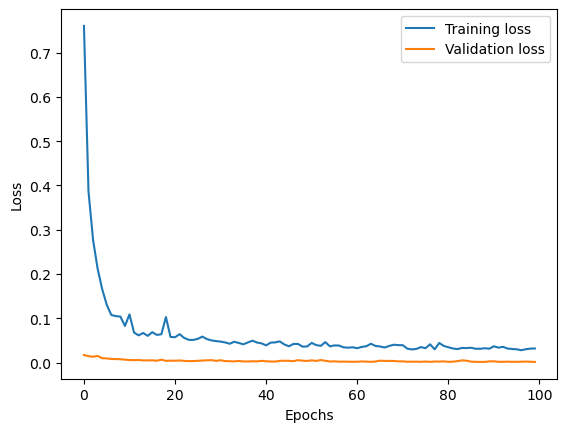

In [9]:

from sklearn.model_selection import KFold
from keras.regularizers import l2

# Define the columns for training
cols = ['eic_count', 'installed_capacity', 'temperature', 'dewpoint',
        'rain', 'snowfall', 'surface_pressure', 'cloudcover_total', 'windspeed_10m',
        'winddirection_10m', 'shortwave_radiation', 'direct_solar_radiation',
        'diffuse_radiation', 'lowest_price_per_mwh', 'highest_price_per_mwh',
        'elect_prices', 'target']

# Initialize an empty DataFrame to store the scaled data
scaled_data = pd.DataFrame()

df_for_training = train_df[cols].astype(float)
scaler = StandardScaler()
df_for_training_scaled = scaler.fit_transform(df_for_training)

trainX = []
trainY = []
n_future = 1  # Number of days we want to look into the future based on the past days.
n_past = 24  # Number of past days we want to use to predict the future.

for i in range(n_past, len(df_for_training_scaled) - n_future + 1):
    trainX.append(df_for_training_scaled[i - n_past:i])
    trainY.append(df_for_training_scaled[i + n_future - 1:i + n_future, -1])  # Target column is the last one

trainX, trainY = np.array(trainX), np.array(trainY)

print('trainX shape == {}.'.format(trainX.shape))
print('trainY shape == {}.'.format(trainY.shape))




model = Sequential()
model.add(GRU(64, activation='relu', input_shape=(train_X.shape[1], train_X.shape[2]), return_sequences=True))
model.add(GRU(32, activation='relu', return_sequences=False))
model.add(Dropout(0.2))
model.add(Dense(1, kernel_regularizer=l2(0.01)))  # Output dimension is 1 as we're predicting a single value
model.compile(optimizer='adam', loss='mse')
model.summary()

history = model.fit(train_X, train_Y, epochs=100, batch_size=10, validation_split=0.1, verbose=1)
plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()




C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step


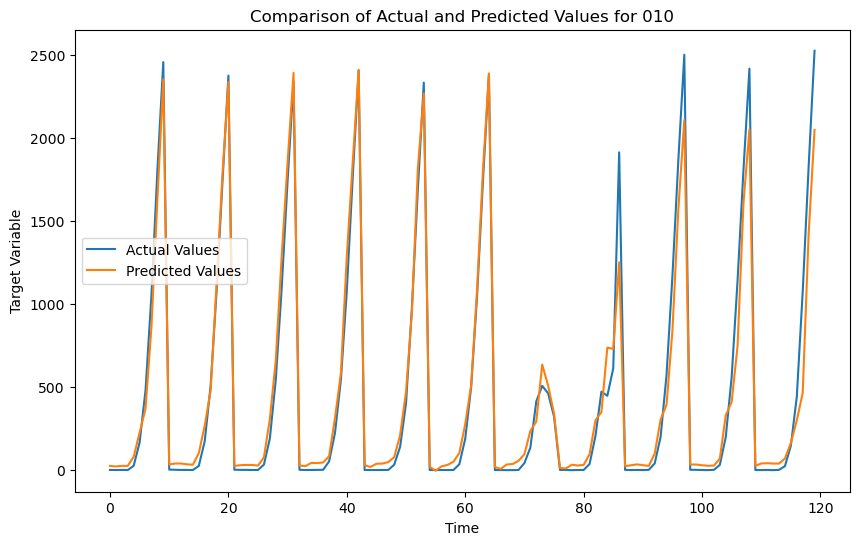

Group: 010
R2 Score: 0.9637113008794252
MSE: 21141.710188246347
RMSE: 145.4018919692806
MAE: 88.14622434280714



In [10]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from keras.models import load_model
import matplotlib.pyplot as plt

df_test = test_df[cols].astype(float)



# Use the scaler from the training to transform the test data
df_test_scaled1= scaler.fit(df_test)
df_test_scaled = scaler.transform(df_test)

# Initialize the lists for testX and testY
testX = []
testY = []
n_future = 1  # Same as during training
n_past = 24  # Same as during training

# Prepare testX and testY
for i in range(n_past, len(df_test_scaled) - n_future + 1):
    testX.append(df_test_scaled[i - n_past:i])
    testY.append(df_test_scaled[i + n_future - 1:i + n_future, -1])  # Assuming the last column is still the target

testX, testY = np.array(testX), np.array(testY)



n_days_for_prediction = 120



target_scaler = StandardScaler()
target_scaler.fit(df_test[['target']])


# Predict on the last n_days_for_prediction
prediction_scaled = model.predict(testX[-n_days_for_prediction:])
prediction = target_scaler.inverse_transform(prediction_scaled)
actual = target_scaler.inverse_transform(testY[-n_days_for_prediction:])

# Calculate the metrics
r2 = r2_score(actual, prediction)
mse = mean_squared_error(actual, prediction)
rmse = np.sqrt(mse)
mae = mean_absolute_error(actual, prediction)

# Plotting
plt.figure(figsize=(10,6))
plt.plot(actual, label='Actual Values')
plt.plot(prediction, label='Predicted Values')
plt.title(f'Comparison of Actual and Predicted Values for 010')
plt.xlabel('Time')
plt.ylabel('Target Variable')
plt.legend()
plt.show()

# Print metrics
print(f"Group: 010")
print(f"R2 Score: {r2}")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}\n")

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}


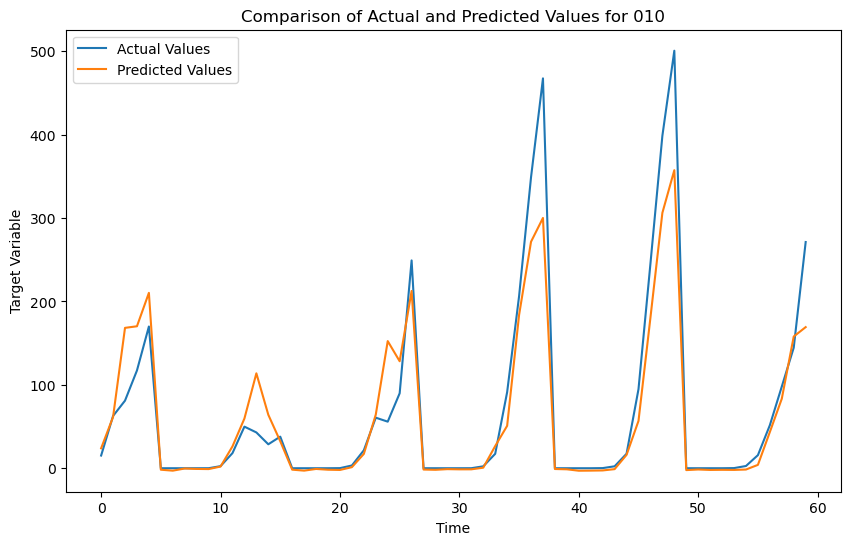

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}


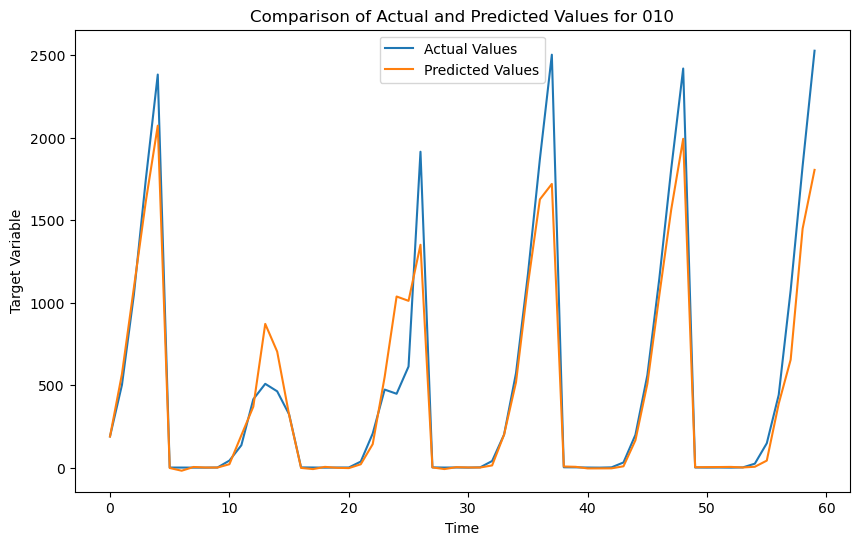

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}


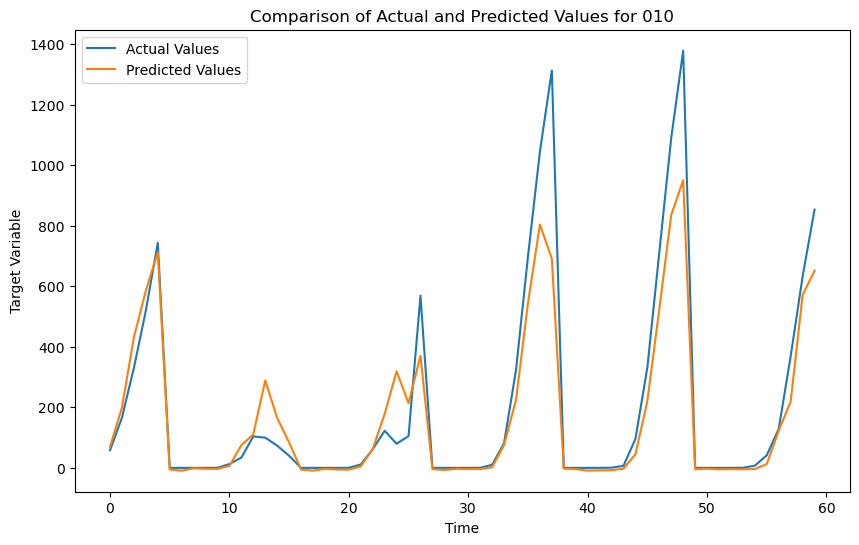

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}


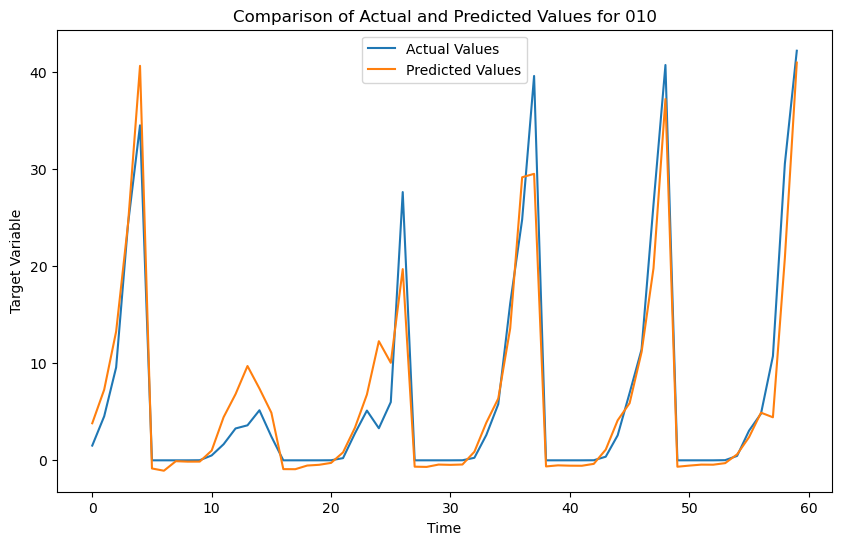

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}


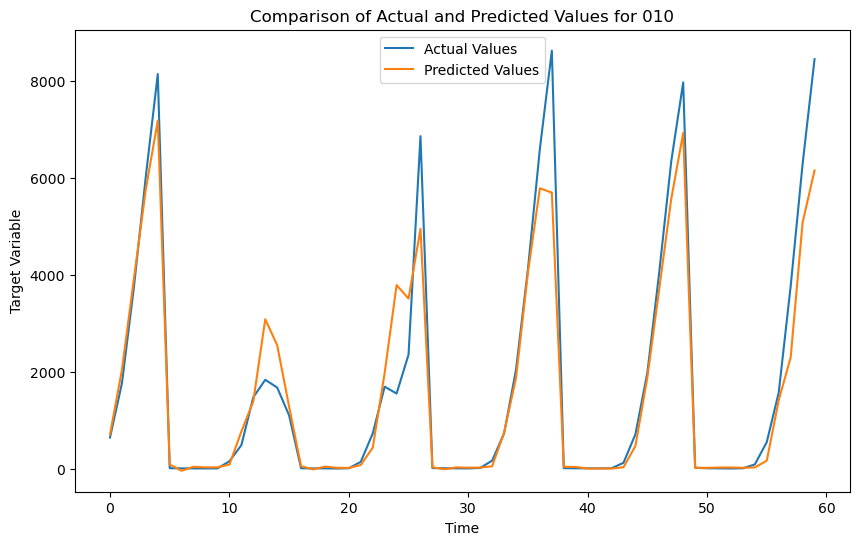

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}


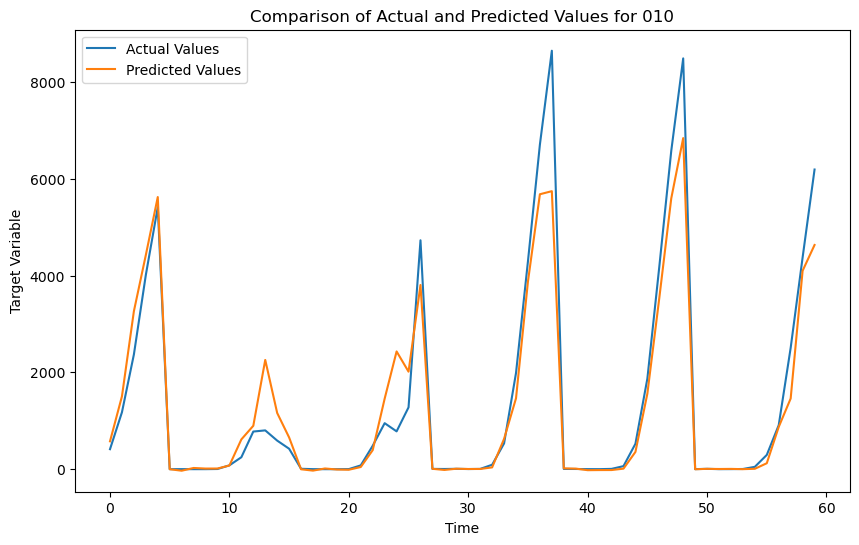

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}


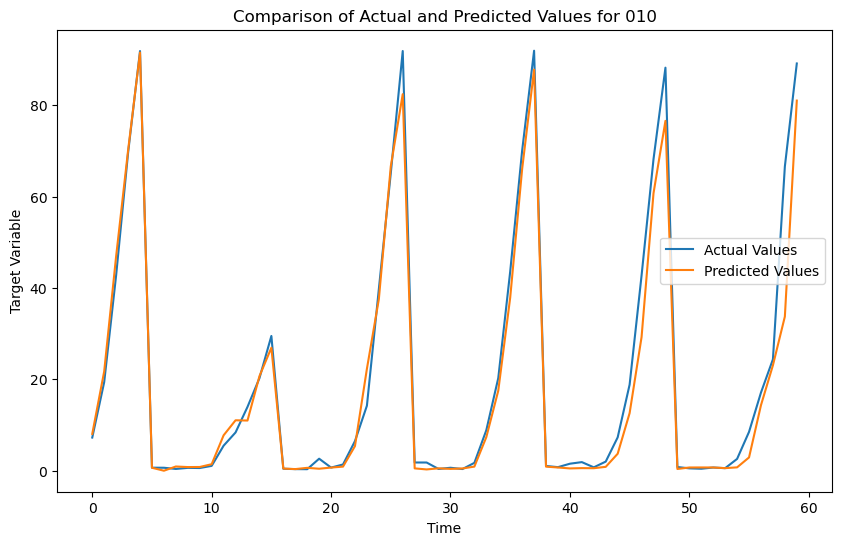

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

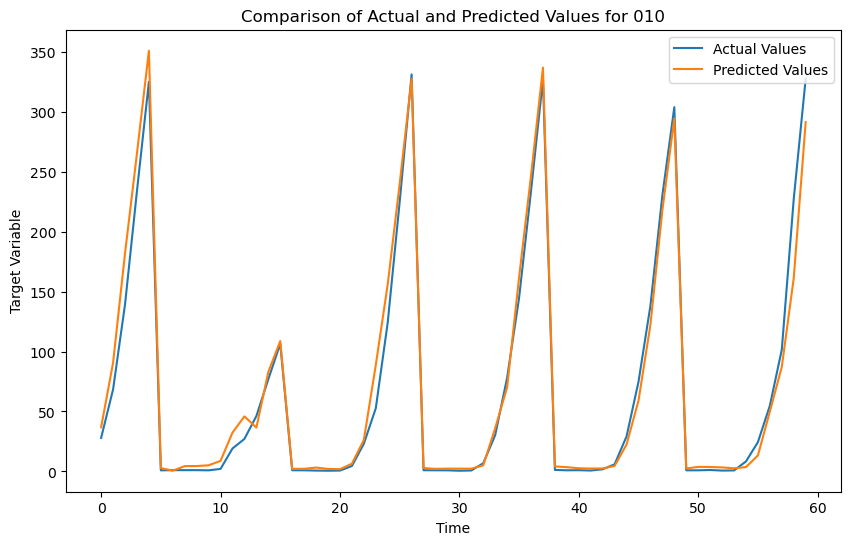

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

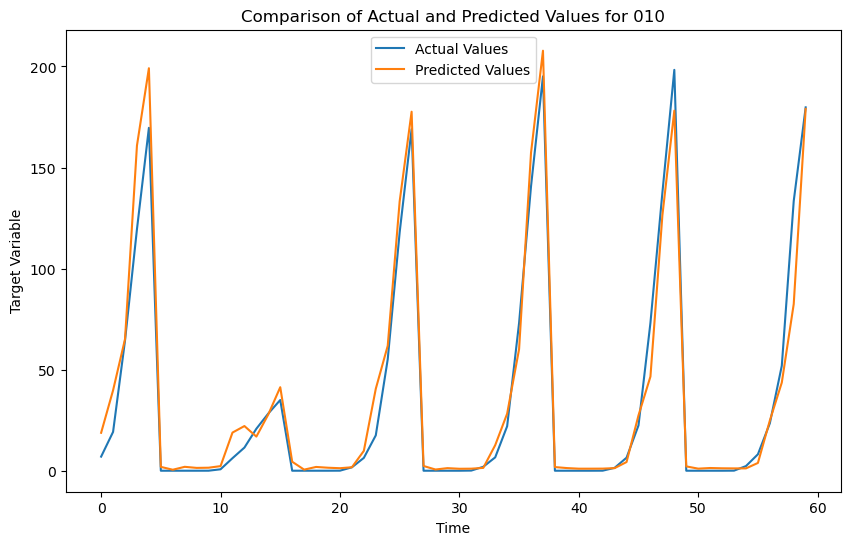

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

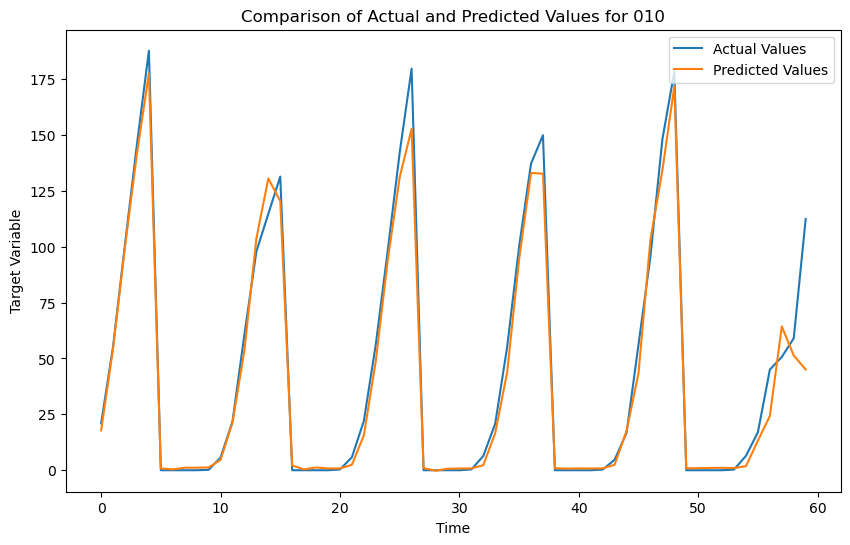

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

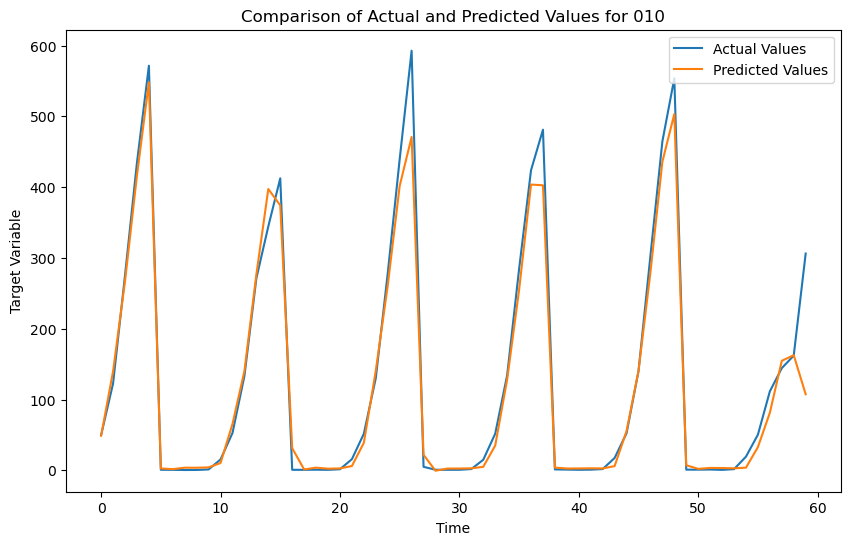

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

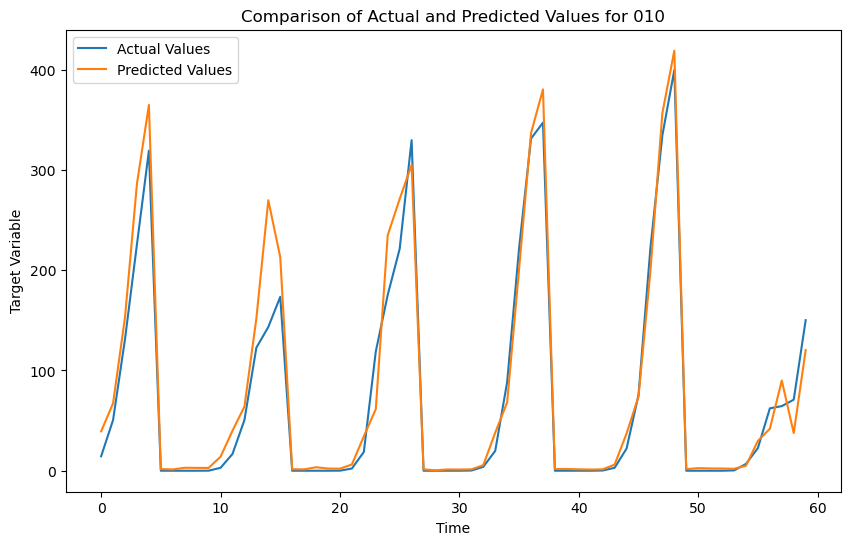

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

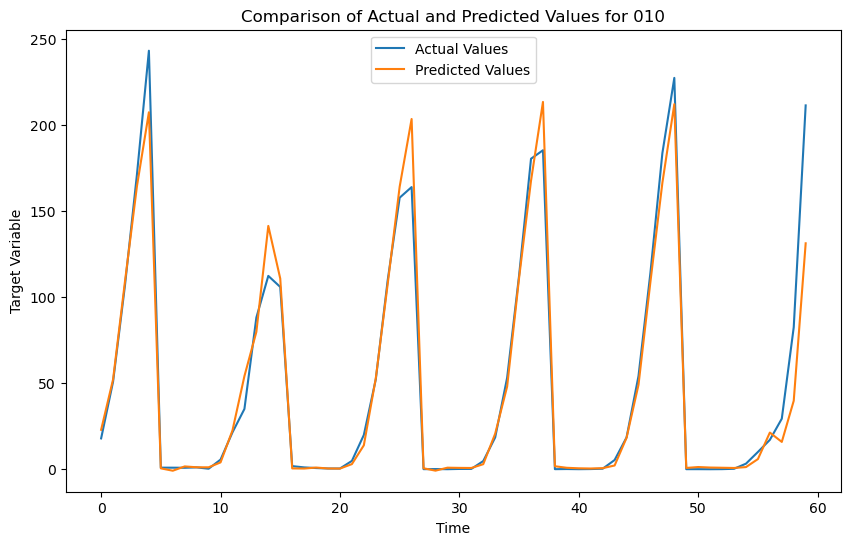

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

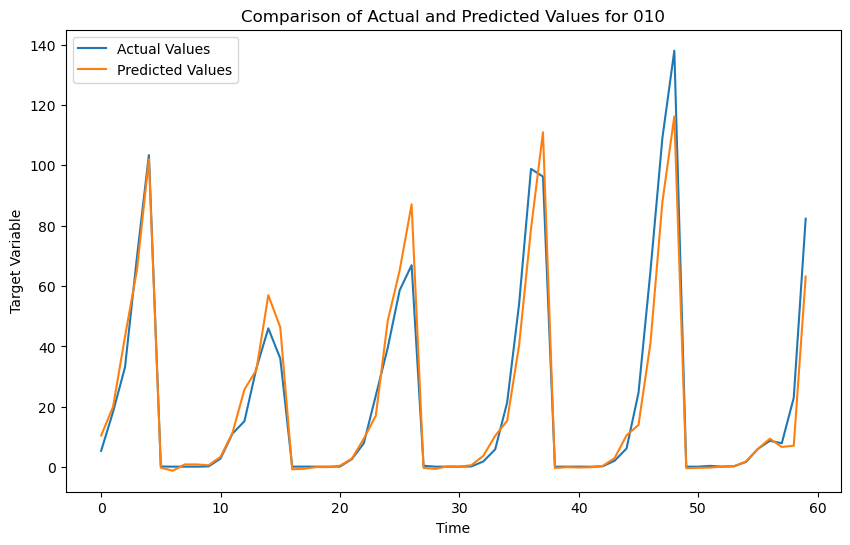

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

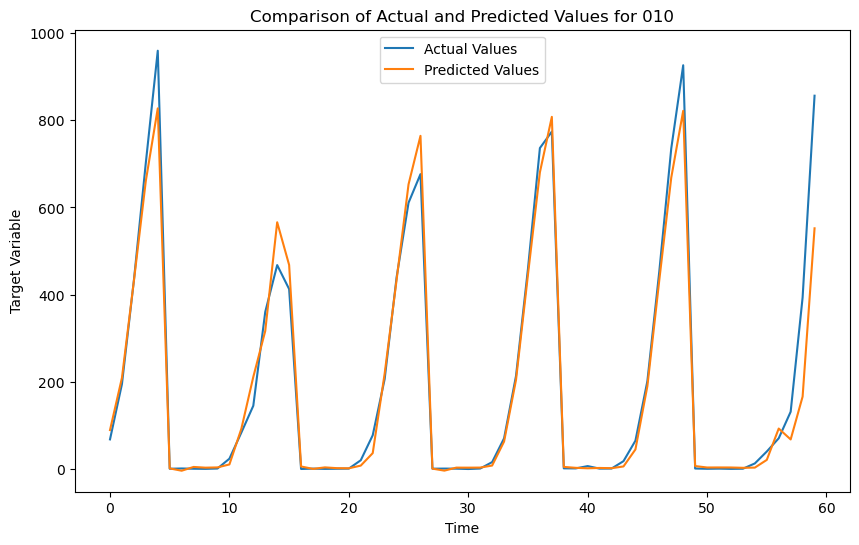

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

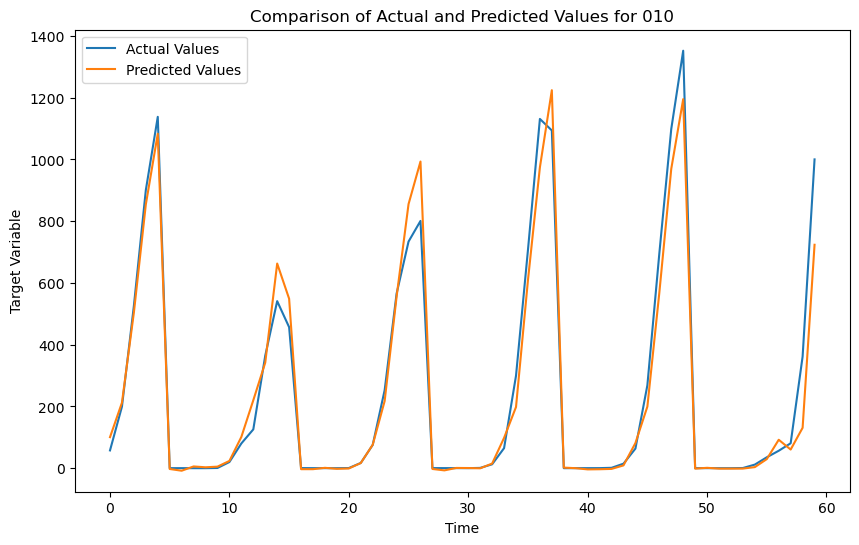

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

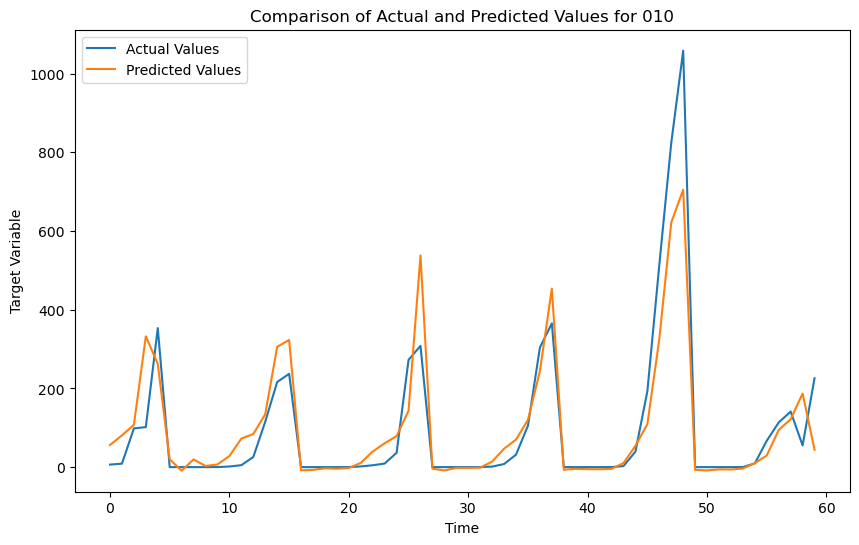

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

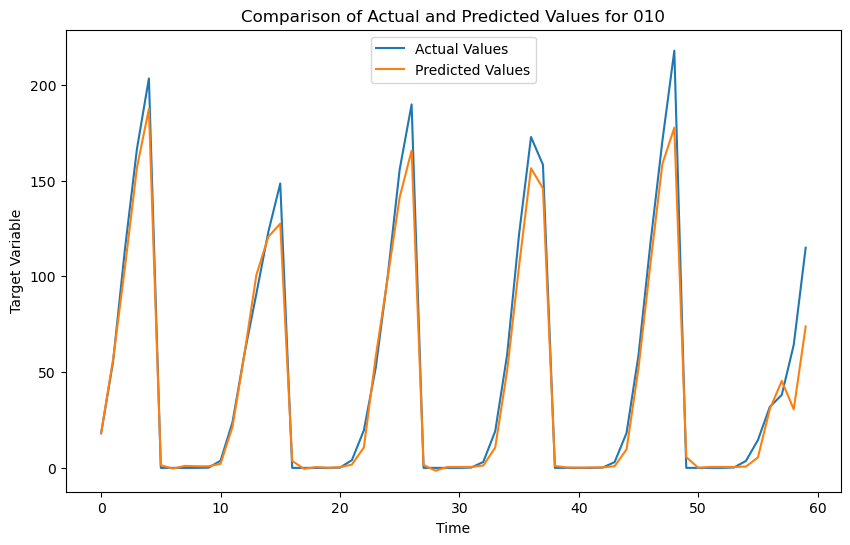

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

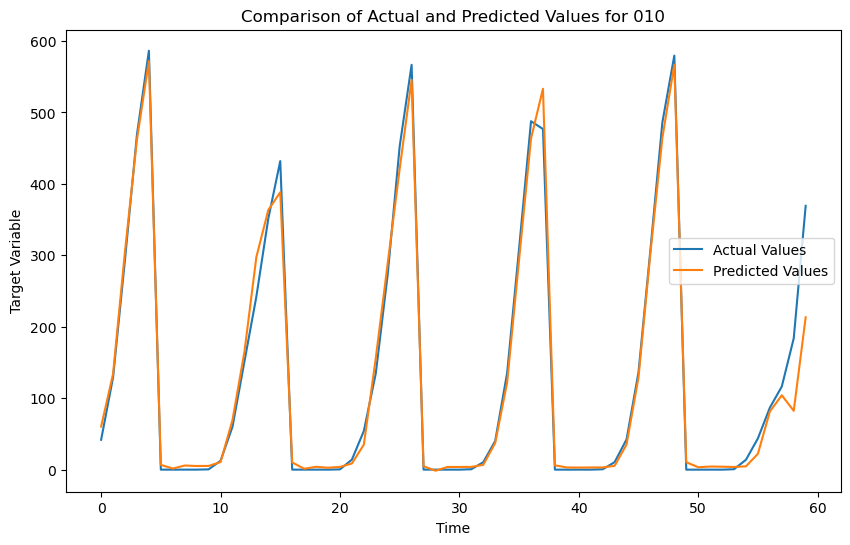

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

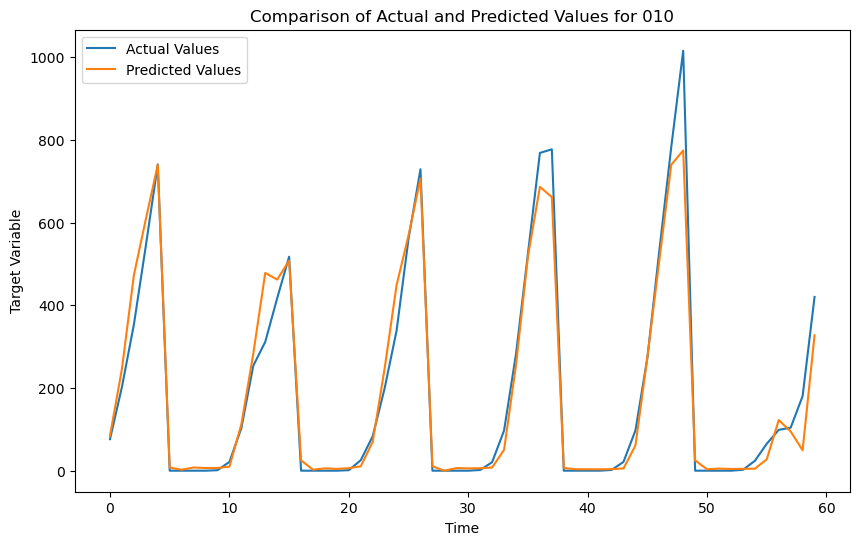

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

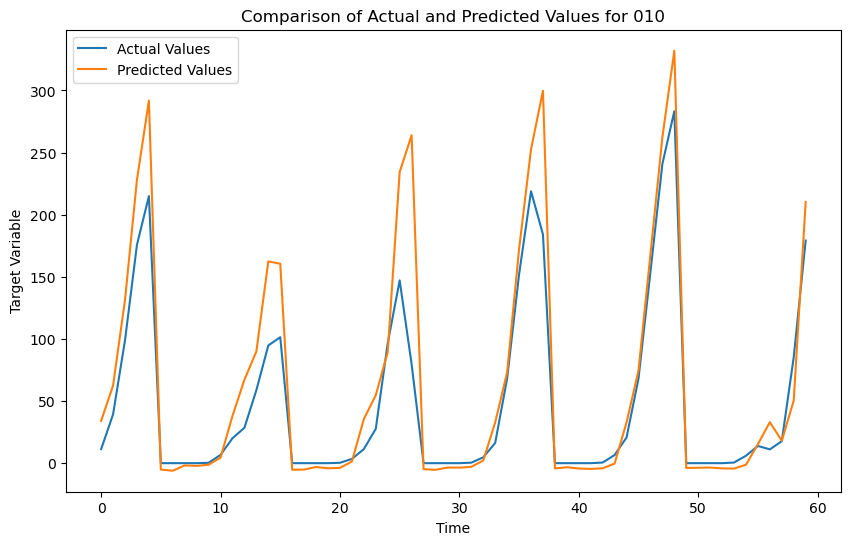

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

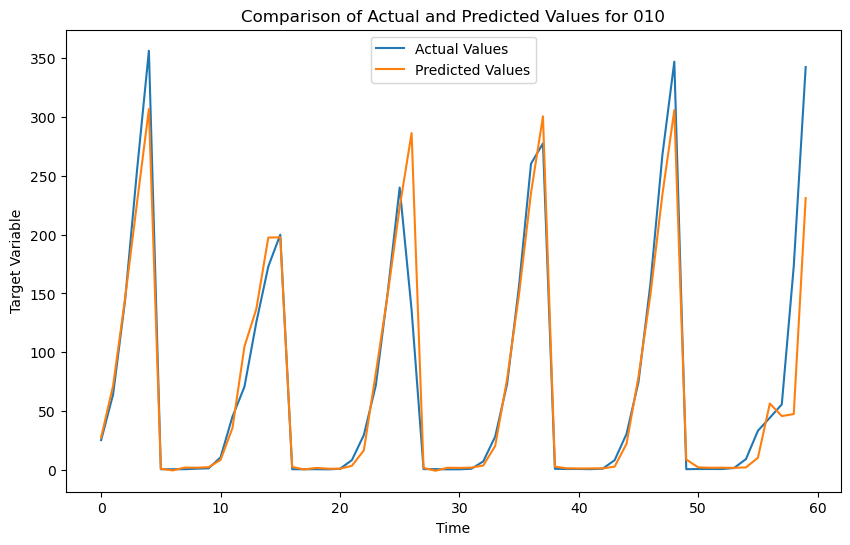

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

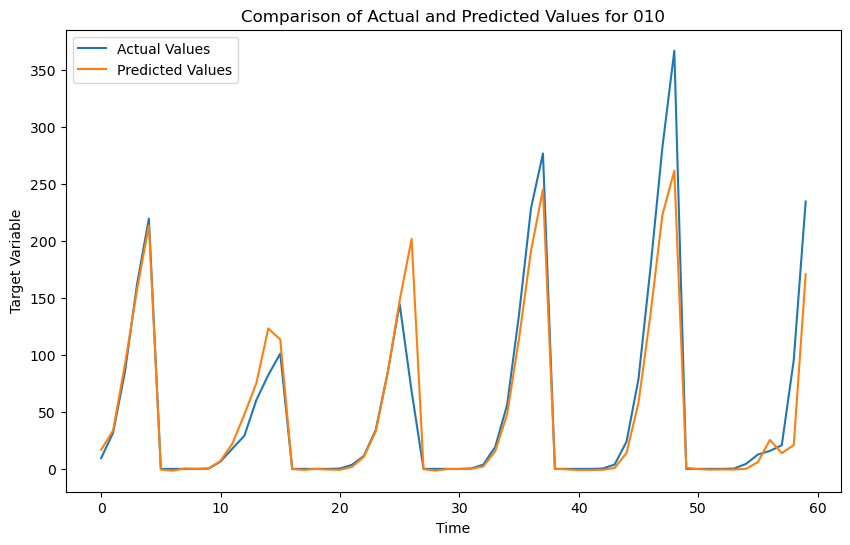

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

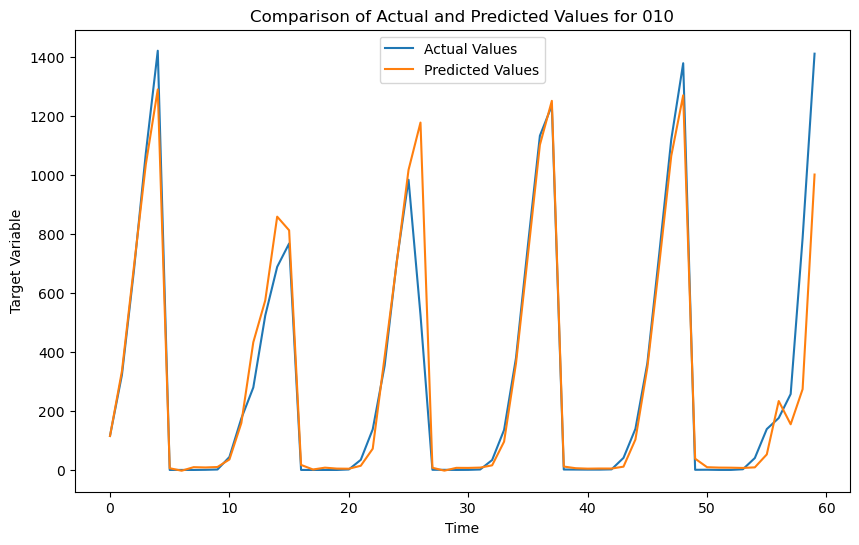

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

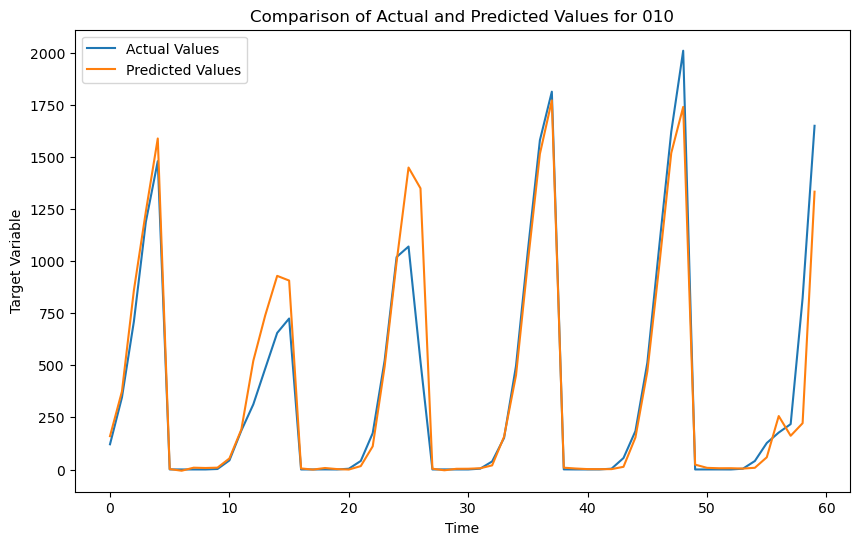

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

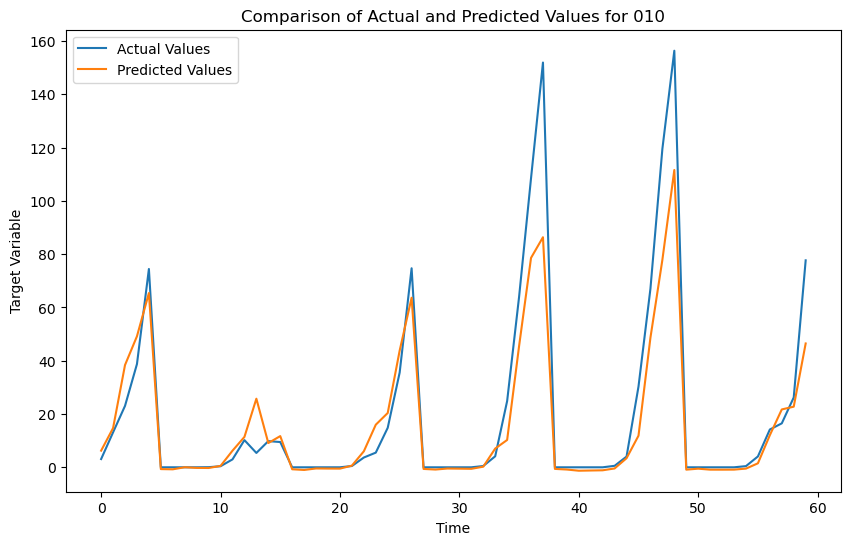

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

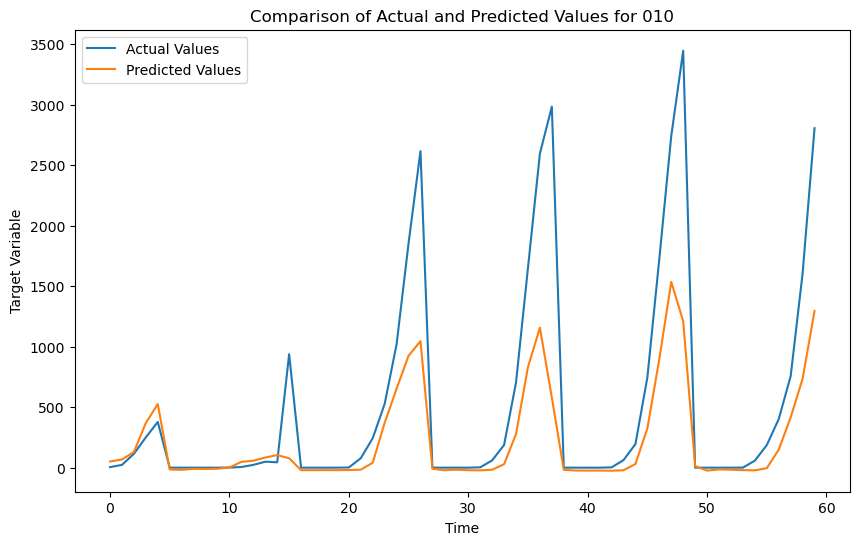

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

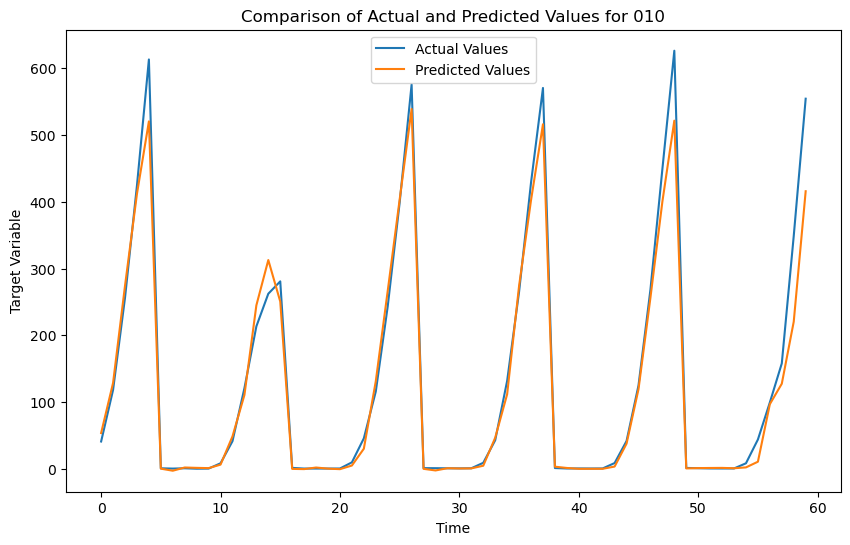

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

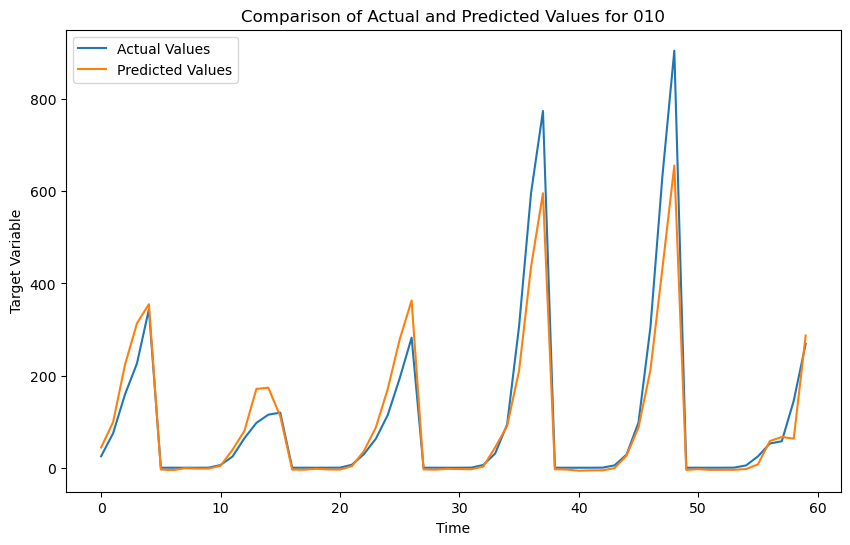

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

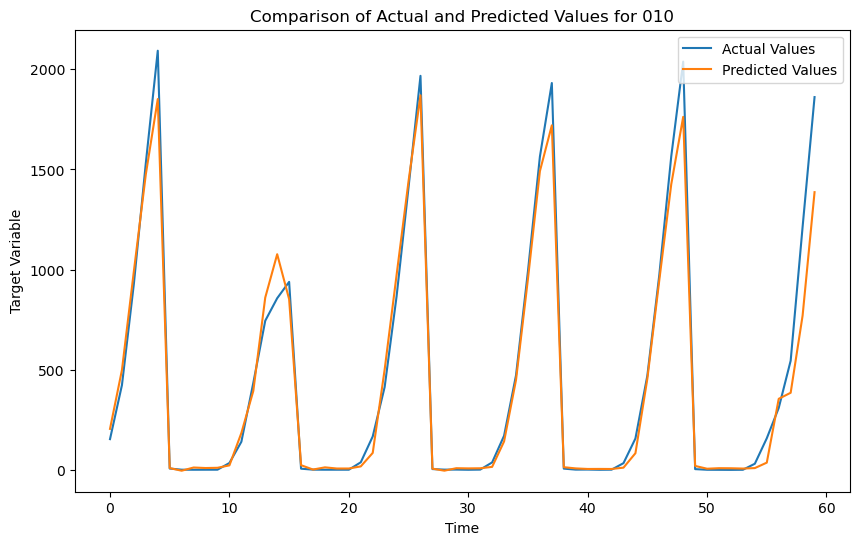

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

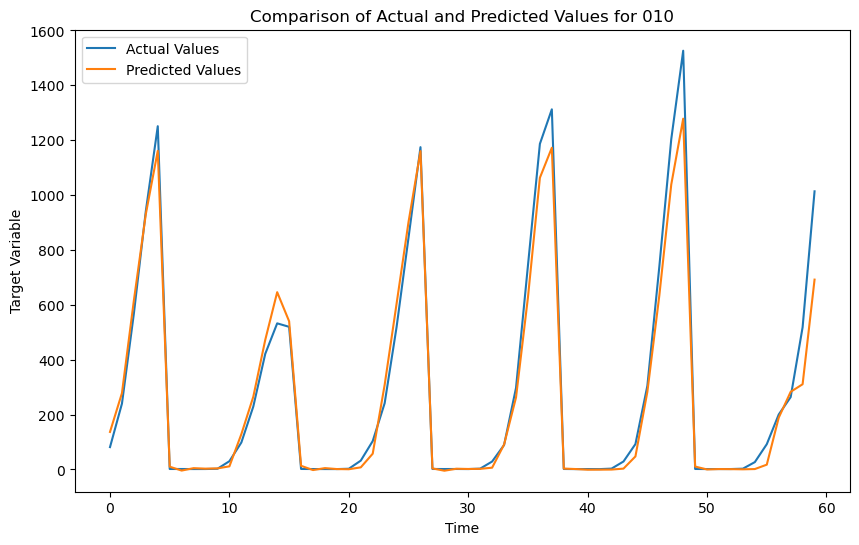

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

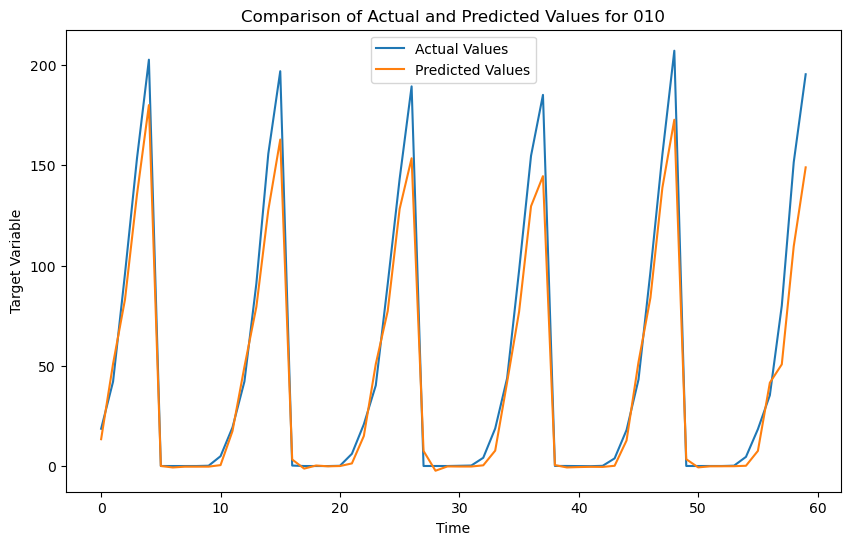

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

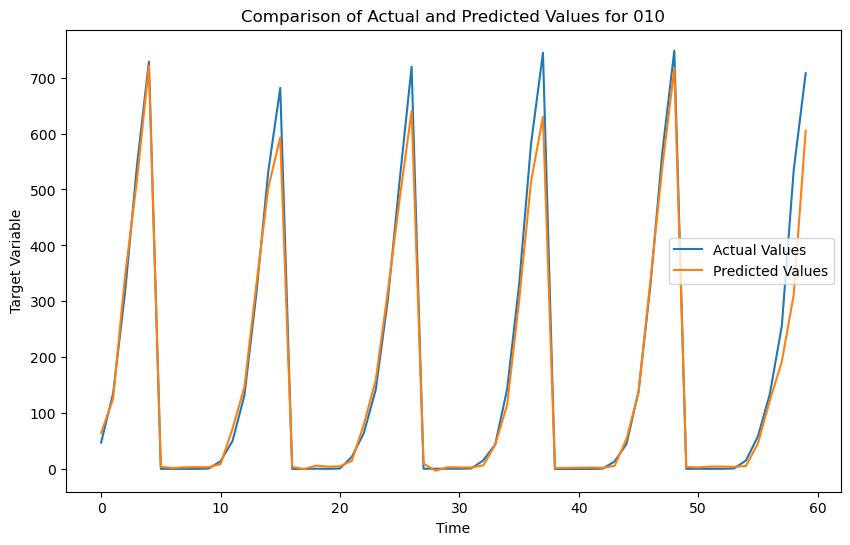

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

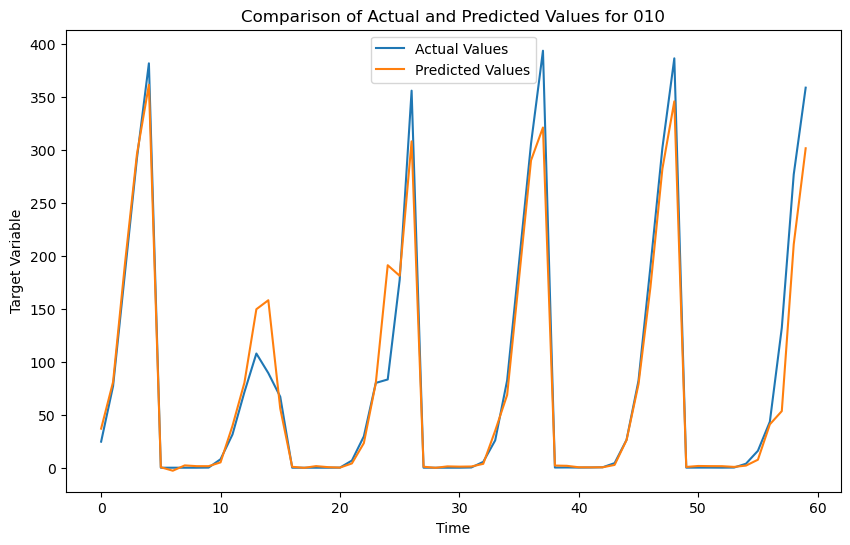

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

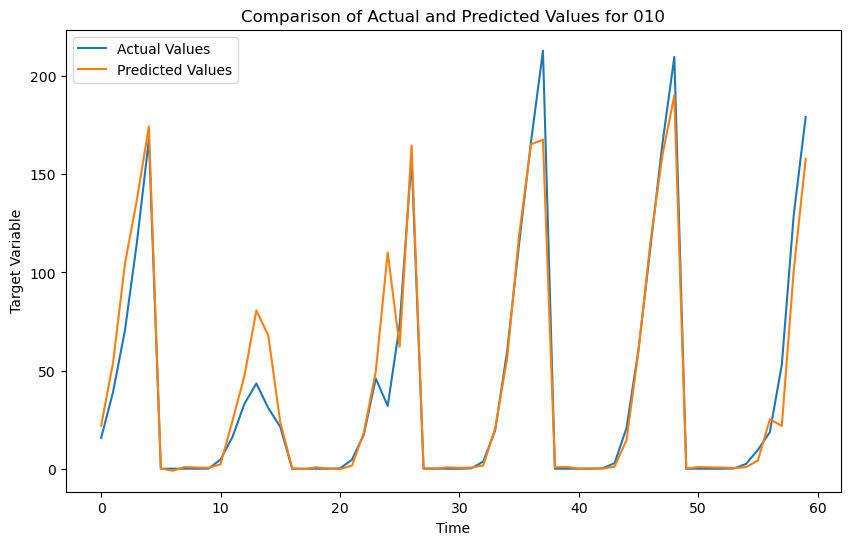

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

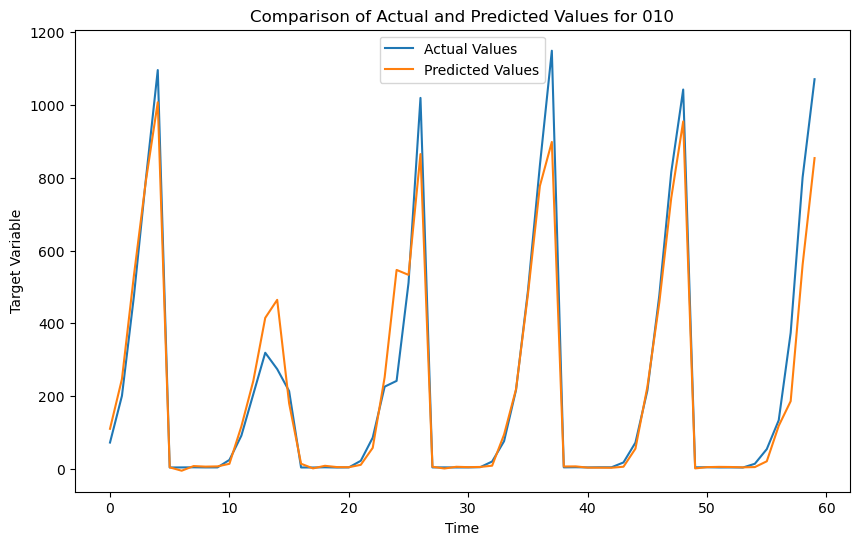

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

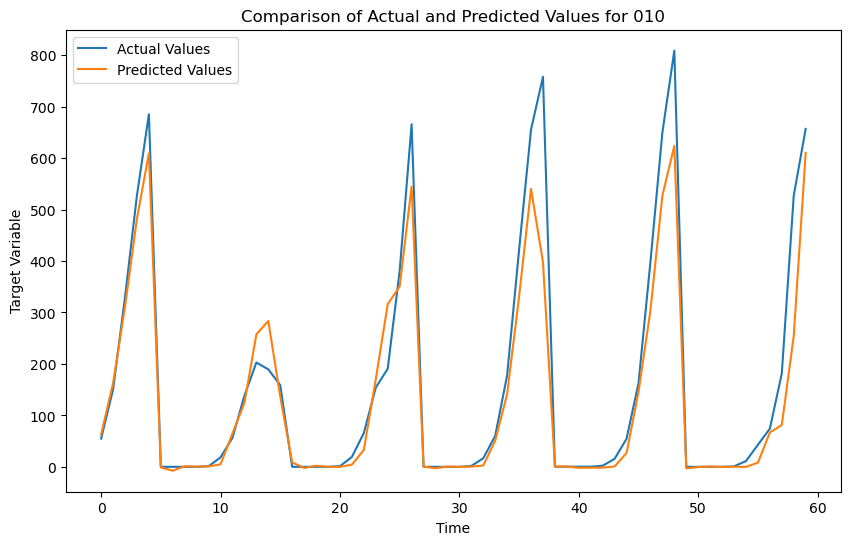

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

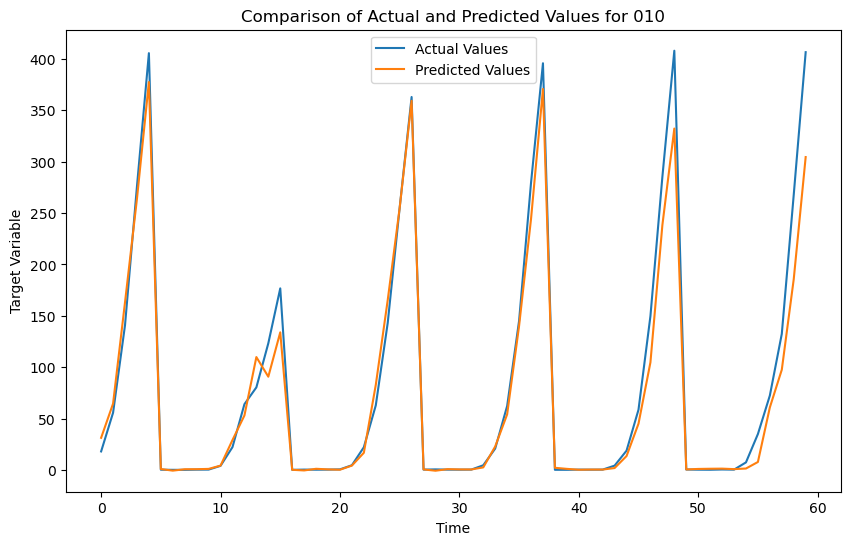

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

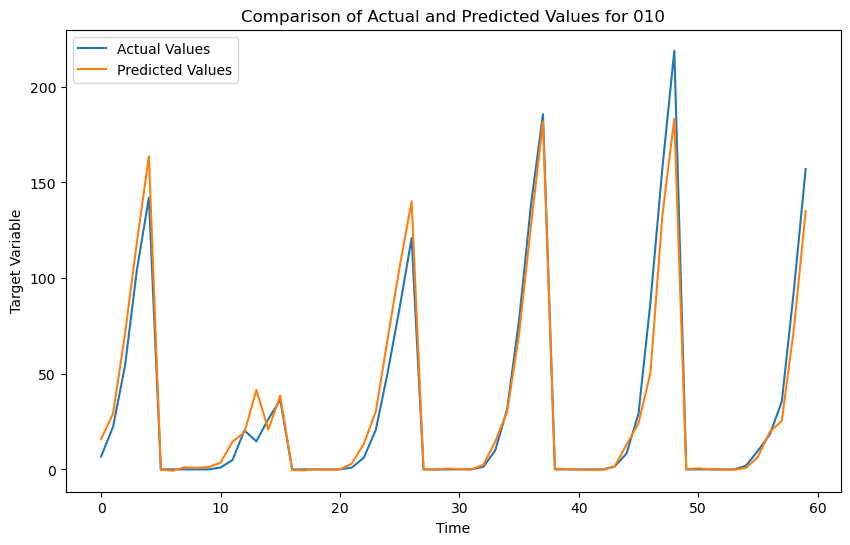

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

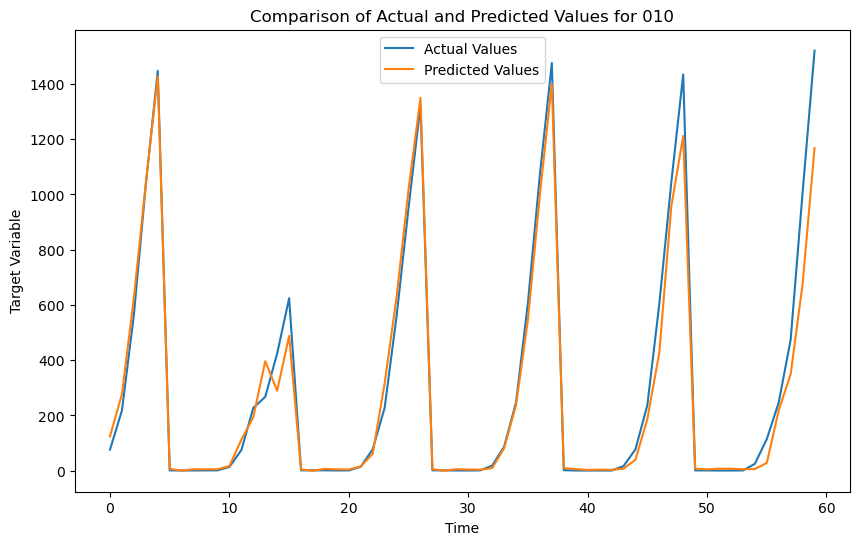

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

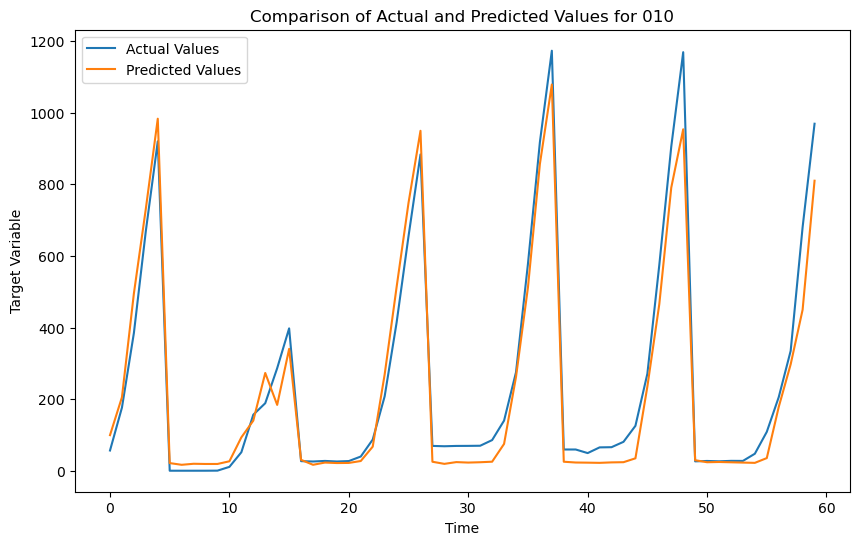

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

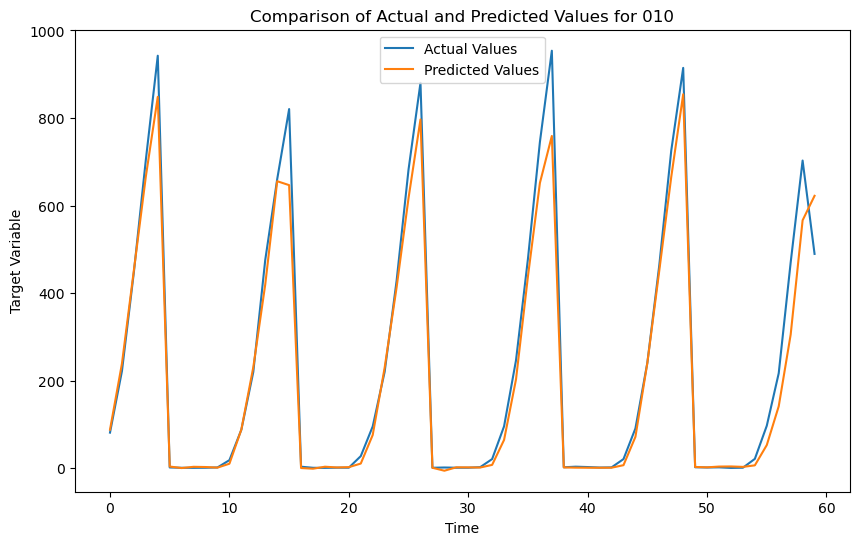

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

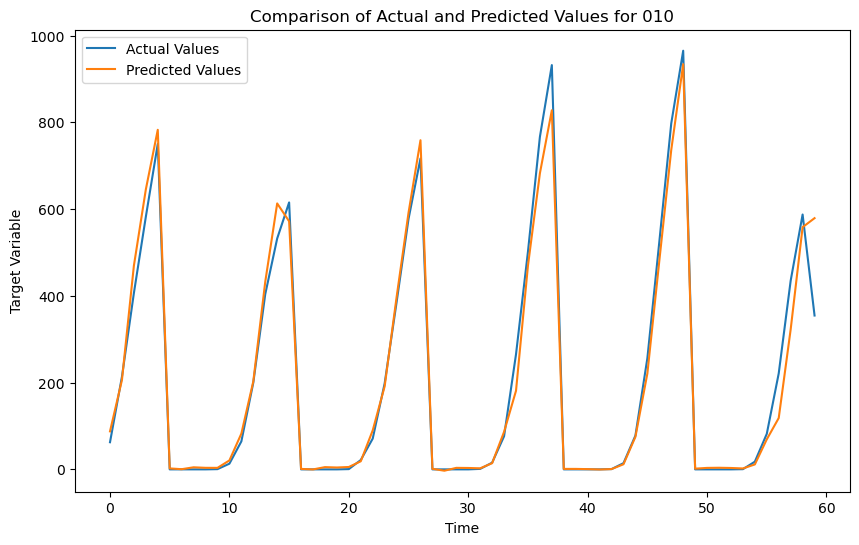

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

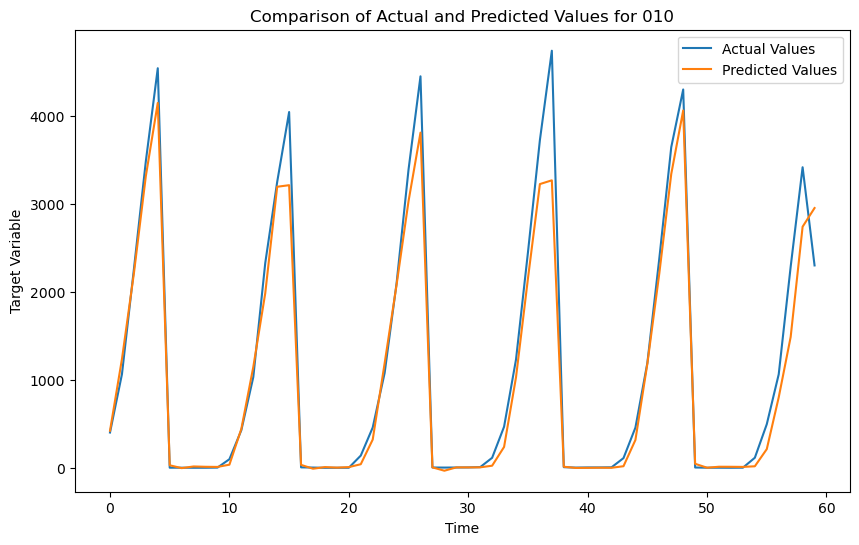

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

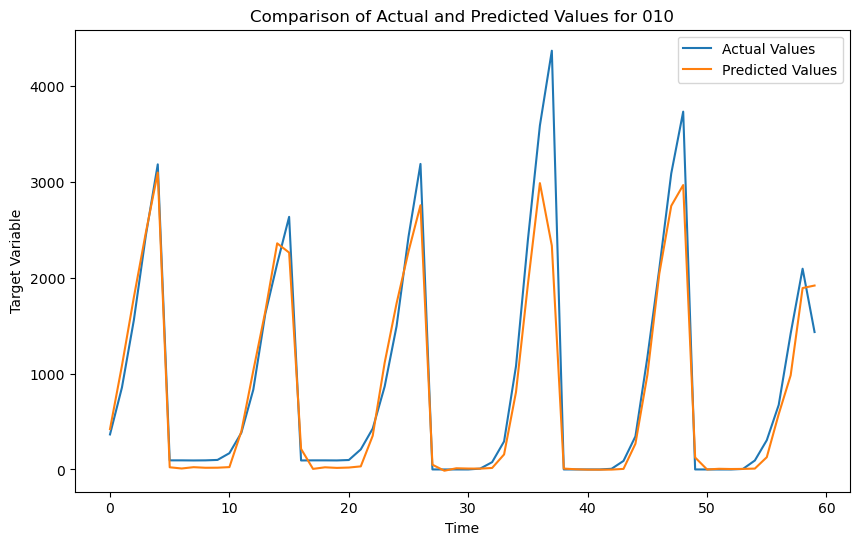

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

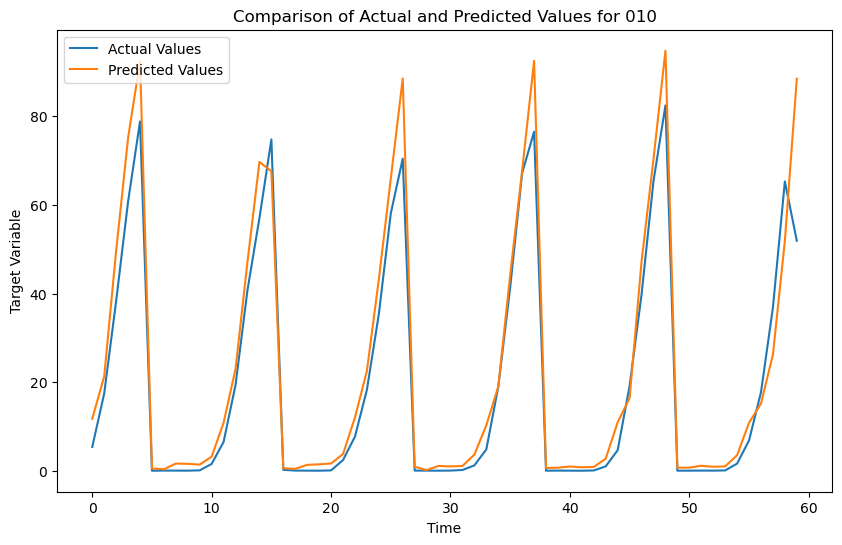

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

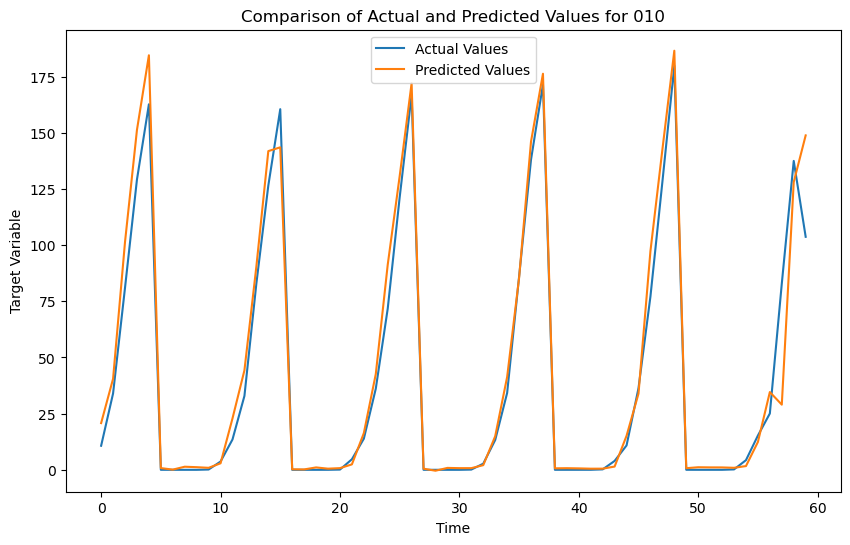

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

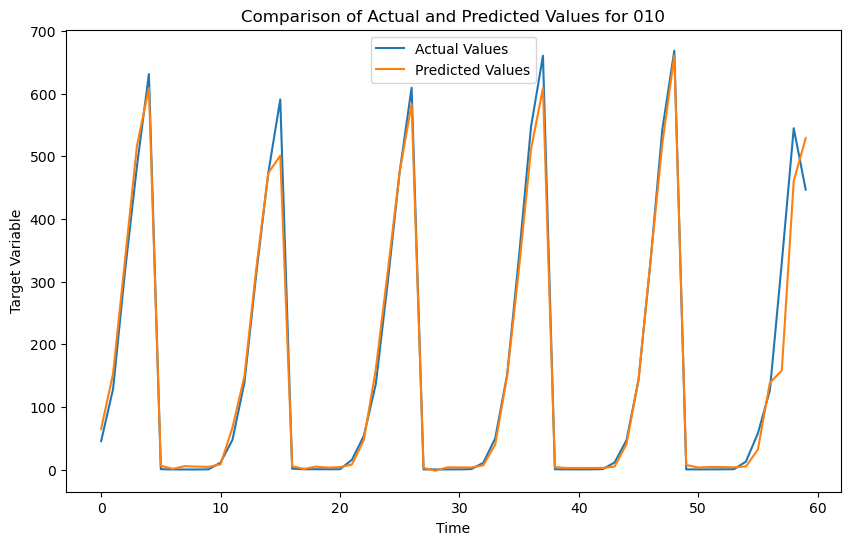

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

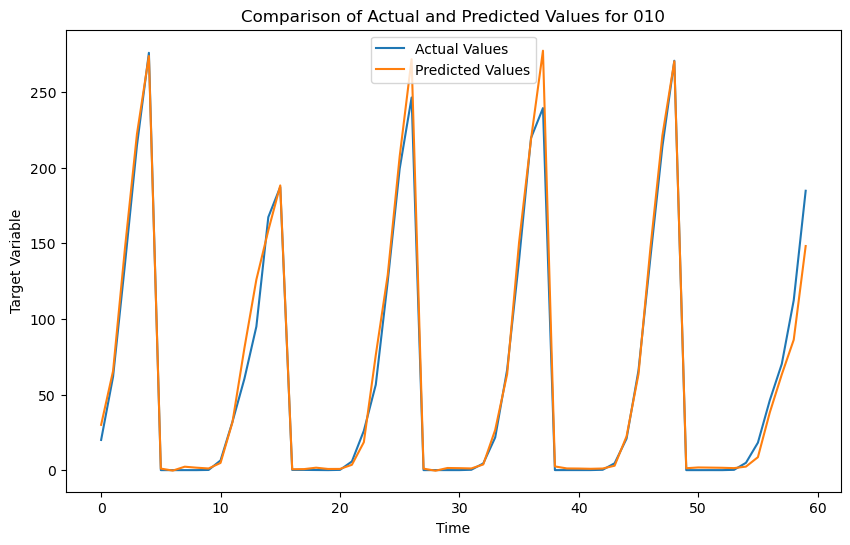

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

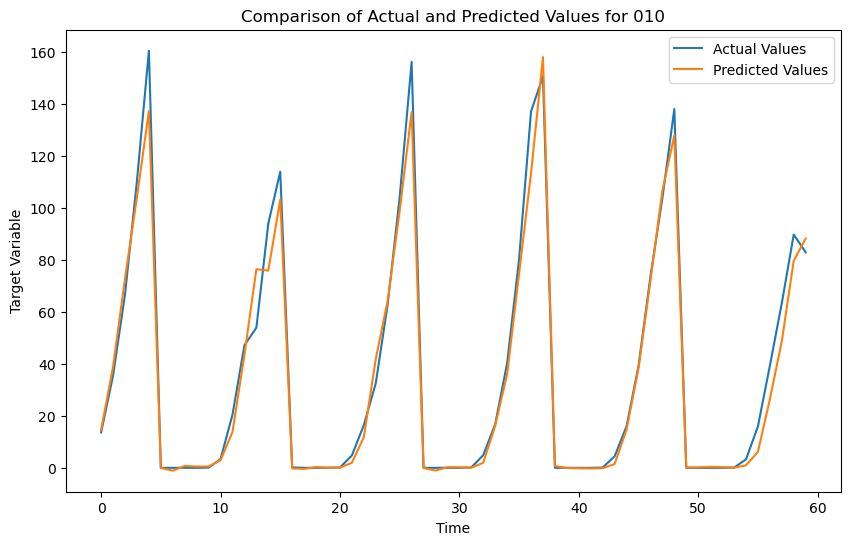

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

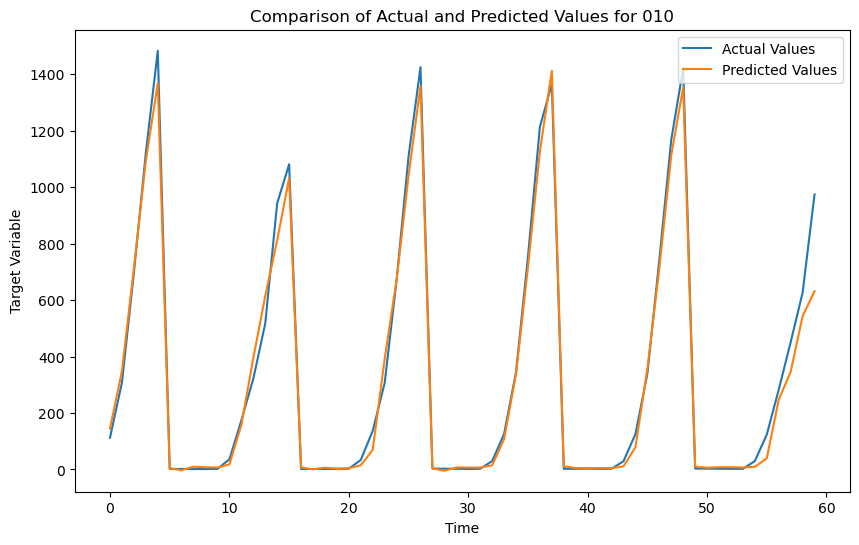

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

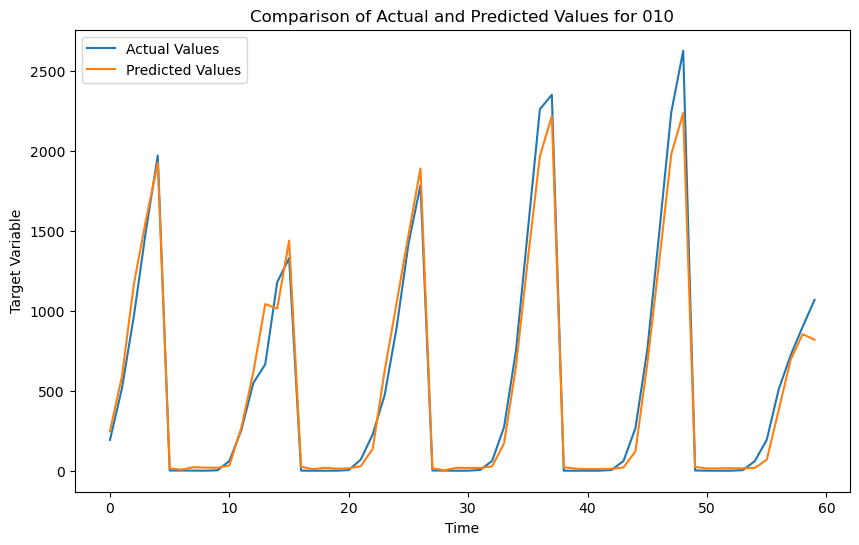

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

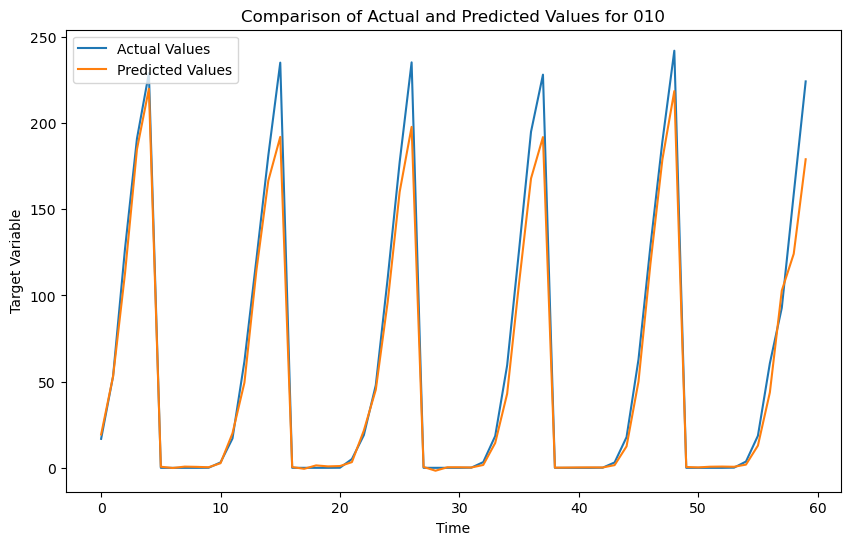

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

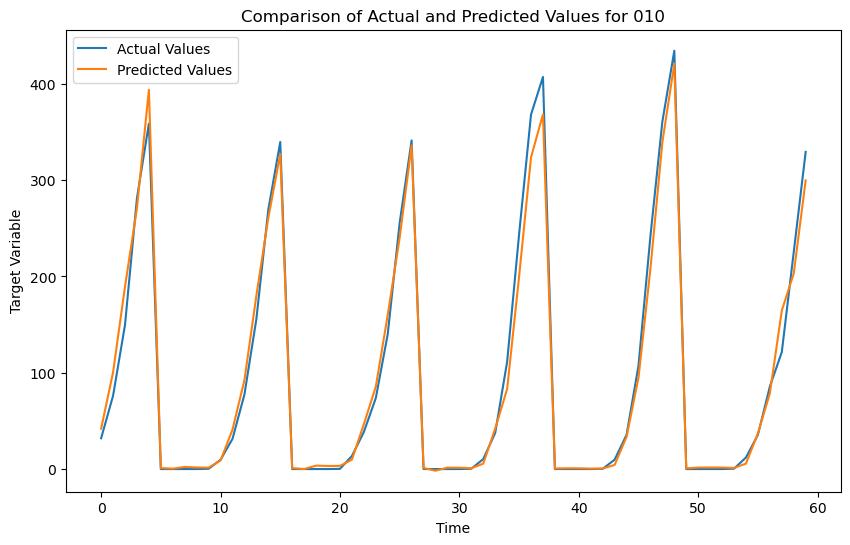

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

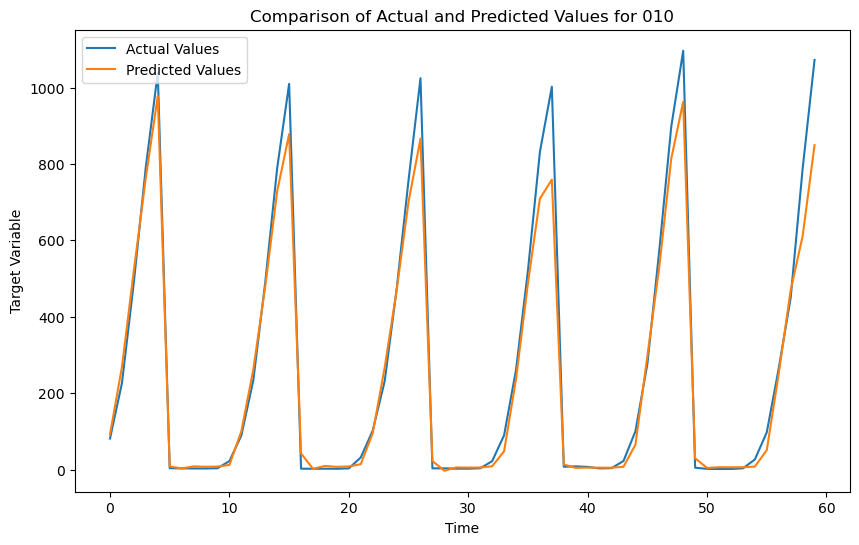

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

{'group': (0, 0, 1), 'r2': 0.8652525706827445, 'mse': 1881.4529398849056, 'rmse': 43.37571832125556, 'mae': 22.712620549786095}
{'group': (0, 1, 0), 'r2': 0.9127753061192505, 'mse': 49056.00918054069, 'rmse': 221.48591192340132, 'mae': 114.04241000563303}
{'group': (0, 1, 1), 'r2': 0.8594080472730764, 'mse': 17007.60446565653, 'rmse': 130.41320663819494, 'mae': 66.45315960680644}
{'group': (0, 2, 1), 'r2': 0.9207496925092172, 'mse': 10.49803630177178, 'rmse': 3.2400673298207523, 'mae': 2.0121045865148304}
{'group': (0, 3, 0), 'r2': 0.9145383899121057, 'mse': 565005.1762408069, 'rmse': 751.6682620949264, 'mae': 386.8693679783502}
{'group': (0, 3, 1), 'r2': 0.9159453328697245, 'mse': 432472.4158939883, 'rmse': 657.6263497564466, 'mae': 348.6753120655457}
{'group': (1, 1, 0), 'r2': 0.9620248797174674, 'mse': 32.023325018725444, 'rmse': 5.658915533803755, 'mae': 2.8079503515799846}
{'group': (1, 3, 0), 'r2': 0.9761063232962125, 'mse': 248.55135556174716, 'rmse': 15.76551158579217, 'mae': 9

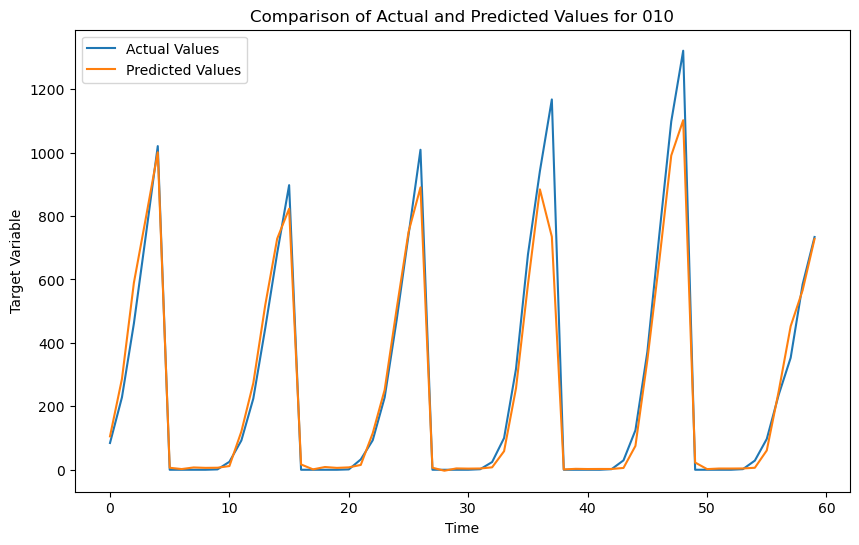

In [14]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from keras.models import load_model
import matplotlib.pyplot as plt

cols = ['eic_count', 'installed_capacity', 'temperature', 'dewpoint',
        'rain', 'snowfall', 'surface_pressure', 'cloudcover_total', 'windspeed_10m',
        'winddirection_10m', 'shortwave_radiation', 'direct_solar_radiation',
        'diffuse_radiation', 'lowest_price_per_mwh', 'highest_price_per_mwh',
        'elect_prices', 'target']


n_future = 1  # Number of days we want to look into the future based on the past days.
n_past = 24
# Filtering for Cluster 2
cluster_data = clustering[clustering['Cluster'] == 2]



# Initialize your scaler and model
scaler = StandardScaler()  # Assuming this should be fitted with training data elsewhere


# Process for each group in Cluster 2
results = []
for group, group_data in cluster_data.groupby(['county', 'product_type', 'is_business']):
    df = group_data[cols].astype(float)
    df_scaled= scaler.fit(df)
    df_scaled = scaler.transform(df)

    testX = []
    testY = []
    for i in range(n_past, len(df_scaled) - n_future + 1):
        testX.append(df_scaled[i - n_past:i])
        testY.append(df_scaled[i + n_future - 1:i + n_future, -1])  # Assuming the last column is still the target

    testX, testY = np.array(testX), np.array(testY)



    n_days_for_prediction = 60



    target_scaler = StandardScaler()
    target_scaler.fit(df[['target']])


# Predict on the last n_days_for_prediction
    prediction_scaled = model.predict(testX[-n_days_for_prediction:])
    prediction = target_scaler.inverse_transform(prediction_scaled)
    actual = target_scaler.inverse_transform(testY[-n_days_for_prediction:])

# Calculate the metrics
    r2 = r2_score(actual, prediction)
    mse = mean_squared_error(actual, prediction)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(actual, prediction)
    results.append({
        'group': group,
        'r2': r2,
        'mse': mse,
        'rmse': rmse,
        'mae': mae
    })
    
    for result in results:
        print(result)


# Plotting
    plt.figure(figsize=(10,6))
    plt.plot(actual, label='Actual Values')
    plt.plot(prediction, label='Predicted Values')
    plt.title(f'Comparison of Actual and Predicted Values for 010')
    plt.xlabel('Time')
    plt.ylabel('Target Variable')
    plt.legend()
    plt.show()


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}


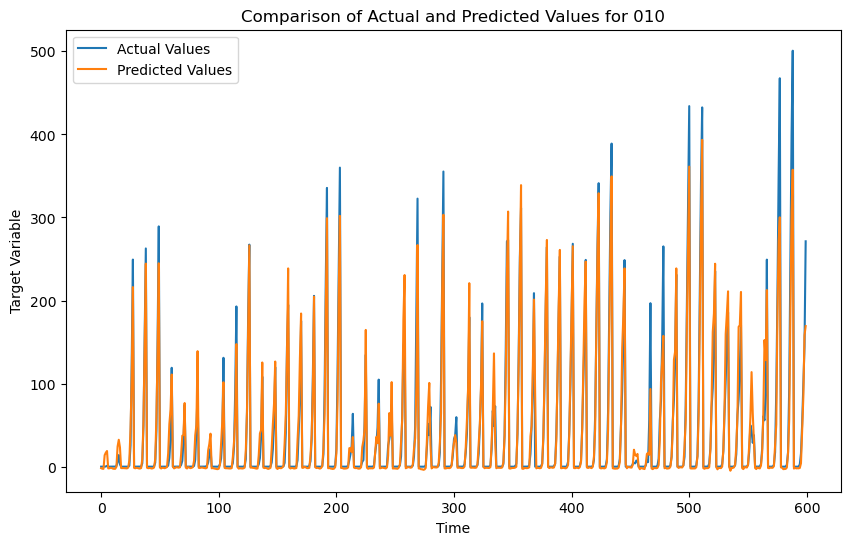

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}


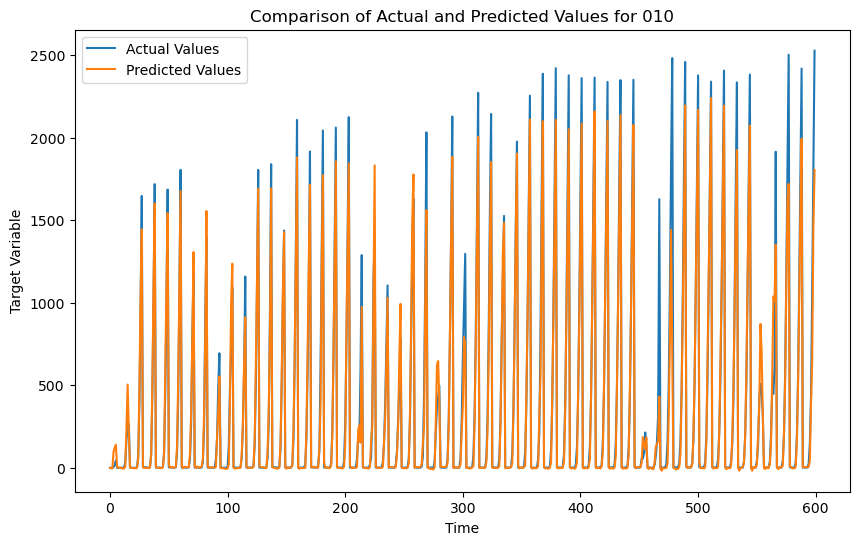

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}


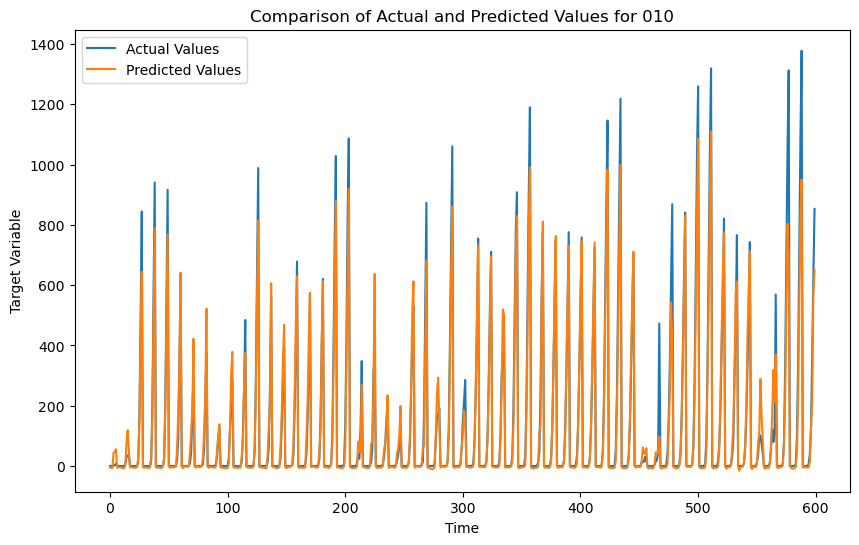

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}


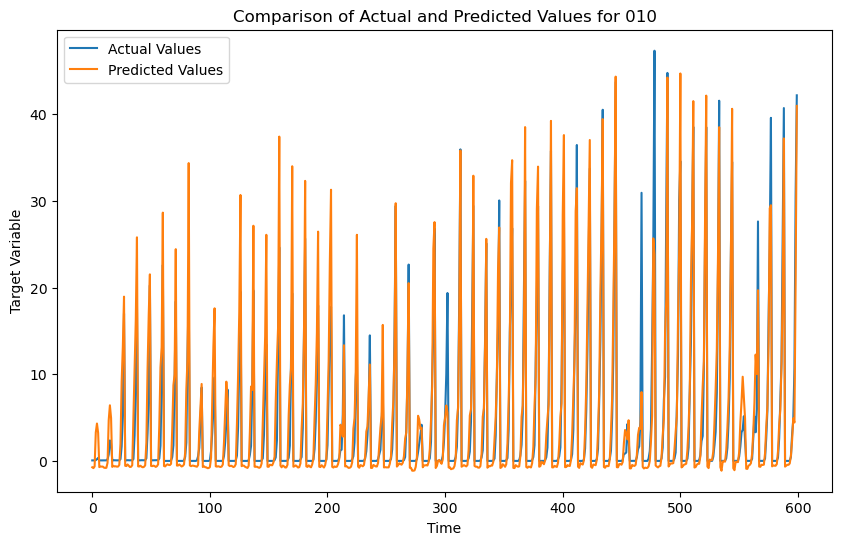

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}


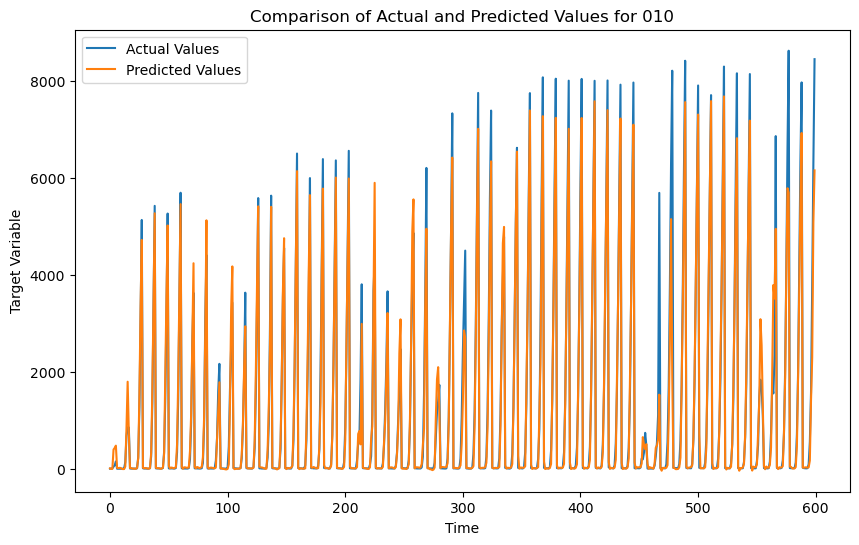

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}


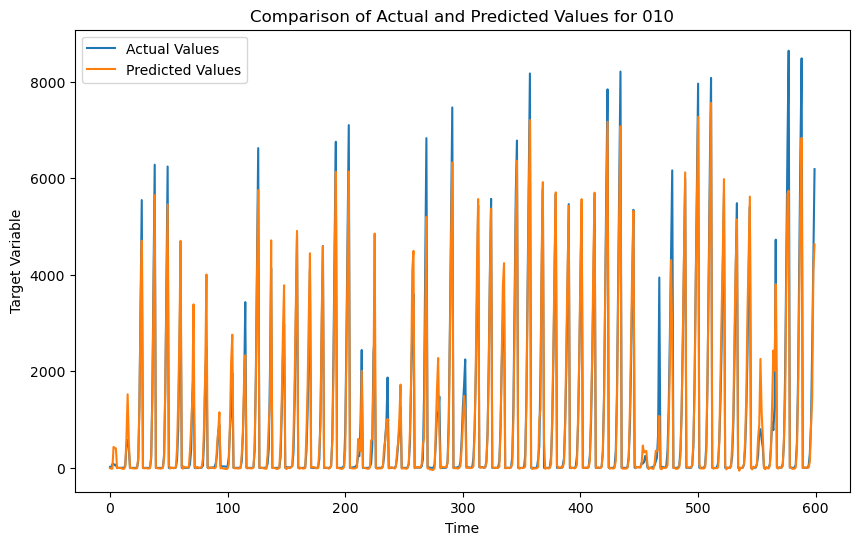

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}


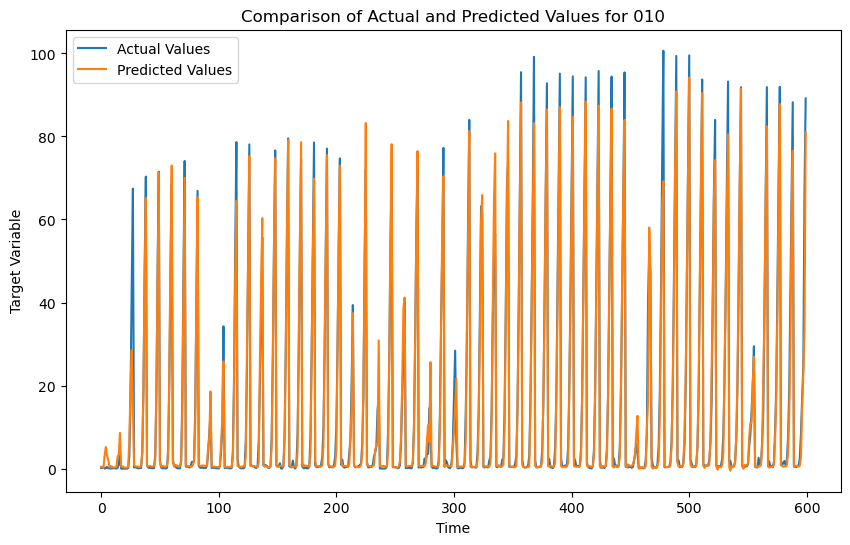

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

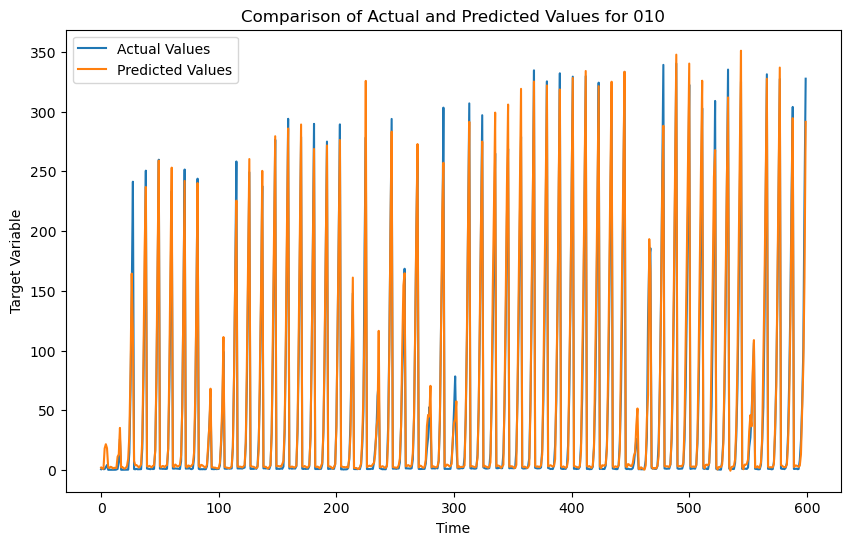

 1/19 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

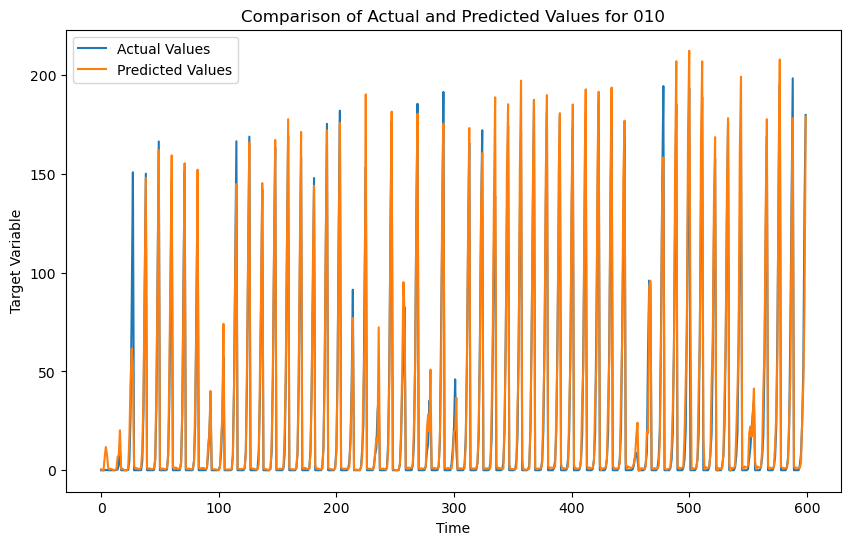

 1/19 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

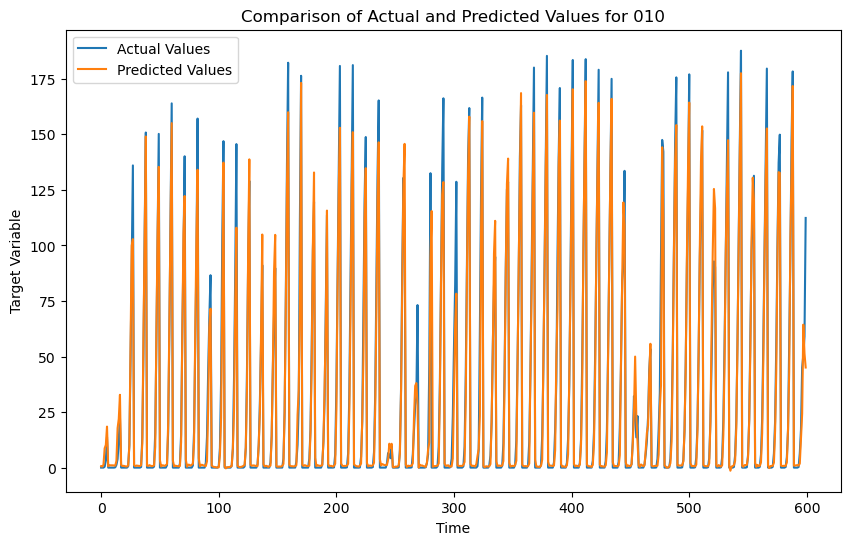

 1/19 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

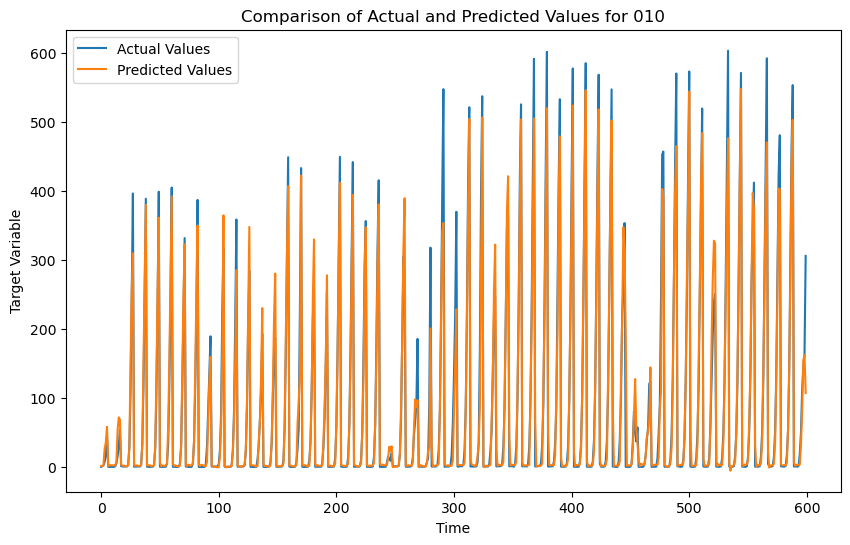

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

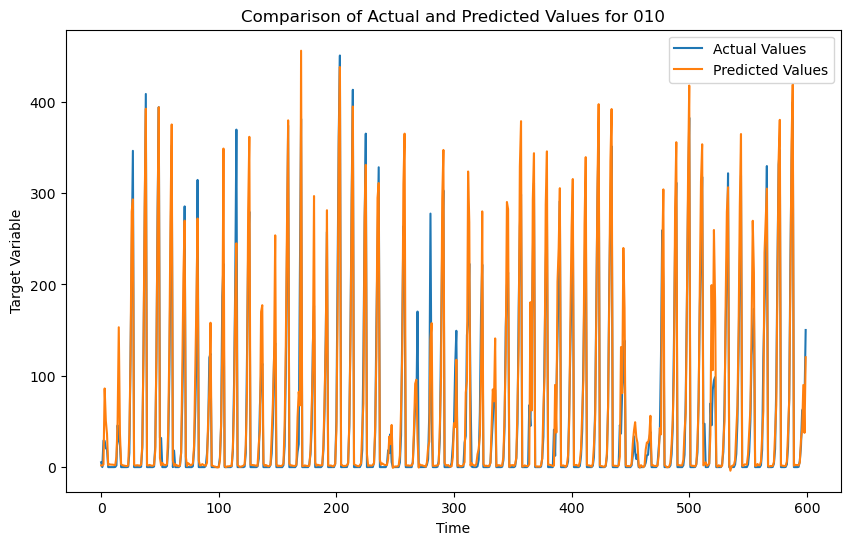

 1/19 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

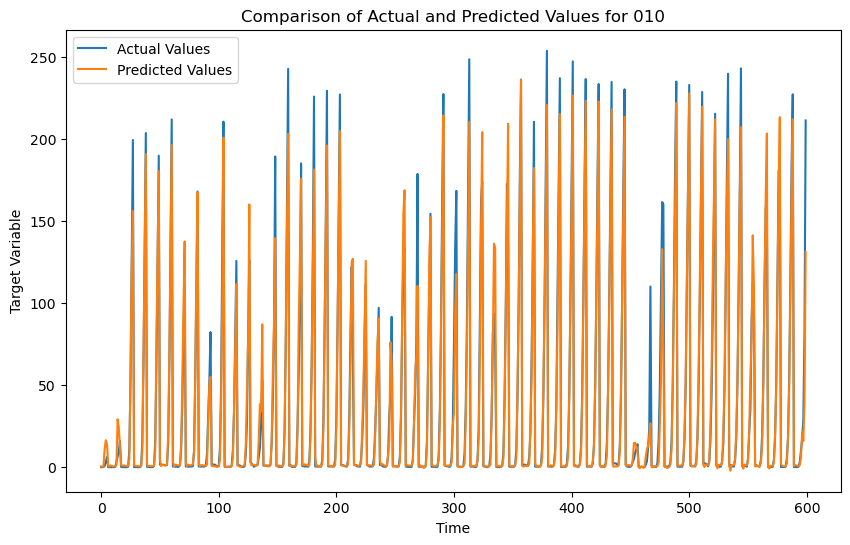

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

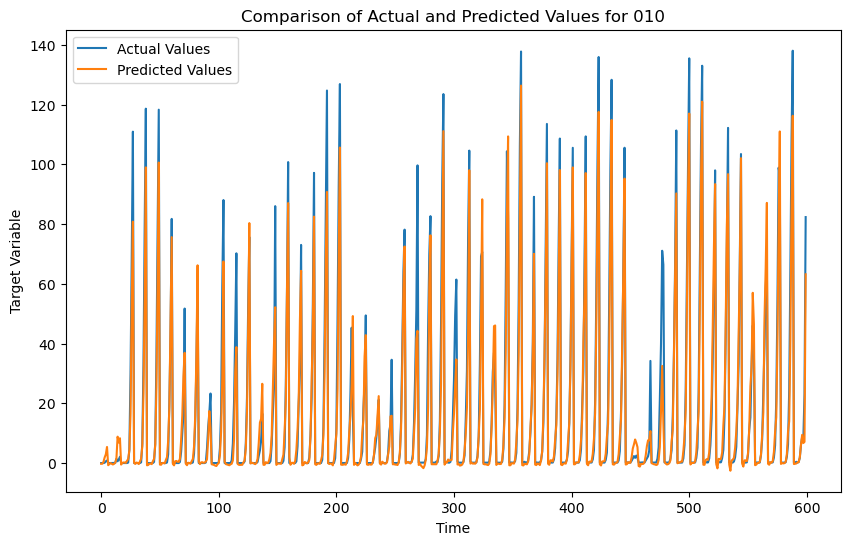

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

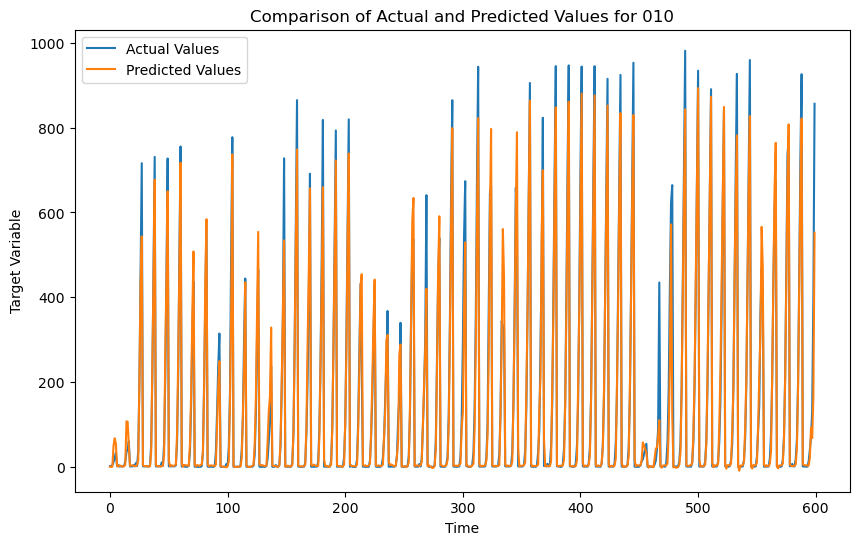

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

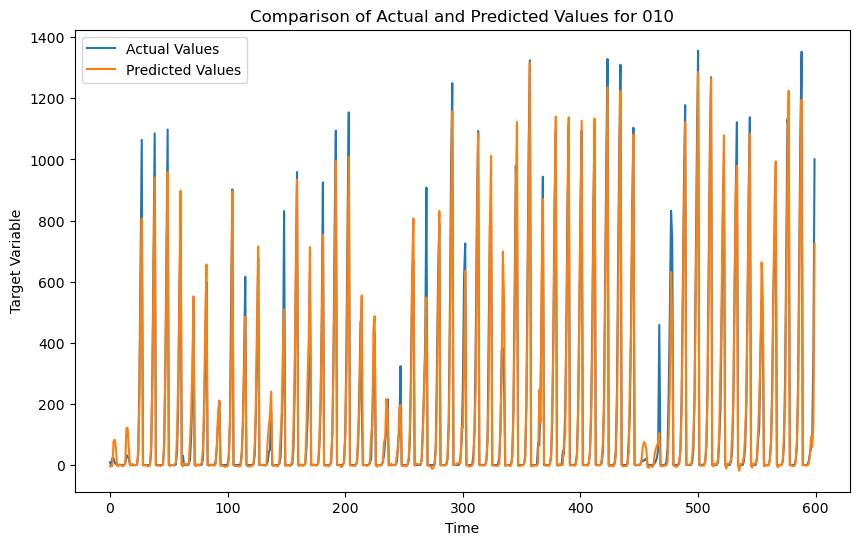

 1/19 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

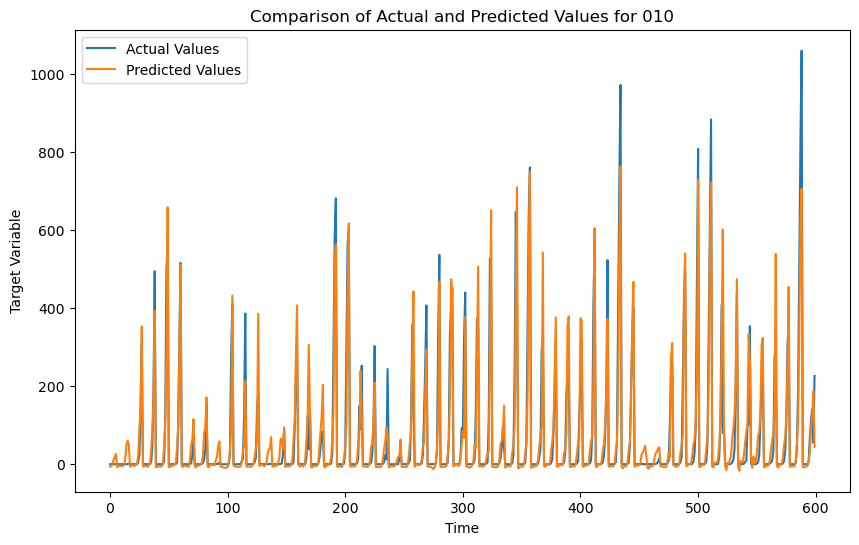

 1/19 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

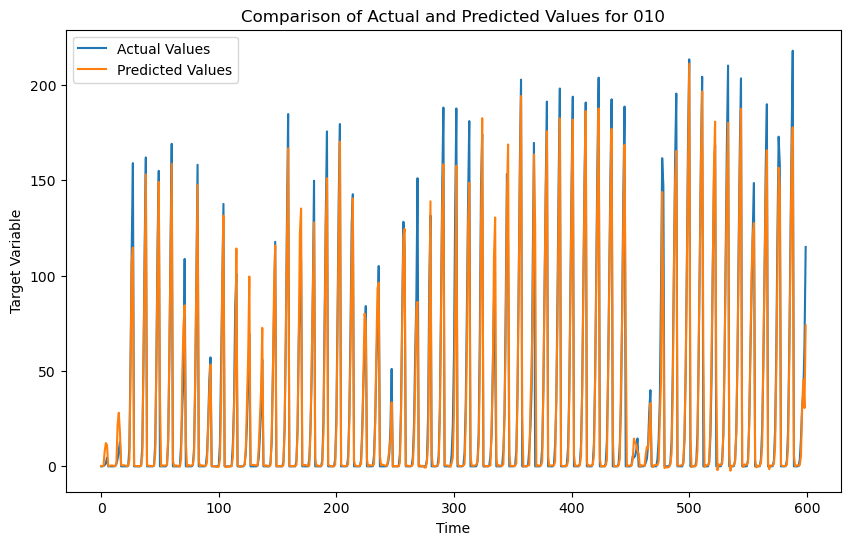

 1/19 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

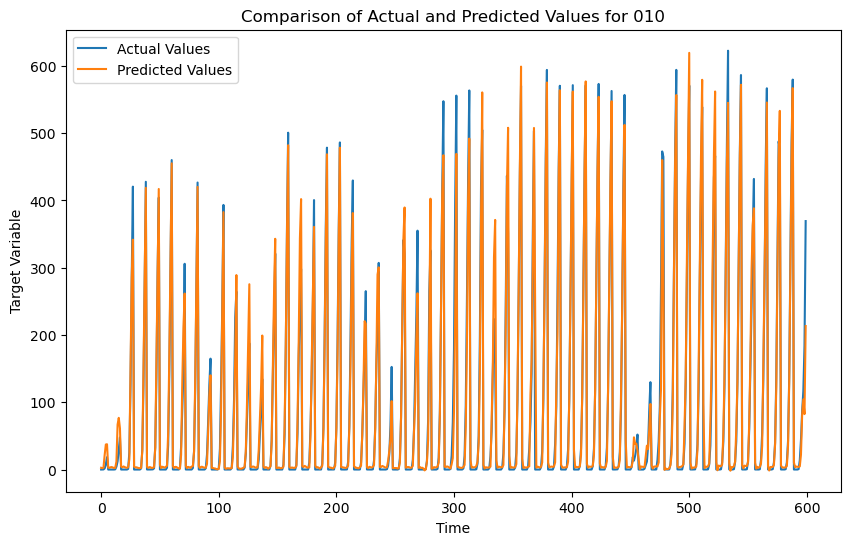

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

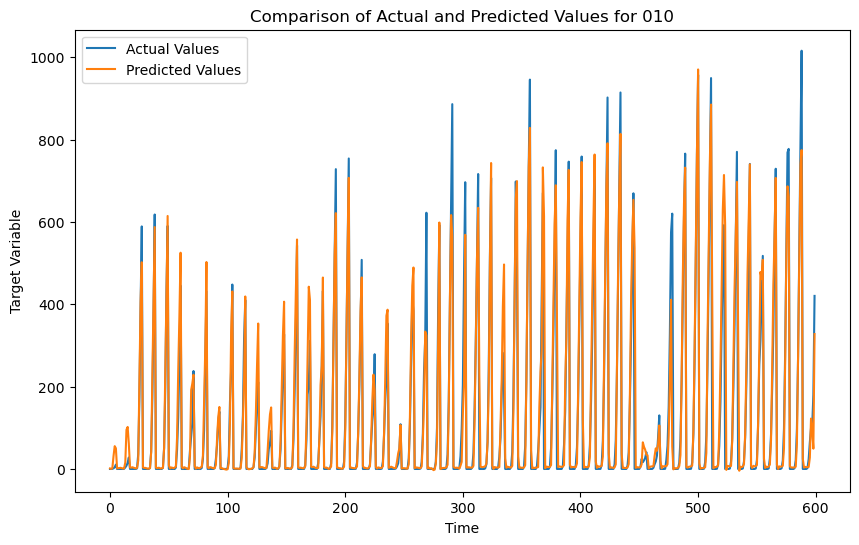

 1/19 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

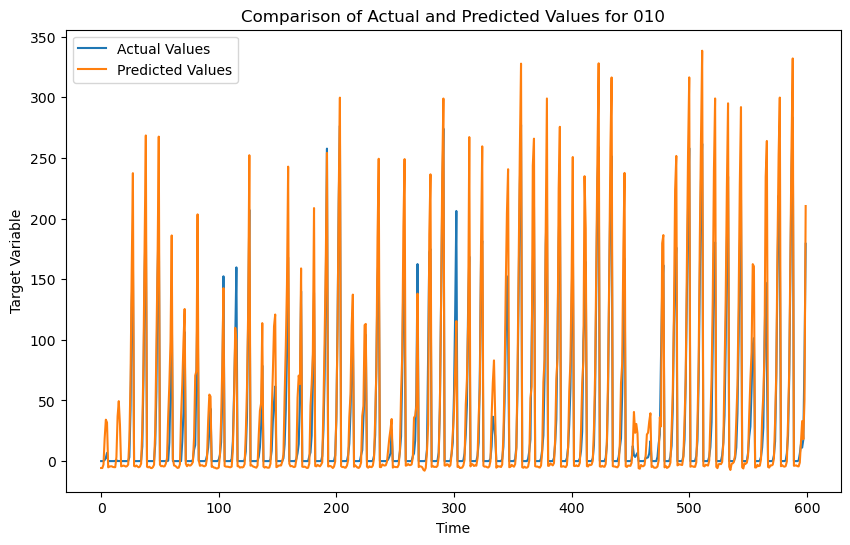

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

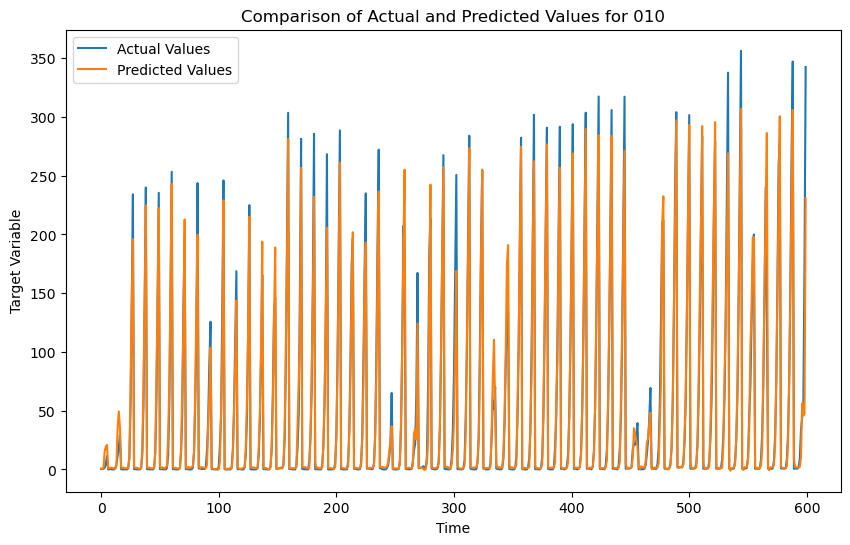

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

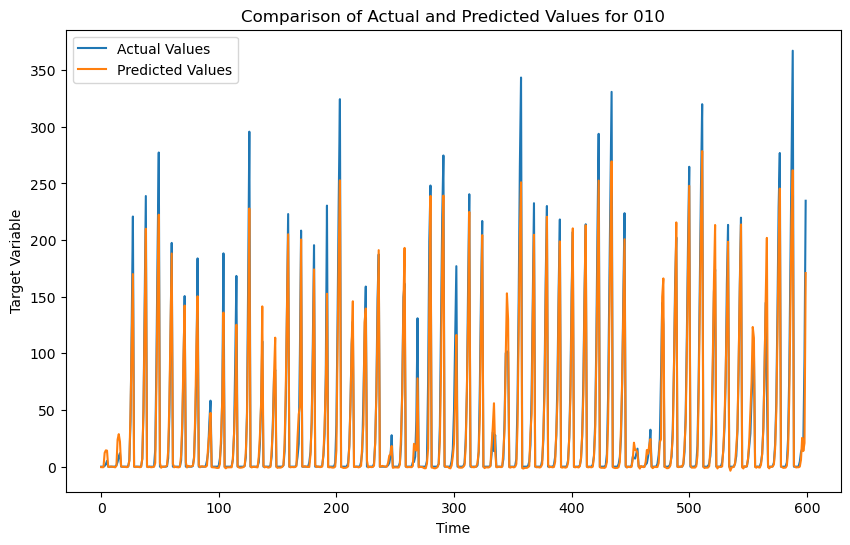

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

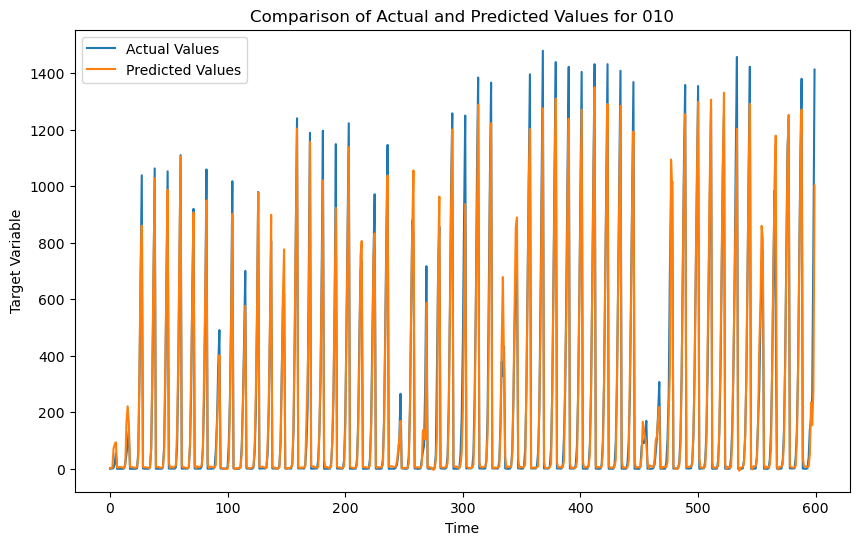

 1/19 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

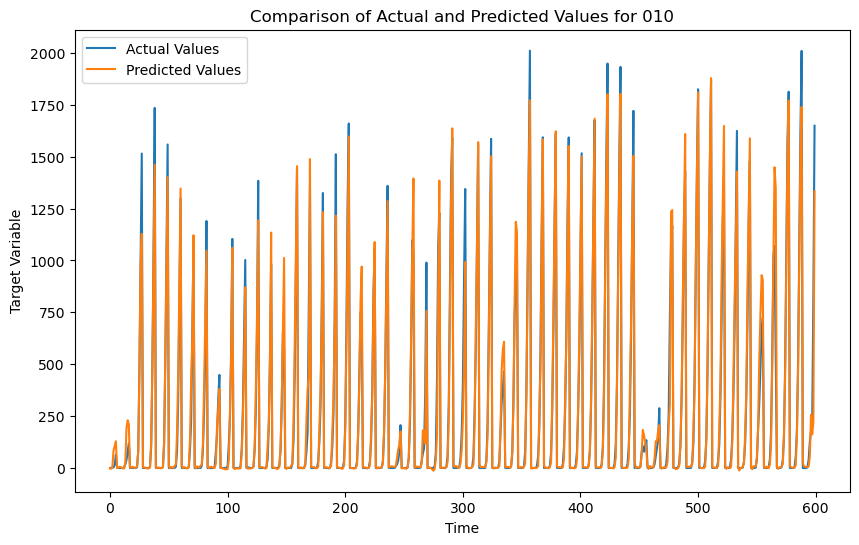

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

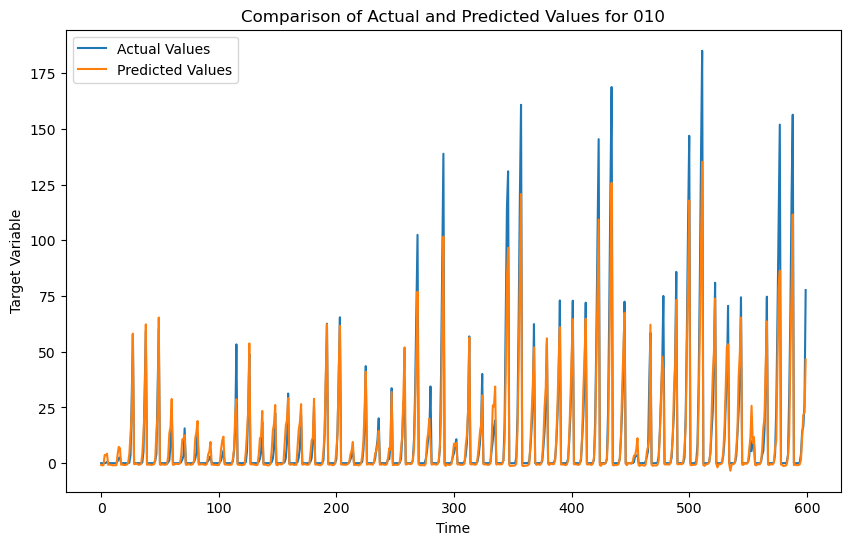

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

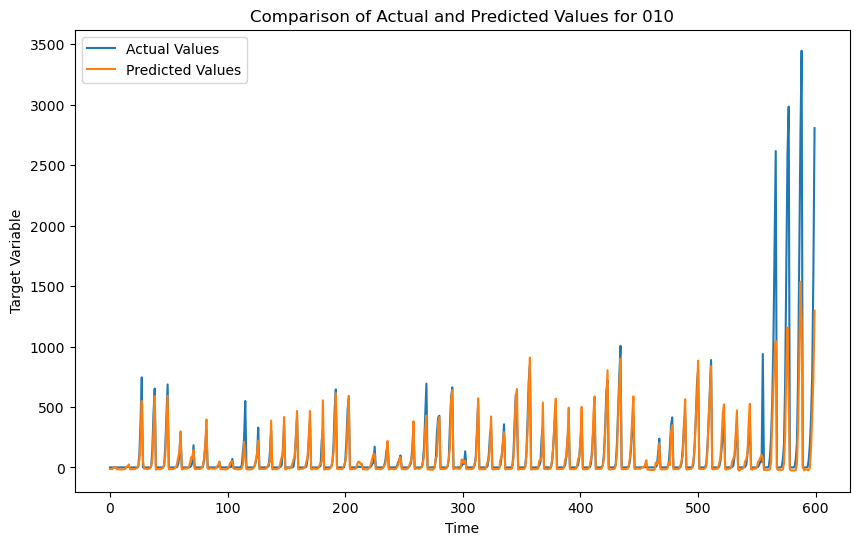

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

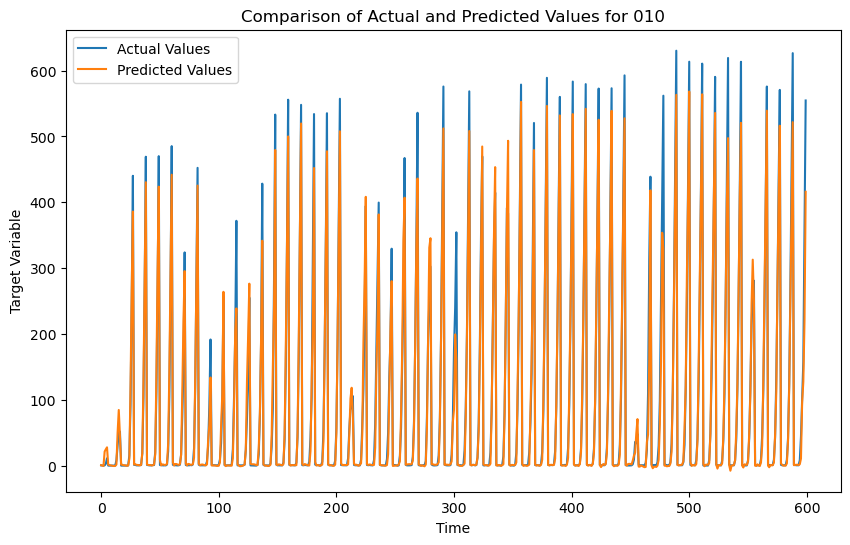

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

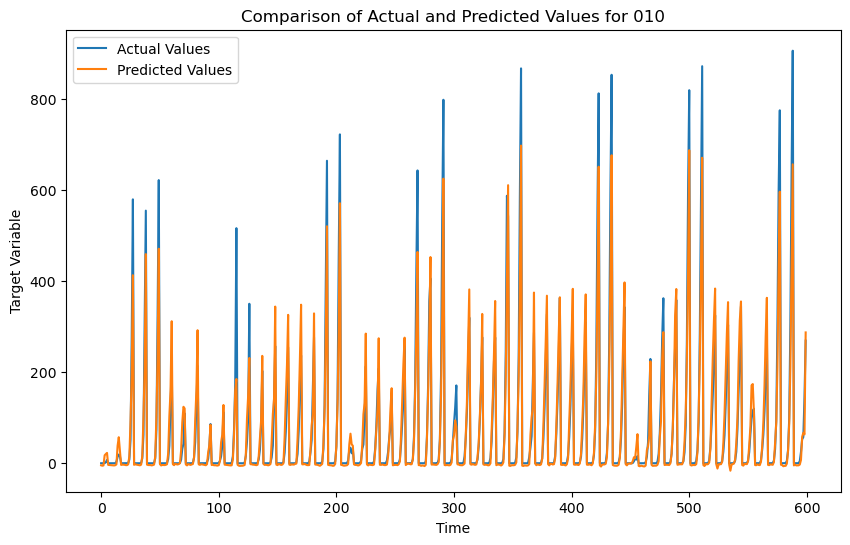

 1/19 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

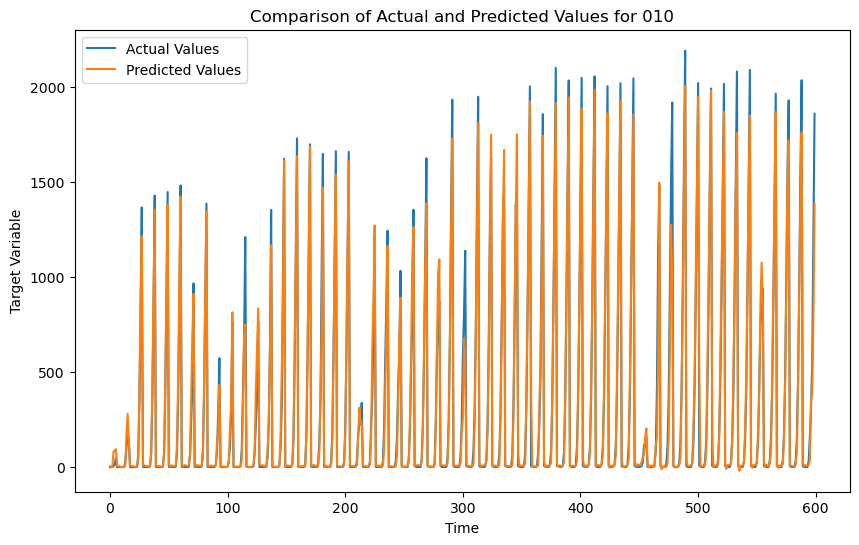

 1/19 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

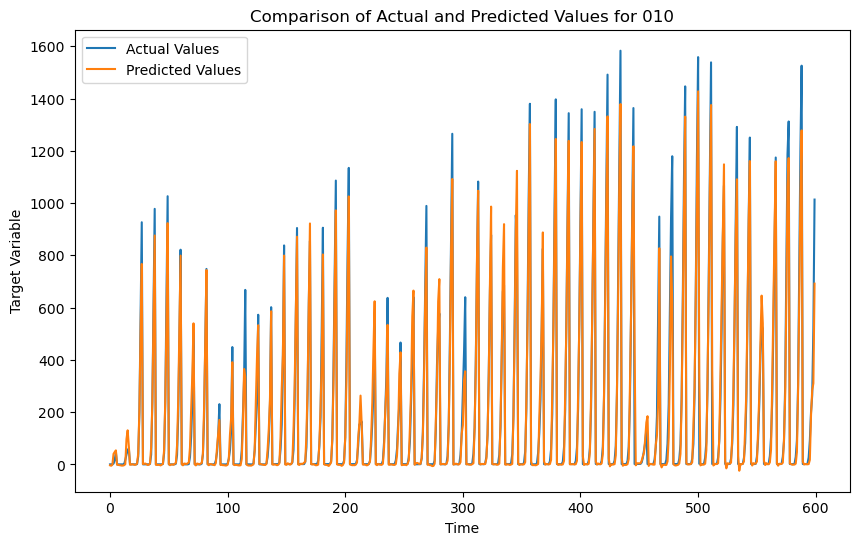

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

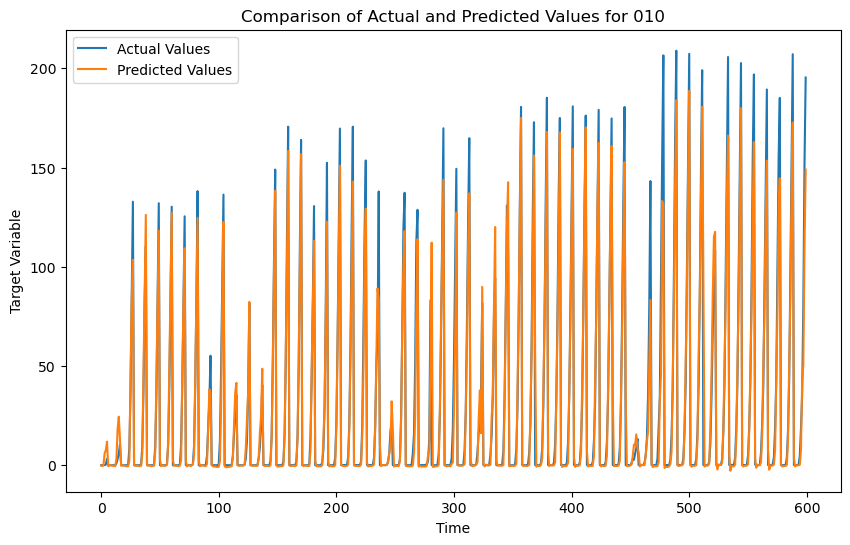

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

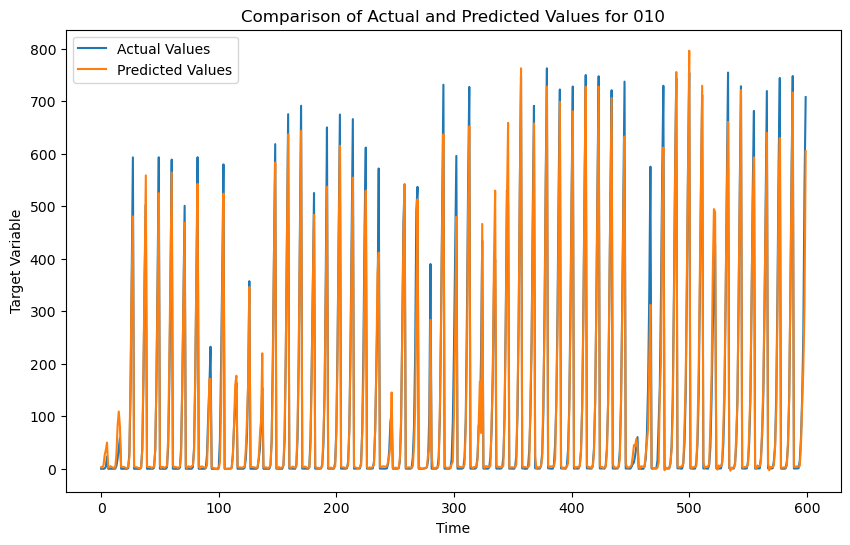

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

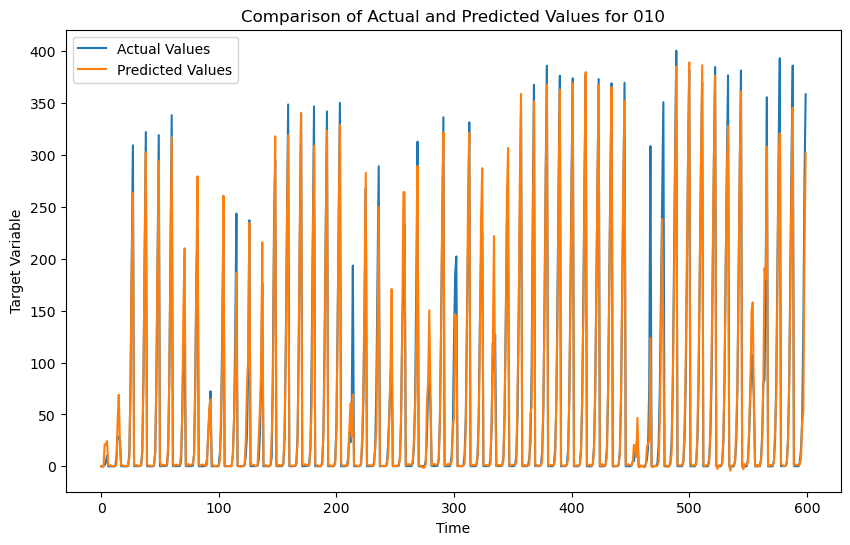

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

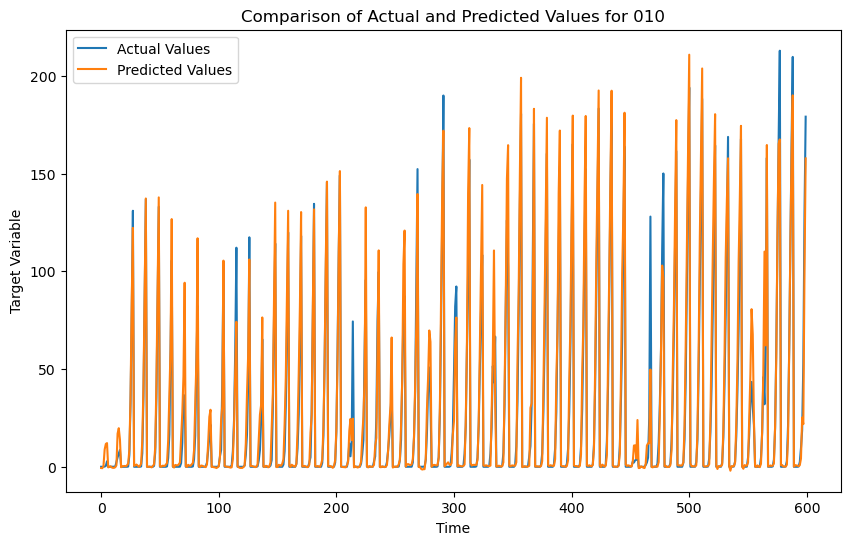

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

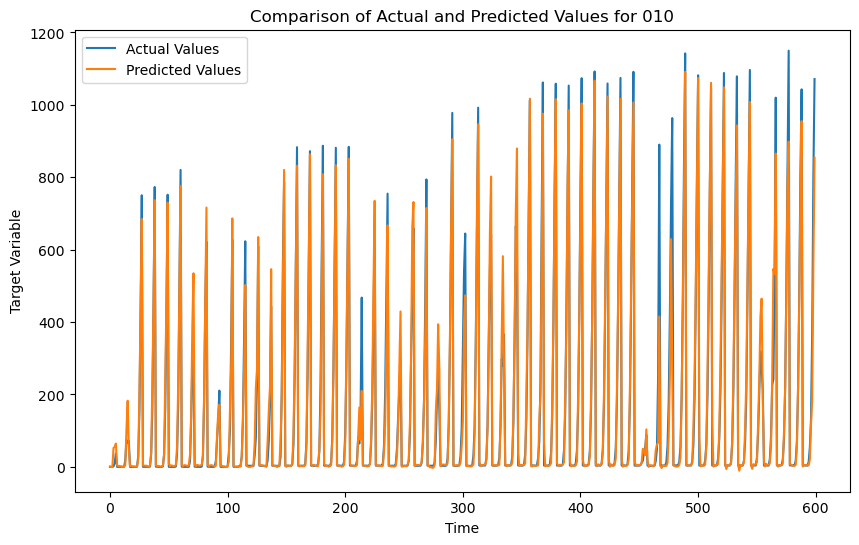

 1/19 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

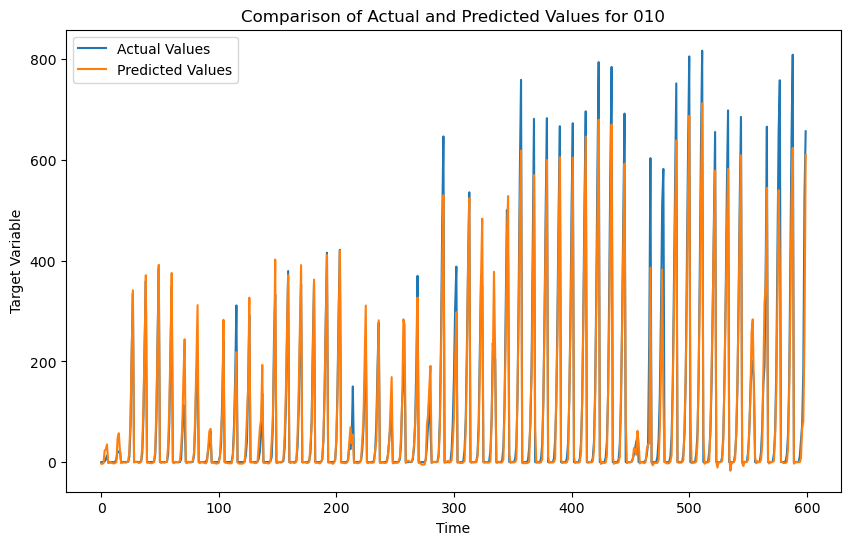

 1/19 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

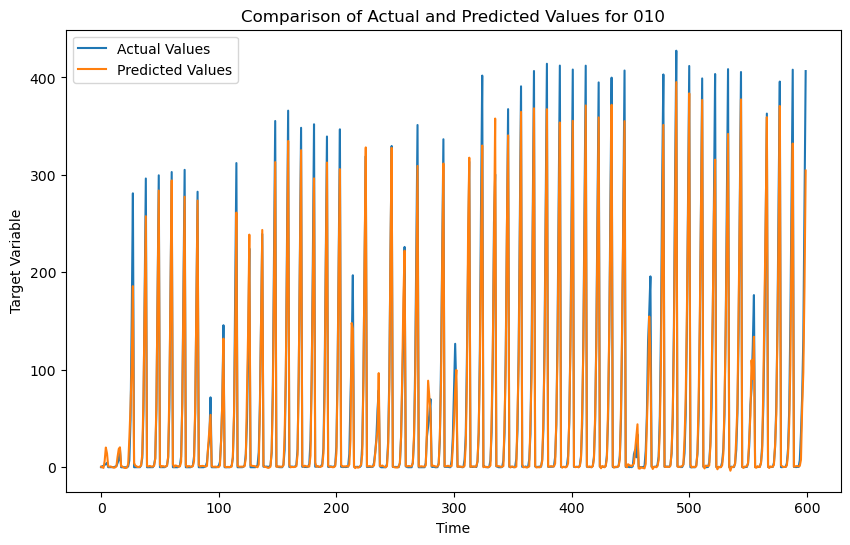

 1/19 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

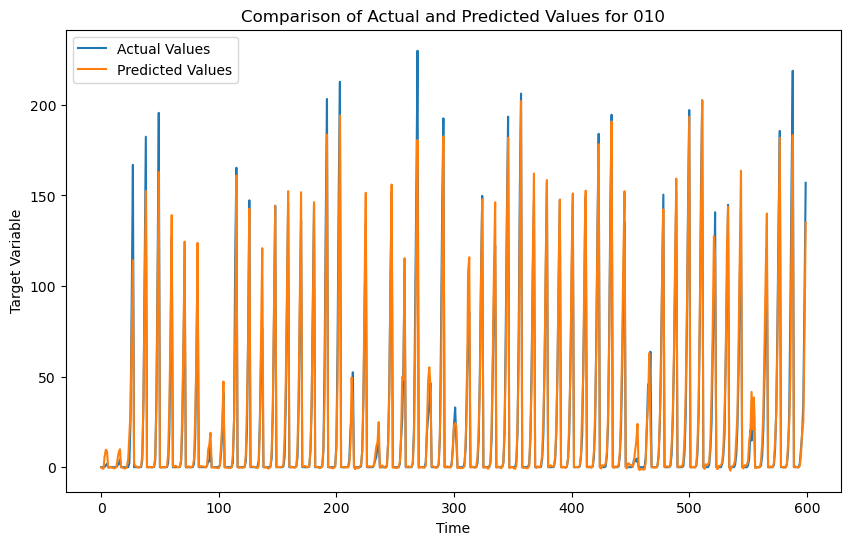

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

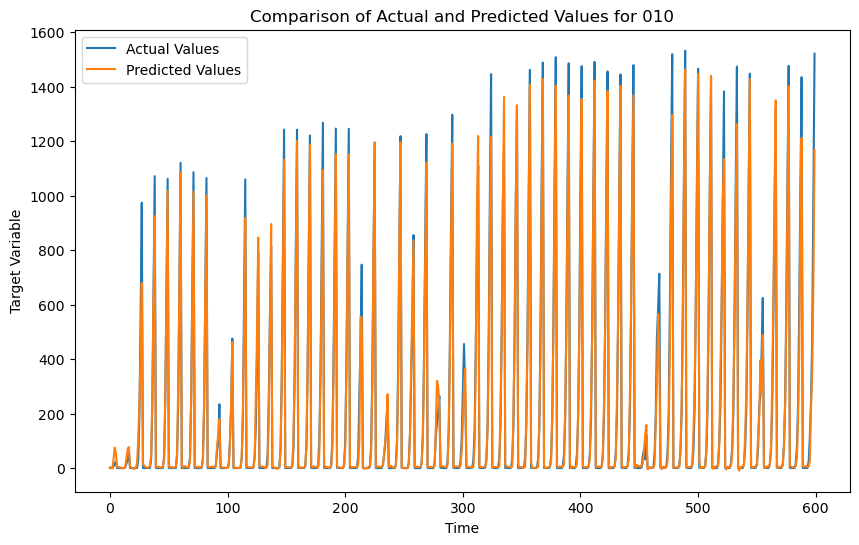

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

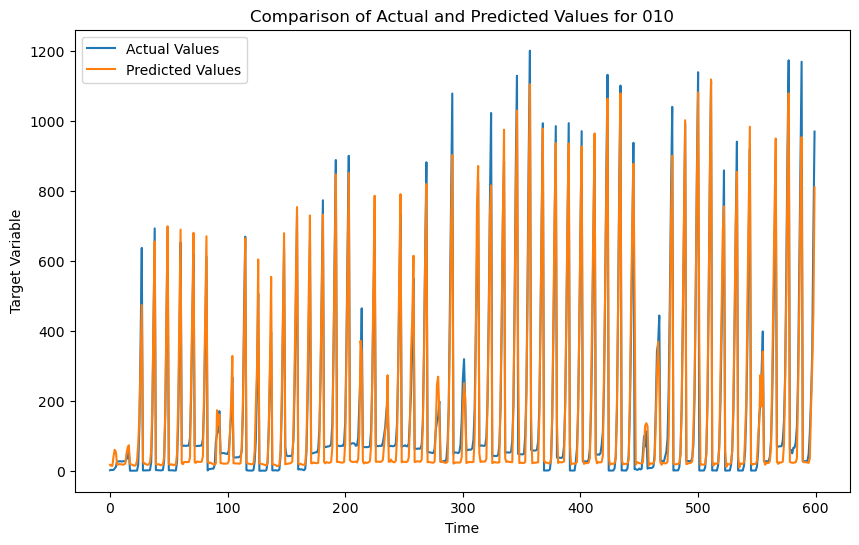

 1/19 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

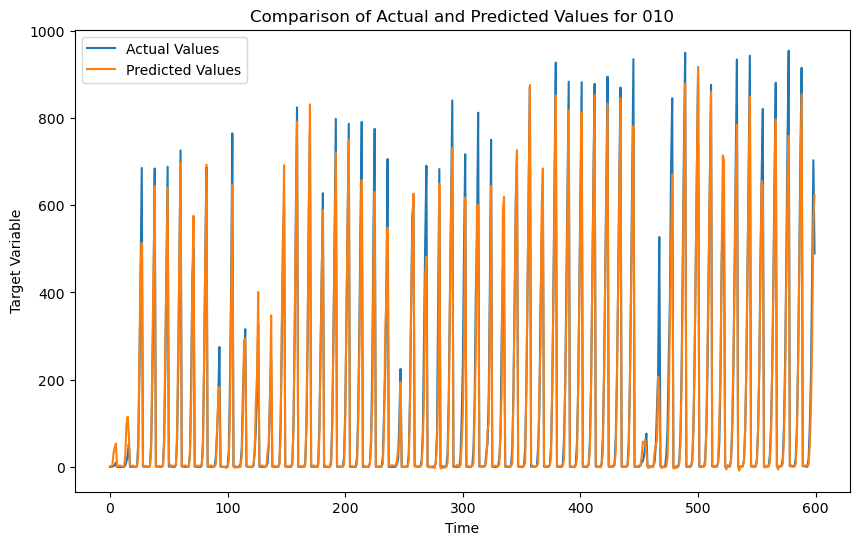

 1/19 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

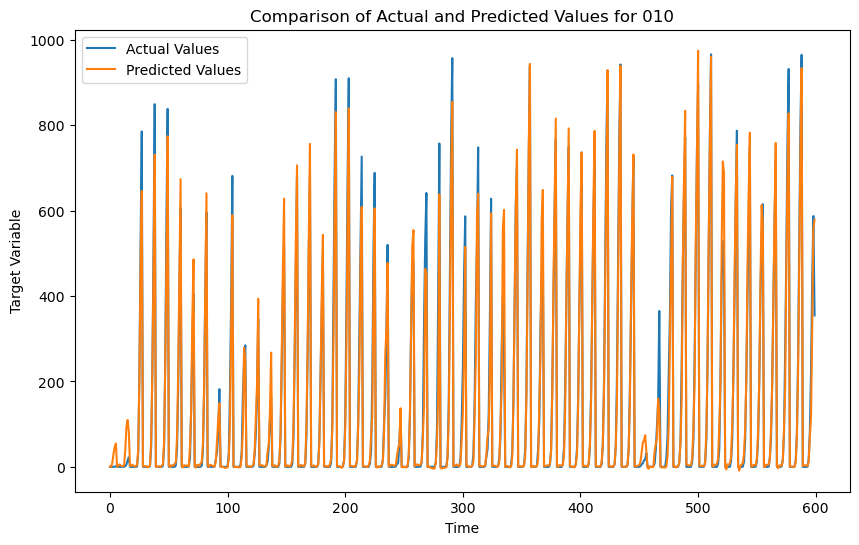

 1/19 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

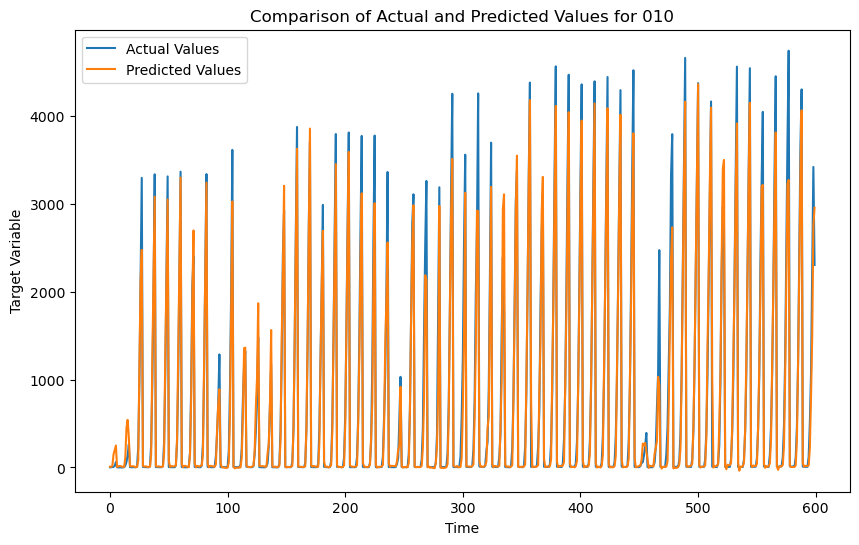

 1/19 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

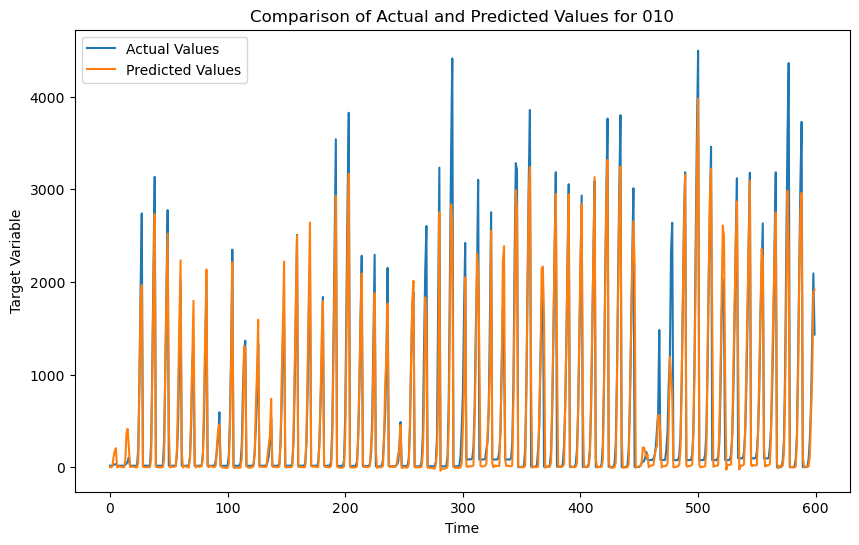

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

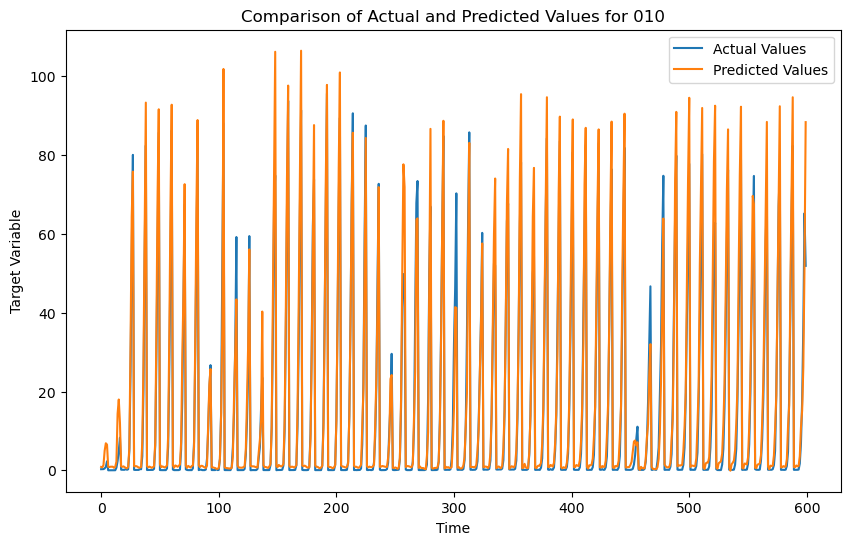

 1/19 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

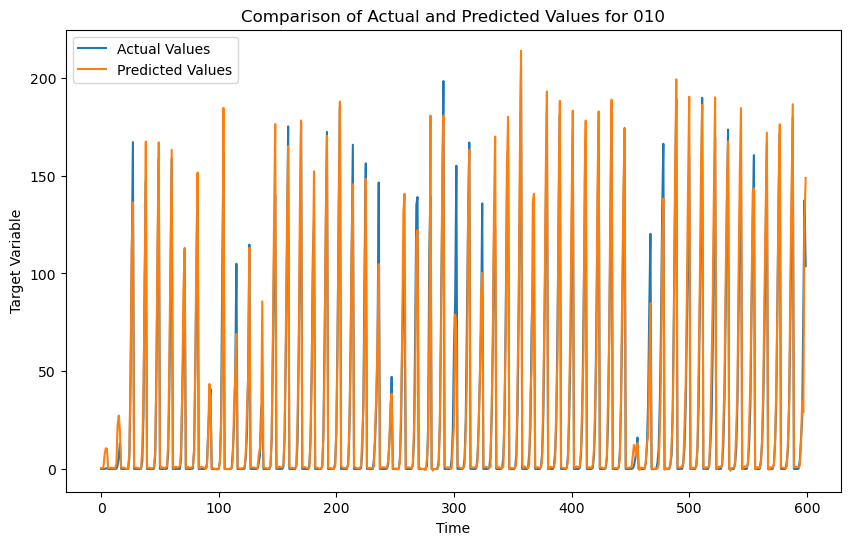

 1/19 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

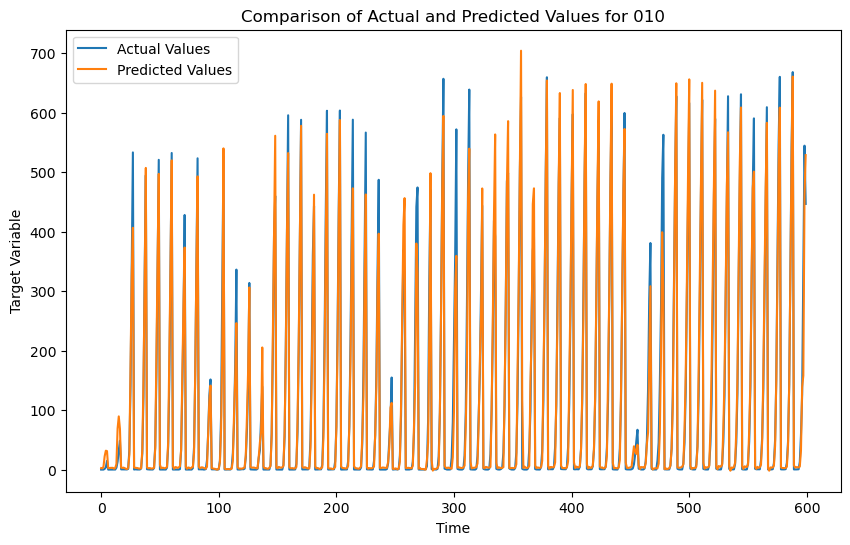

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

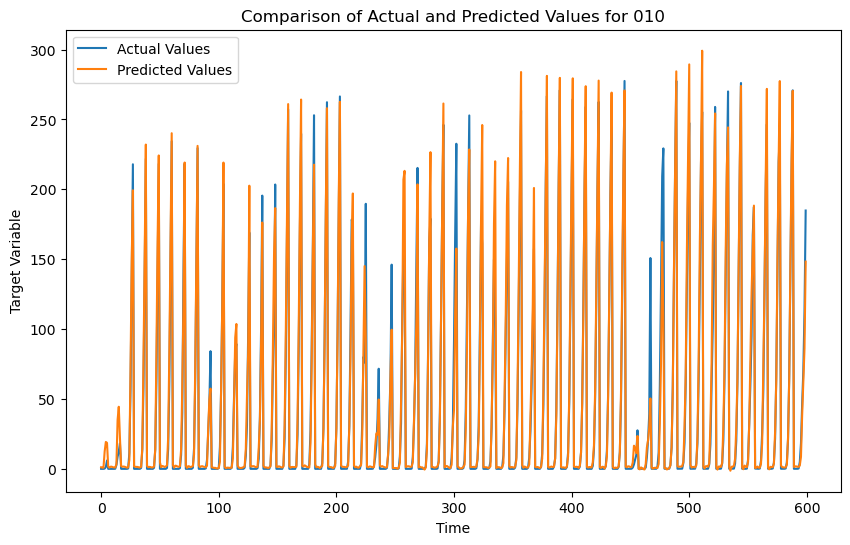

 1/19 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

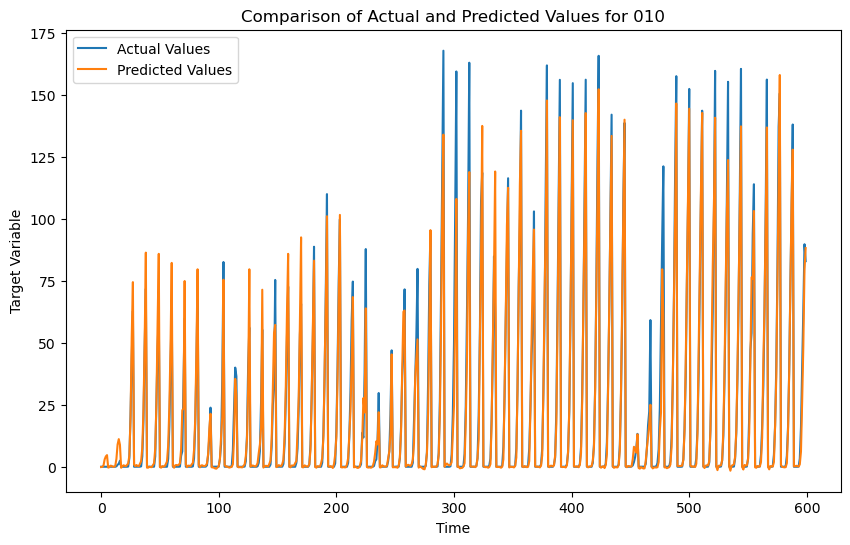

 1/19 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

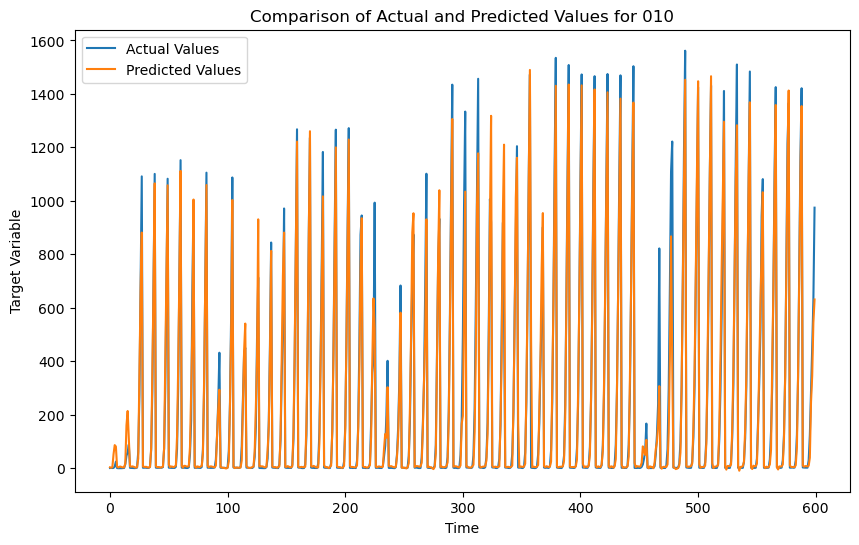

 1/19 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

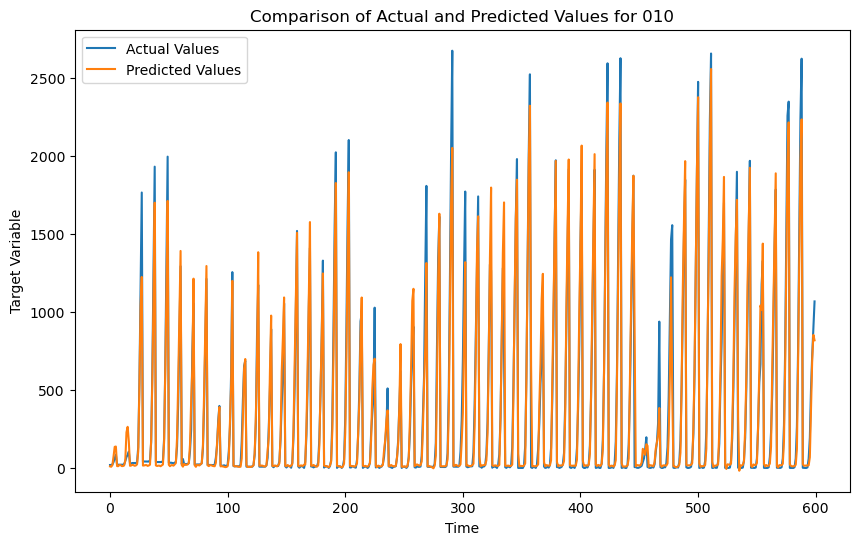

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

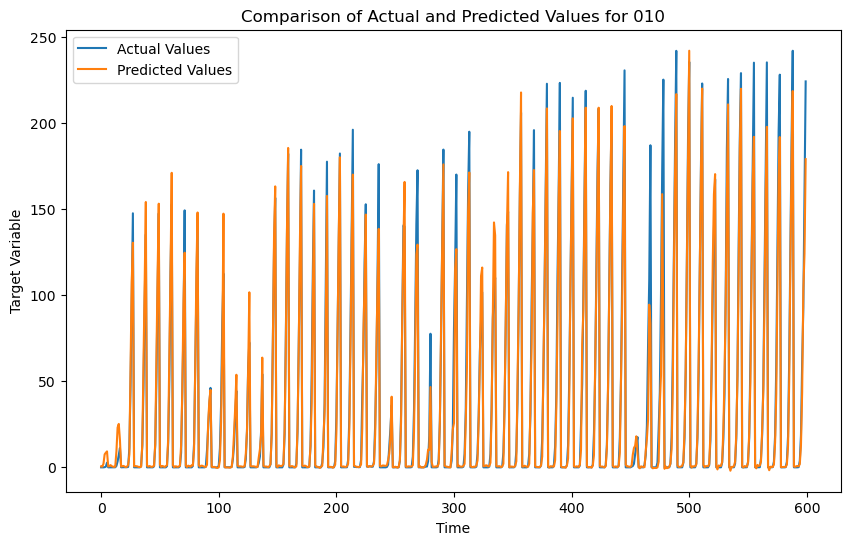

 1/19 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

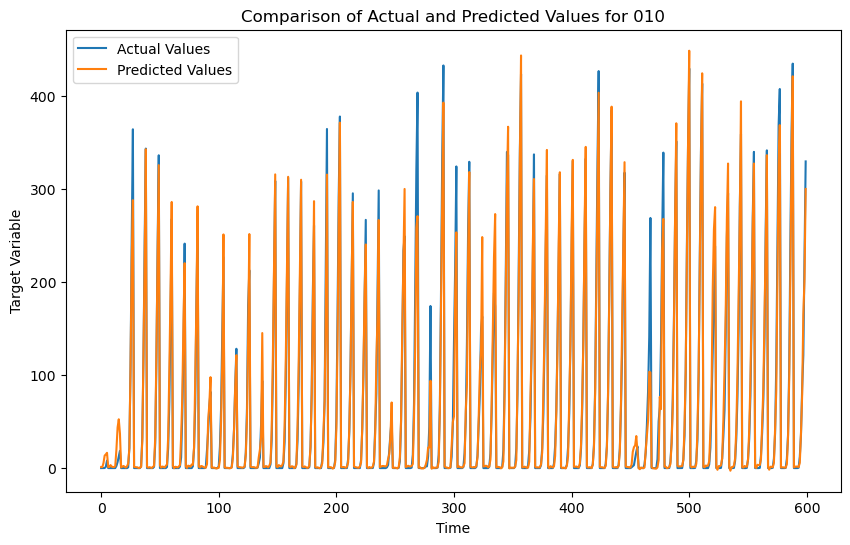

 1/19 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

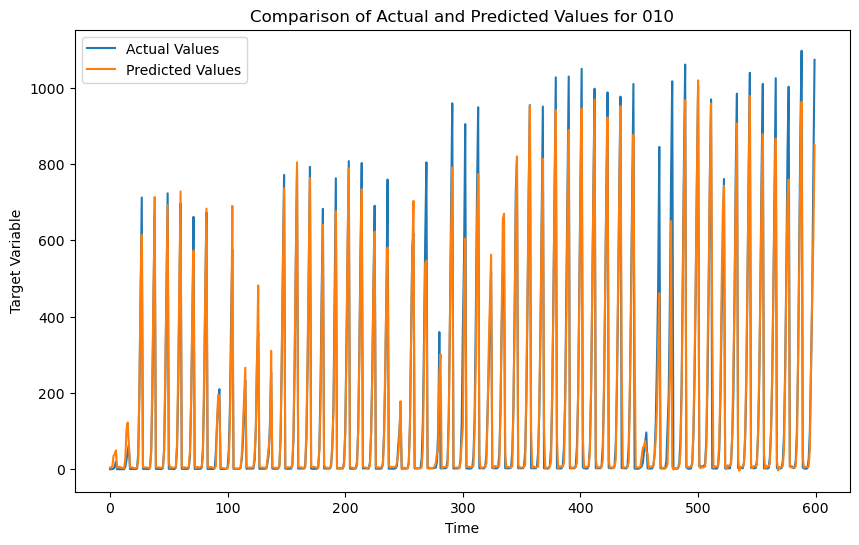

 1/19 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
{'group': (0, 0, 1), 'r2': 0.9342992810348317, 'mse': 464.7522440534986, 'rmse': 21.558113183984783, 'mae': 10.262489374054521}
{'group': (0, 1, 0), 'r2': 0.9497010810008822, 'mse': 20674.001342337437, 'rmse': 143.78456573060072, 'mae': 59.095540095765394}
{'group': (0, 1, 1), 'r2': 0.9391846820311895, 'mse': 4404.2512959417745, 'rmse': 66.36453341915224, 'mae': 30.734582197607754}
{'group': (0, 2, 1), 'r2': 0.8565568681356256, 'mse': 11.686212280357362, 'rmse': 3.4185102428334715, 'mae': 1.928058262216539}
{'group': (0, 3, 0), 'r2': 0.9504214028711181, 'mse': 228206.73522382186, 'rmse': 477.70988604363407, 'mae': 191.6712926512688}
{'group': (0, 3, 1), 'r2': 0.9519855593466142, 'mse': 162039.23620969144, 'rmse': 402.5409745723924, 'mae': 181.52921613423743}
{'group': (1, 1, 0), 'r2': 0.9695544868982304, 'mse': 20.18071319386487, 'rmse': 4.4922948694253, 'mae': 2.0158041768280666}
{'group': (1, 3, 0), 'r2': 0.9758117858512384, 'mse': 192.92778508

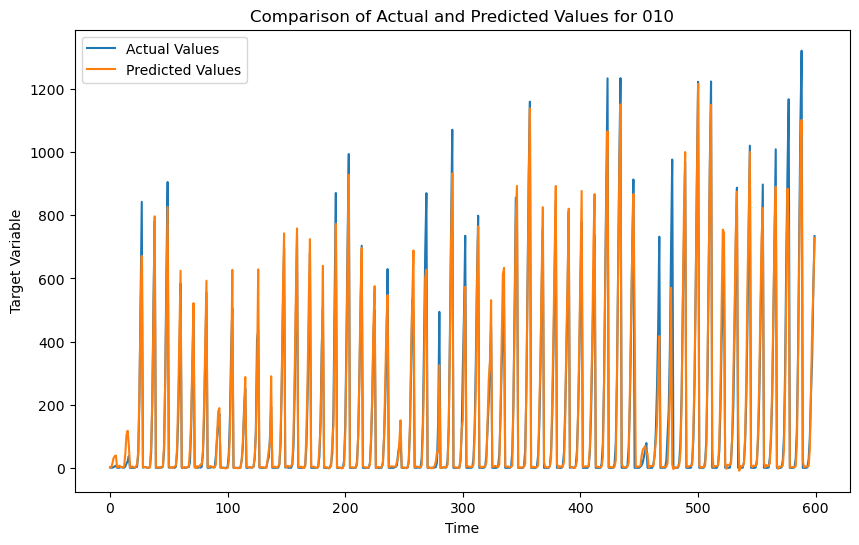

In [16]:



n_future = 1  # Number of days we want to look into the future based on the past days.
n_past = 24
# Filtering for Cluster 2
cluster_data = clustering[clustering['Cluster'] == 2]



# Initialize your scaler and model
scaler = StandardScaler()  # Assuming this should be fitted with training data elsewhere


# Process for each group in Cluster 2
results = []
for group, group_data in cluster_data.groupby(['county', 'product_type', 'is_business']):
    df = group_data[cols].astype(float)
    df_scaled= scaler.fit(df)
    df_scaled = scaler.transform(df)

    testX = []
    testY = []
    for i in range(n_past, len(df_scaled) - n_future + 1):
        testX.append(df_scaled[i - n_past:i])
        testY.append(df_scaled[i + n_future - 1:i + n_future, -1])  # Assuming the last column is still the target

    testX, testY = np.array(testX), np.array(testY)



    n_days_for_prediction = 600



    target_scaler = StandardScaler()
    target_scaler.fit(df[['target']])


# Predict on the last n_days_for_prediction
    prediction_scaled = model.predict(testX[-n_days_for_prediction:])
    prediction = target_scaler.inverse_transform(prediction_scaled)
    actual = target_scaler.inverse_transform(testY[-n_days_for_prediction:])

# Calculate the metrics
    r2 = r2_score(actual, prediction)
    mse = mean_squared_error(actual, prediction)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(actual, prediction)
    results.append({
        'group': group,
        'r2': r2,
        'mse': mse,
        'rmse': rmse,
        'mae': mae
    })
    
    for result in results:
        print(result)


# Plotting
    plt.figure(figsize=(10,6))
    plt.plot(actual, label='Actual Values')
    plt.plot(prediction, label='Predicted Values')
    plt.title(f'Comparison of Actual and Predicted Values for 010')
    plt.xlabel('Time')
    plt.ylabel('Target Variable')
    plt.legend()
    plt.show()

# cluster1

In [43]:
grouped_data = data.groupby(['product_type','is_business','county'])

df1 = grouped_data.get_group((2,0,0))

train_size = int(len(df1) * 0.8)
train_df = df1[:train_size]
test_df = df1[train_size:]
cluster=pd.read_csv('../clustering/clutser_client_production_pdf.csv')
clustering=pd.merge(data,cluster, on=['product_type','is_business','county'],how='inner')

trainX shape == (5547, 48, 17).
trainY shape == (5547, 1).


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_18 (LSTM)                       │ (None, 48, 10)              │           1,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_22 (Dropout)                 │ (None, 48, 10)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_19 (LSTM)                       │ (None, 10)                  │             840 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_23 (Dropout)                 │ (None, 10)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_12 (Dense)                     │ (None, 1)                   │              11 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,971 (7.70 KB)

 Trainable params: 1,971 (7.70 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
500/500 ━━━━━━━━━━━━━━━━━━━━ 28s 44ms/step - loss: 1.0428 - val_loss: 0.0225
Epoch 2/100
500/500 ━━━━━━━━━━━━━━━━━━━━ 21s 42ms/step - loss: 0.9906 - val_loss: 0.0120
Epoch 3/100
500/500 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step - loss: 0.7210 - val_loss: 0.0027
Epoch 4/100
500/500 ━━━━━━━━━━━━━━━━━━━━ 21s 42ms/step - loss: 0.3894 - val_loss: 0.0034
Epoch 5/100
500/500 ━━━━━━━━━━━━━━━━━━━━ 21s 42ms/step - loss: 0.3589 - val_loss: 0.0039
Epoch 6/100
500/500 ━━━━━━━━━━━━━━━━━━━━ 21s 43ms/step - loss: 0.3776 - val_loss: 0.0038
Epoch 7/100
500/500 ━━━━━━━━━━━━━━━━━━━━ 21s 43ms/step - loss: 0.2680 - val_loss: 0.0039
Epoch 8/100
500/500 ━━━━━━━━━━━━━━━━━━━━ 21s 41ms/step - loss: 0.2482 - val_loss: 0.0021
Epoch 9/100
500/500 ━━━━━━━━━━━━━━━━━━━━ 20s 39ms/step - loss: 0.2461 - val_loss: 0.0039
Epoch 10/100
500/500 ━━━━━━━━━━━━━━━━━━━━ 20s 41ms/step - loss: 0.2127 - val_loss: 0.0015
Epoch 11/100
500/500 ━━━━━━━━━━━━━━━━━━━━ 20s 40ms/step - loss: 0.1939 - val_loss: 0.0048
Epoch 12/100
500/50

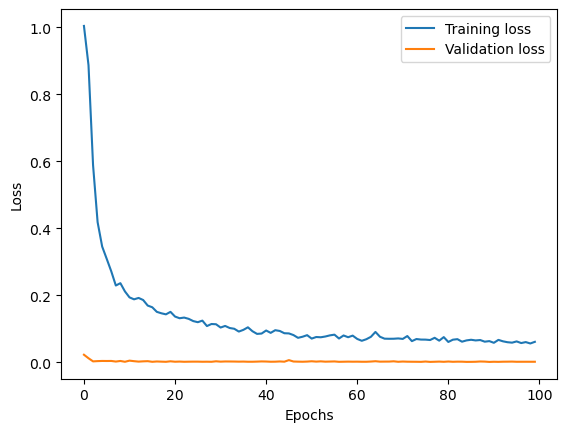

In [44]:
from keras.regularizers import l2 , l1
from keras.regularizers import L1L2  
# Define the columns for training
cols = ['eic_count', 'installed_capacity', 'temperature', 'dewpoint',
        'rain', 'snowfall', 'surface_pressure', 'cloudcover_total', 'windspeed_10m',
        'winddirection_10m', 'shortwave_radiation', 'direct_solar_radiation',
        'diffuse_radiation', 'lowest_price_per_mwh', 'highest_price_per_mwh',
        'elect_prices', 'target']

# Initialize an empty DataFrame to store the scaled data
scaled_data = pd.DataFrame()

df_for_training = train_df[cols].astype(float)
scaler = StandardScaler()
df_for_training_scaled = scaler.fit_transform(df_for_training)

trainX = []
trainY = []
n_future = 1  # Number of days we want to look into the future based on the past days.
n_past = 48 # Number of past days we want to use to predict the future.

for i in range(n_past, len(df_for_training_scaled) - n_future + 1):
    trainX.append(df_for_training_scaled[i - n_past:i])
    trainY.append(df_for_training_scaled[i + n_future - 1:i + n_future, -1])  # Target column is the last one

trainX, trainY = np.array(trainX), np.array(trainY)

print('trainX shape == {}.'.format(trainX.shape))
print('trainY shape == {}.'.format(trainY.shape))


model = Sequential()
# Adjusted the activation function to 'tanh', which is also the default if not specified
model.add(LSTM(10, input_shape=(trainX.shape[1], trainX.shape[2]), return_sequences=True))
model.add(Dropout(1e-5))
# Uncomment and adjust other layers as needed, ensuring activation functions and configurations are compatible
#model.add(GRU(64 ,activation='tanh', return_sequences=True))
#model.add(GRU(32, activation='tanh', return_sequences=True))
model.add(LSTM(10, activation='tanh', return_sequences=False))

#model.add(GRU(32, return_sequences=False,  kernel_regularizer=L1L2(l1=0.01, l2=0.01))) # Activation defaults to 'tanh'
model.add(Dropout(0.2))

model.add(Dense(1))  # Output dimension is 1 as we're predicting a single value
model.compile(optimizer='adam', loss='mse')
model.summary()


history=model.fit(trainX, trainY, epochs=100, batch_size=10, validation_split=0.1, verbose=1)





plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()






 1/15 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


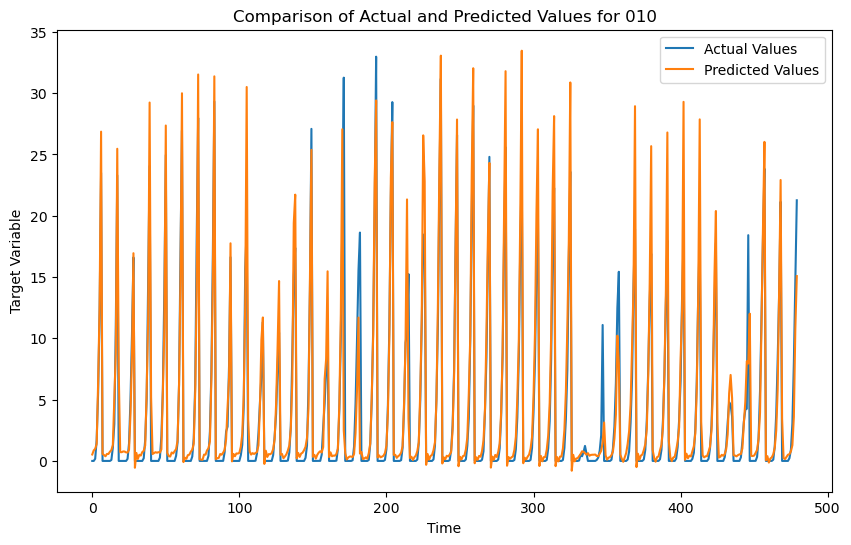

R2 Score: 0.8515485422733301
MSE: 7.686428002114099
RMSE: 2.772440802274072
MAE: 1.3081132123406198



In [46]:
df_test = test_df[cols].astype(float)

# Use the scaler from the training to transform the test data
df_test_scaled1= scaler.fit(df_test)
df_test_scaled = scaler.transform(df_test)

# Initialize the lists for testX and testY
testX = []
testY = []


# Prepare testX and testY
for i in range(n_past, len(df_test_scaled) - n_future + 1):
    testX.append(df_test_scaled[i - n_past:i])
    testY.append(df_test_scaled[i + n_future - 1:i + n_future, -1])  # Assuming the last column is still the target

testX, testY = np.array(testX), np.array(testY)



n_days_for_prediction = 480



target_scaler = StandardScaler()
target_scaler.fit(df_test[['target']])


# Predict on the last n_days_for_prediction
prediction_scaled = model.predict(testX[-n_days_for_prediction:])
prediction = target_scaler.inverse_transform(prediction_scaled)
actual = target_scaler.inverse_transform(testY[-n_days_for_prediction:])
actual = np.repeat(actual, prediction.shape[1], axis=-1)


# Calculate the metrics
r2 = r2_score(actual, prediction)
mse = mean_squared_error(actual, prediction)
rmse = np.sqrt(mse)
mae = mean_absolute_error(actual, prediction)

# Plotting
plt.figure(figsize=(10,6))
plt.plot(actual, label='Actual Values')
plt.plot(prediction, label='Predicted Values')
plt.title(f'Comparison of Actual and Predicted Values for 010')
plt.xlabel('Time')
plt.ylabel('Target Variable')
plt.legend()
plt.show()


print(f"R2 Score: {r2}")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}\n")

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step
{'group': (0, 2, 0), 'r2': 0.7317492635274265, 'mse': 13.593750149112394, 'rmse': 3.686970321159691, 'mae': 2.121475730992179}


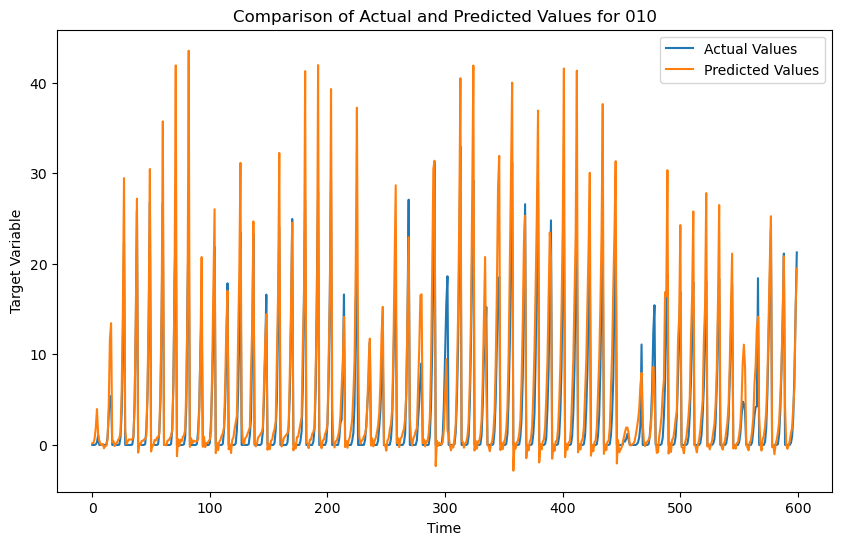

 6/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
{'group': (0, 2, 0), 'r2': 0.7317492635274265, 'mse': 13.593750149112394, 'rmse': 3.686970321159691, 'mae': 2.121475730992179}
{'group': (15, 0, 1), 'r2': 0.8110261367940652, 'mse': 720.396683557817, 'rmse': 26.840206473829834, 'mae': 11.141635714392118}


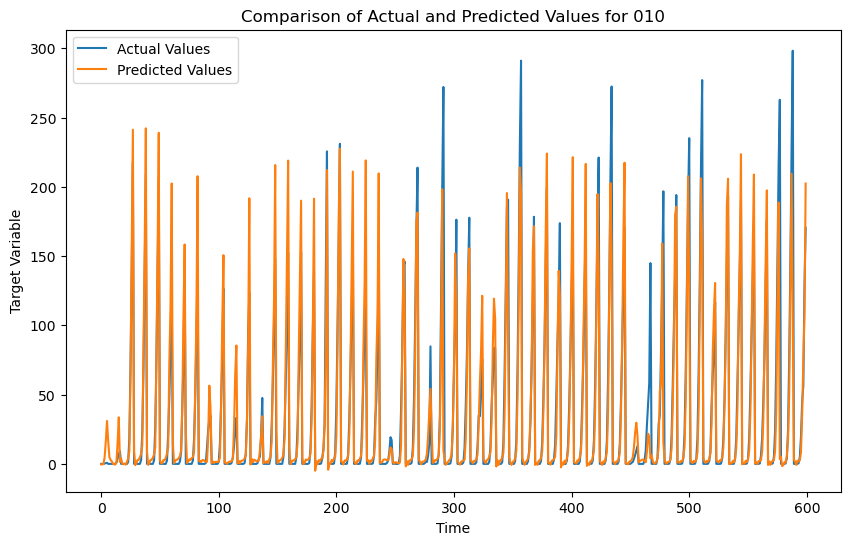

In [47]:
cluster_data = clustering[clustering['Cluster'] == 1]



# Initialize your scaler and model
scaler = StandardScaler()  # Assuming this should be fitted with training data elsewhere


# Process for each group in Cluster 2
results = []
for group, group_data in cluster_data.groupby(['county', 'product_type', 'is_business']):
    df = group_data[cols].astype(float)
    df_scaled= scaler.fit(df)
    df_scaled = scaler.transform(df)

    testX = []
    testY = []
    for i in range(n_past, len(df_scaled) - n_future + 1):
        testX.append(df_scaled[i - n_past:i])
        testY.append(df_scaled[i + n_future - 1:i + n_future, -1])  # Assuming the last column is still the target

    testX, testY = np.array(testX), np.array(testY)



    n_days_for_prediction = 600



    target_scaler = StandardScaler()
    target_scaler.fit(df[['target']])


# Predict on the last n_days_for_prediction
    prediction_scaled = model.predict(testX[-n_days_for_prediction:])
    prediction = target_scaler.inverse_transform(prediction_scaled)
    actual = target_scaler.inverse_transform(testY[-n_days_for_prediction:])

# Calculate the metrics
    r2 = r2_score(actual, prediction)
    mse = mean_squared_error(actual, prediction)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(actual, prediction)
    results.append({
        'group': group,
        'r2': r2,
        'mse': mse,
        'rmse': rmse,
        'mae': mae
    })
    
    for result in results:
        print(result)


# Plotting
    plt.figure(figsize=(10,6))
    plt.plot(actual, label='Actual Values')
    plt.plot(prediction, label='Predicted Values')
    plt.title(f'Comparison of Actual and Predicted Values for 010')
    plt.xlabel('Time')
    plt.ylabel('Target Variable')
    plt.legend()
    plt.show()

# cluster3

In [3]:
file= './poduction.csv'
data=pd.read_csv(file)


grouped_data = data.groupby(['product_type','is_business','county'])


df1 = grouped_data.get_group((3,1,8))

train_size = int(len(df1) * 0.8)
train_df = df1[:train_size]
test_df = df1[train_size:]
cluster=pd.read_csv('./clutser_client_production_pdf.csv')
clustering=pd.merge(data,cluster, on=['product_type','is_business','county'],how='inner')

trainX shape == (5547, 48, 17).
trainY shape == (5547, 1).
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_4 (GRU)                 (None, 48, 56)            12600     
                                                                 
 gru_5 (GRU)                 (None, 56)                19152     
                                                                 
 dropout_4 (Dropout)         (None, 56)                0         
                                                                 
 dense_3 (Dense)             (None, 1)                 57        
                                                                 
Total params: 31809 (124.25 KB)
Trainable params: 31809 (124.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/100


2024-05-04 21:04:09.109925: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-05-04 21:04:09.257470: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-05-04 21:04:09.445164: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-05-04 21:04:09.578257: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


  8/250 [..............................] - ETA: 3s - loss: 1.0070 

2024-05-04 21:04:09.800330: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


250/250 [==============================] - ETA: 0s - loss: 0.6094

2024-05-04 21:04:15.685006: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-05-04 21:04:15.734000: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-05-04 21:04:15.778473: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


250/250 [==============================] - 8s 26ms/step - loss: 0.6094 - val_loss: 0.0448
Epoch 2/100
250/250 [==============================] - 4s 16ms/step - loss: 0.3314 - val_loss: 0.0185
Epoch 3/100
250/250 [==============================] - 4s 16ms/step - loss: 0.1872 - val_loss: 0.0205
Epoch 4/100
250/250 [==============================] - 4s 16ms/step - loss: 0.1409 - val_loss: 0.0153
Epoch 5/100
250/250 [==============================] - 4s 16ms/step - loss: 0.1023 - val_loss: 0.0146
Epoch 6/100
250/250 [==============================] - 4s 16ms/step - loss: 0.0818 - val_loss: 0.0105
Epoch 7/100
250/250 [==============================] - 4s 16ms/step - loss: 0.0659 - val_loss: 0.0157
Epoch 8/100
250/250 [==============================] - 4s 16ms/step - loss: 0.0667 - val_loss: 0.0099
Epoch 9/100
250/250 [==============================] - 4s 16ms/step - loss: 0.0542 - val_loss: 0.0081
Epoch 10/100
250/250 [==============================] - 4s 16ms/step - loss: 0.0565 - val_loss

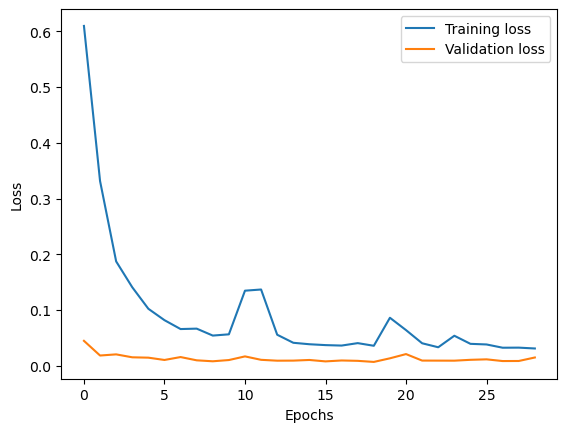

In [9]:
from keras.regularizers import l2 , l1
from keras.regularizers import L1L2  
from keras.callbacks import EarlyStopping
# Define the columns for training
cols = ['eic_count', 'installed_capacity', 'temperature', 'dewpoint',
        'rain', 'snowfall', 'surface_pressure', 'cloudcover_total', 'windspeed_10m',
        'winddirection_10m', 'shortwave_radiation', 'direct_solar_radiation',
        'diffuse_radiation', 'lowest_price_per_mwh', 'highest_price_per_mwh',
        'elect_prices', 'target']

# Initialize an empty DataFrame to store the scaled data
scaled_data = pd.DataFrame()

df_for_training = train_df[cols].astype(float)
scaler = StandardScaler()
df_for_training_scaled = scaler.fit_transform(df_for_training)

trainX = []
trainY = []
n_future = 1  # Number of days we want to look into the future based on the past days.
n_past = 48 # Number of past days we want to use to predict the future.

for i in range(n_past, len(df_for_training_scaled) - n_future + 1):
    trainX.append(df_for_training_scaled[i - n_past:i])
    trainY.append(df_for_training_scaled[i + n_future - 1:i + n_future, -1])  # Target column is the last one

trainX, trainY = np.array(trainX), np.array(trainY)

print('trainX shape == {}.'.format(trainX.shape))
print('trainY shape == {}.'.format(trainY.shape))


model = Sequential()
# Adjusted the activation function to 'tanh', which is also the default if not specified
model.add(GRU(56, input_shape=(trainX.shape[1], trainX.shape[2]), return_sequences=True))

# Uncomment and adjust other layers as needed, ensuring activation functions and configurations are compatible
#model.add(GRU(64 ,activation='tanh', return_sequences=True))
#model.add(GRU(32, activation='tanh', return_sequences=True))
model.add(GRU(56, activation='tanh', return_sequences=False))

model.add(Dropout(0.2))

model.add(Dense(1))  # Output dimension is 1 as we're predicting a single value
model.compile(optimizer='adam', loss='mse')
model.summary()
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

history = model.fit(trainX, trainY, epochs=100, batch_size=20, validation_split=0.1, verbose=1, callbacks=[early_stopping])







plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

2/2 [==============================] - 0s 14ms/step


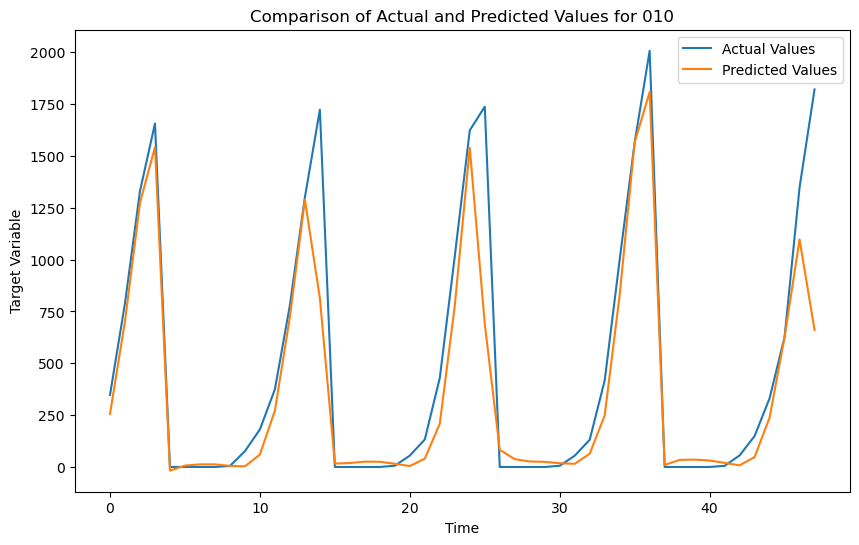

R2 Score: 0.8152172222895868
MSE: 76378.99583317369
RMSE: 276.36750140559883
MAE: 127.30563624076048



In [12]:
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score


df_test = test_df[cols].astype(float)

# Use the scaler from the training to transform the test data
df_test_scaled1= scaler.fit(df_test)
df_test_scaled = scaler.transform(df_test)

# Initialize the lists for testX and testY
testX = []
testY = []


# Prepare testX and testY
for i in range(n_past, len(df_test_scaled) - n_future + 1):
    testX.append(df_test_scaled[i - n_past:i])
    testY.append(df_test_scaled[i + n_future - 1:i + n_future, -1])  # Assuming the last column is still the target

testX, testY = np.array(testX), np.array(testY)



n_days_for_prediction = 48



target_scaler = StandardScaler()
target_scaler.fit(df_test[['target']])


# Predict on the last n_days_for_prediction
prediction_scaled = model.predict(testX[-n_days_for_prediction:])
prediction = target_scaler.inverse_transform(prediction_scaled)
actual = target_scaler.inverse_transform(testY[-n_days_for_prediction:])



# Calculate the metrics
r2 = r2_score(actual, prediction)
mse = mean_squared_error(actual, prediction)
rmse = np.sqrt(mse)
mae = mean_absolute_error(actual, prediction)

# Plotting
plt.figure(figsize=(10,6))
plt.plot(actual, label='Actual Values')
plt.plot(prediction, label='Predicted Values')
plt.title(f'Comparison of Actual and Predicted Values for 010')
plt.xlabel('Time')
plt.ylabel('Target Variable')
plt.legend()
plt.show()


print(f"R2 Score: {r2}")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}\n")

# cluster 5

In [17]:
file= './poduction.csv'
data=pd.read_csv(file)


grouped_data = data.groupby(['product_type','is_business','county'])


df = grouped_data.get_group((1,1,4))

train_size = int(len(df) * 0.8)
train_df = df[:train_size]
test_df = df[train_size:]
cluster=pd.read_csv('./clutser_client_production_pdf.csv')
clustering=pd.merge(data,cluster, on=['product_type','is_business','county'],how='inner')

In [35]:
from keras.models import Sequential
from keras.layers import Dense, Dropout, LSTM
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint
cols = ['eic_count', 'installed_capacity', 'temperature', 'dewpoint',
        'rain', 'snowfall', 'surface_pressure', 'cloudcover_total', 'windspeed_10m',
        'winddirection_10m', 'shortwave_radiation', 'direct_solar_radiation',
        'diffuse_radiation', 'lowest_price_per_mwh', 'highest_price_per_mwh',
        'elect_prices', 'target']

# Initialize an empty DataFrame to store the scaled data
scaled_data = pd.DataFrame()

df_for_training = train_df[cols].astype(float)
scaler = StandardScaler()
df_for_training_scaled = scaler.fit_transform(df_for_training)

trainX = []
trainY = []
n_future = 1  # Number of days we want to look into the future based on the past days.
n_past = 72# Number of past days we want to use to predict the future.

for i in range(n_past, len(df_for_training_scaled) - n_future + 1):
    trainX.append(df_for_training_scaled[i - n_past:i])
    trainY.append(df_for_training_scaled[i + n_future - 1:i + n_future, -1])  # Target column is the last one

x_data, y_data = np.array(trainX), np.array(trainY)

print('trainX shape == {}.'.format(x_data.shape))
print('trainY shape == {}.'.format(y_data.shape))


model = Sequential()
    # Adding the first layer
model.add(LSTM(64, input_shape=(x_data.shape[1], x_data.shape[2]), return_sequences=True))
    # Adding the second layer 
model.add(LSTM(32, return_sequences=True))
    # Adding a dropout value in order to prevent overfiting

    # Adding the third layer
model.add(LSTM(16))
model.add(Dropout(0.2))
    # Adding the output layer. 6 nodes are selected because the data has 6 features
model.add(Dense(1))
    
    # Choosing the optimizer
optimizer = Adam(lr=0.001)
    
    # Compiling the model
model.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['mean_squared_error'])
    
    # Fitting the model
history = model.fit(x_data, y_data, validation_split=0.2, epochs=50, batch_size=10)

trainX shape == (4449, 72, 17).
trainY shape == (4449, 1).


Epoch 1/50


2024-05-04 21:59:19.898966: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-05-04 21:59:20.126559: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-05-04 21:59:20.461020: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-05-04 21:59:20.546538: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-05-04 21:59:20.698548: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-05-04 21:59:20.870234: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


  1/356 [..............................] - ETA: 17:21 - loss: 0.1347 - mean_squared_error: 0.1347

2024-05-04 21:59:21.007391: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


356/356 [==============================] - ETA: 0s - loss: 0.8086 - mean_squared_error: 0.8086

2024-05-04 21:59:30.978888: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-05-04 21:59:31.066462: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-05-04 21:59:31.142336: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-05-04 21:59:31.209401: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


356/356 [==============================] - 14s 31ms/step - loss: 0.8086 - mean_squared_error: 0.8086 - val_loss: 0.0082 - val_mean_squared_error: 0.0082
Epoch 2/50
356/356 [==============================] - 8s 24ms/step - loss: 0.3510 - mean_squared_error: 0.3510 - val_loss: 0.0075 - val_mean_squared_error: 0.0075
Epoch 3/50
356/356 [==============================] - 9s 24ms/step - loss: 0.2240 - mean_squared_error: 0.2240 - val_loss: 0.0022 - val_mean_squared_error: 0.0022
Epoch 4/50
356/356 [==============================] - 10s 27ms/step - loss: 0.1600 - mean_squared_error: 0.1600 - val_loss: 0.0064 - val_mean_squared_error: 0.0064
Epoch 5/50
356/356 [==============================] - 9s 24ms/step - loss: 0.2305 - mean_squared_error: 0.2305 - val_loss: 0.0141 - val_mean_squared_error: 0.0141
Epoch 6/50
356/356 [==============================] - 8s 24ms/step - loss: 0.1542 - mean_squared_error: 0.1542 - val_loss: 0.0019 - val_mean_squared_error: 0.0019
Epoch 7/50
356/356 [===========

2024-05-04 22:26:28.857945: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-05-04 22:26:29.002636: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-05-04 22:26:29.159809: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-05-04 22:26:29.247383: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


2/2 [==============================] - 1s 67ms/step


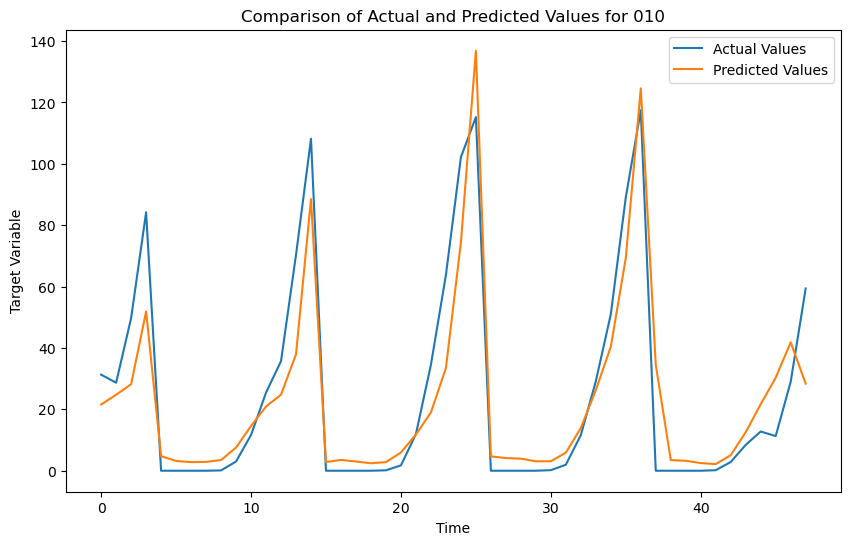

R2 Score: 0.8442358931477805
MSE: 191.9406463486117
RMSE: 13.854264554591547
MAE: 9.639099508285522



In [36]:
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score


df_test = test_df[cols].astype(float)

# Use the scaler from the training to transform the test data
df_test_scaled1= scaler.fit(df_test)
df_test_scaled = scaler.transform(df_test)

# Initialize the lists for testX and testY
testX = []
testY = []


# Prepare testX and testY
for i in range(n_past, len(df_test_scaled) - n_future + 1):
    testX.append(df_test_scaled[i - n_past:i])
    testY.append(df_test_scaled[i + n_future - 1:i + n_future, -1])  # Assuming the last column is still the target

testX, testY = np.array(testX), np.array(testY)



n_days_for_prediction = 48



target_scaler = StandardScaler()
target_scaler.fit(df_test[['target']])


# Predict on the last n_days_for_prediction
prediction_scaled = model.predict(testX[-n_days_for_prediction:])
prediction = target_scaler.inverse_transform(prediction_scaled)
actual = target_scaler.inverse_transform(testY[-n_days_for_prediction:])


# Calculate the metrics
r2 = r2_score(actual, prediction)
mse = mean_squared_error(actual, prediction)
rmse = np.sqrt(mse)
mae = mean_absolute_error(actual, prediction)

# Plotting
plt.figure(figsize=(10,6))
plt.plot(actual, label='Actual Values')
plt.plot(prediction, label='Predicted Values')
plt.title(f'Comparison of Actual and Predicted Values for 010')
plt.xlabel('Time')
plt.ylabel('Target Variable')
plt.legend()
plt.show()


print(f"R2 Score: {r2}")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}\n")

# cluster 4

In [37]:
file= './poduction.csv'
data=pd.read_csv(file)


grouped_data = data.groupby(['product_type','is_business','county'])


df = grouped_data.get_group((0,1,11))

train_size = int(len(df) * 0.8)
train_df = df[:train_size]
test_df = df[train_size:]
cluster=pd.read_csv('./clutser_client_production_pdf.csv')
clustering=pd.merge(data,cluster, on=['product_type','is_business','county'],how='inner')

trainX shape == (4200, 48, 17).
trainY shape == (4200, 1).


Epoch 1/50


2024-05-04 23:29:00.251906: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-05-04 23:29:00.563064: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-05-04 23:29:00.703557: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-05-04 23:29:00.918193: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-05-04 23:29:01.122186: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


378/378 [==============================] - ETA: 0s - loss: 0.7632 - mean_squared_error: 0.7632

2024-05-04 23:29:08.375547: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-05-04 23:29:08.452384: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-05-04 23:29:08.575227: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


378/378 [==============================] - 10s 20ms/step - loss: 0.7632 - mean_squared_error: 0.7632 - val_loss: 0.0084 - val_mean_squared_error: 0.0084
Epoch 2/50
378/378 [==============================] - 6s 15ms/step - loss: 0.4235 - mean_squared_error: 0.4235 - val_loss: 0.0063 - val_mean_squared_error: 0.0063
Epoch 3/50
378/378 [==============================] - 6s 16ms/step - loss: 0.2721 - mean_squared_error: 0.2721 - val_loss: 0.0070 - val_mean_squared_error: 0.0070
Epoch 4/50
378/378 [==============================] - 6s 15ms/step - loss: 0.1989 - mean_squared_error: 0.1989 - val_loss: 0.0058 - val_mean_squared_error: 0.0058
Epoch 5/50
378/378 [==============================] - 6s 15ms/step - loss: 0.1859 - mean_squared_error: 0.1859 - val_loss: 0.0059 - val_mean_squared_error: 0.0059
Epoch 6/50
378/378 [==============================] - 6s 16ms/step - loss: 0.1336 - mean_squared_error: 0.1336 - val_loss: 0.0058 - val_mean_squared_error: 0.0058
Epoch 7/50
378/378 [============

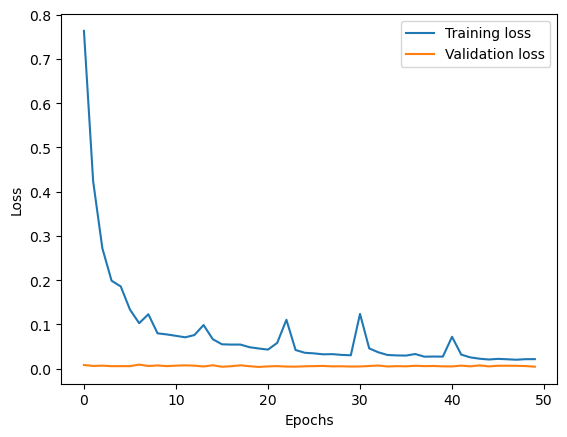

In [55]:

cols = ['eic_count', 'installed_capacity', 'temperature', 'dewpoint',
        'rain', 'snowfall', 'surface_pressure', 'cloudcover_total', 'windspeed_10m',
        'winddirection_10m', 'shortwave_radiation', 'direct_solar_radiation',
        'diffuse_radiation', 'lowest_price_per_mwh', 'highest_price_per_mwh',
        'elect_prices', 'target']

# Initialize an empty DataFrame to store the scaled data
scaled_data = pd.DataFrame()

df_for_training = train_df[cols].astype(float)
scaler = StandardScaler()
df_for_training_scaled = scaler.fit_transform(df_for_training)

trainX = []
trainY = []
n_future = 1  # Number of days we want to look into the future based on the past days.
n_past = 48# Number of past days we want to use to predict the future.

for i in range(n_past, len(df_for_training_scaled) - n_future + 1):
    trainX.append(df_for_training_scaled[i - n_past:i])
    trainY.append(df_for_training_scaled[i + n_future - 1:i + n_future, -1])  # Target column is the last one

x_data, y_data = np.array(trainX), np.array(trainY)

print('trainX shape == {}.'.format(x_data.shape))
print('trainY shape == {}.'.format(y_data.shape))


model = Sequential()
    # Adding the first layer
model.add(LSTM(32, input_shape=(x_data.shape[1], x_data.shape[2]), return_sequences=True))
    # Adding the second layer 
model.add(LSTM(32, return_sequences=False))
model.add(Dropout(0.2))
    # Adding the output layer. 6 nodes are selected because the data has 6 features
model.add(Dense(1))
    
    # Choosing the optimizer
optimizer = Adam(lr=0.0001)
    
    # Compiling the model
model.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['mean_squared_error'])
    
    # Fitting the model
history = model.fit(x_data, y_data, validation_split=0.1, epochs=50, batch_size=10)



plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

2024-05-04 23:34:04.137418: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-05-04 23:34:04.195236: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-05-04 23:34:04.325108: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


19/19 [==============================] - 1s 9ms/step
{'group': (2, 1, 1), 'r2': 0.6735164836788752, 'mse': 34.043554714218914, 'rmse': 5.834685485458399, 'mae': 3.513252164470852}


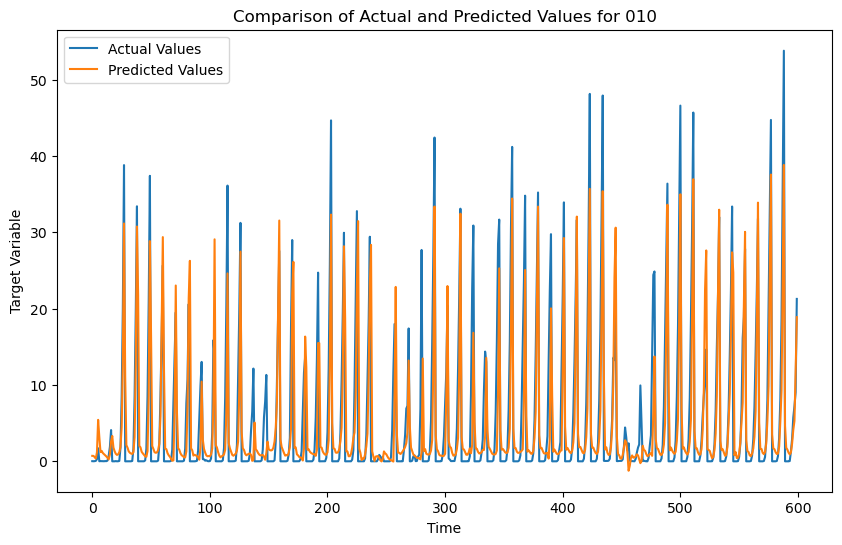

19/19 [==============================] - 0s 5ms/step
{'group': (2, 1, 1), 'r2': 0.6735164836788752, 'mse': 34.043554714218914, 'rmse': 5.834685485458399, 'mae': 3.513252164470852}
{'group': (11, 0, 1), 'r2': 0.6971576094241082, 'mse': 588.3864093512566, 'rmse': 24.2566776239298, 'mae': 12.724999778411338}


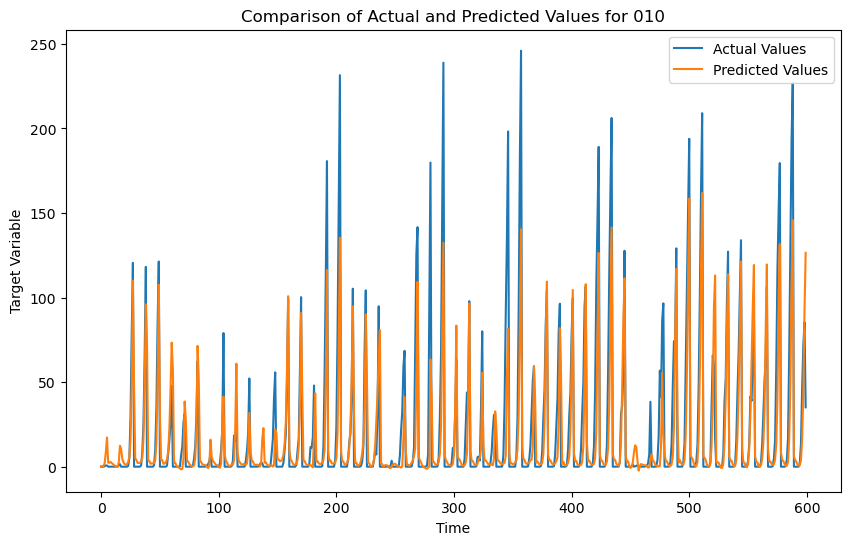

In [56]:
cluster_data = clustering[clustering['Cluster'] == 4]



# Initialize your scaler and model
scaler = StandardScaler()  # Assuming this should be fitted with training data elsewhere


# Process for each group in Cluster 2
results = []
for group, group_data in cluster_data.groupby(['county', 'product_type', 'is_business']):
    df = group_data[cols].astype(float)
    df_scaled= scaler.fit(df)
    df_scaled = scaler.transform(df)

    testX = []
    testY = []
    for i in range(n_past, len(df_scaled) - n_future + 1):
        testX.append(df_scaled[i - n_past:i])
        testY.append(df_scaled[i + n_future - 1:i + n_future, -1])  # Assuming the last column is still the target

    testX, testY = np.array(testX), np.array(testY)



    n_days_for_prediction = 600



    target_scaler = StandardScaler()
    target_scaler.fit(df[['target']])


# Predict on the last n_days_for_prediction
    prediction_scaled = model.predict(testX[-n_days_for_prediction:])
    prediction = target_scaler.inverse_transform(prediction_scaled)
    actual = target_scaler.inverse_transform(testY[-n_days_for_prediction:])

# Calculate the metrics
    r2 = r2_score(actual, prediction)
    mse = mean_squared_error(actual, prediction)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(actual, prediction)
    results.append({
        'group': group,
        'r2': r2,
        'mse': mse,
        'rmse': rmse,
        'mae': mae
    })
    
    for result in results:
        print(result)


# Plotting
    plt.figure(figsize=(10,6))
    plt.plot(actual, label='Actual Values')
    plt.plot(prediction, label='Predicted Values')
    plt.title(f'Comparison of Actual and Predicted Values for 010')
    plt.xlabel('Time')
    plt.ylabel('Target Variable')
    plt.legend()
    plt.show()

# cluster 6

In [6]:
file= '../data/poduction.csv'
data=pd.read_csv(file)


grouped_data = data.groupby(['product_type','is_business','county'])


df = grouped_data.get_group((2,1,11))

train_size = int(len(df) * 0.8)
train_df = df[:train_size]
test_df = df[train_size:]
cluster=pd.read_csv('../clustering/clutser_client_production_pdf.csv')
clustering=pd.merge(data,cluster, on=['product_type','is_business','county'],how='inner')

In [4]:
import tensorflow as tf

print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))



Num GPUs Available:  0


In [7]:
from keras.models import Sequential
from keras.layers import Dense, Dropout, LSTM
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint
cols = ['eic_count', 'installed_capacity', 'temperature', 'dewpoint',
        'rain', 'snowfall', 'surface_pressure', 'cloudcover_total', 'windspeed_10m',
        'winddirection_10m', 'shortwave_radiation', 'direct_solar_radiation',
        'diffuse_radiation', 'lowest_price_per_mwh', 'highest_price_per_mwh',
        'elect_prices', 'target']

# Initialize an empty DataFrame to store the scaled data
scaled_data = pd.DataFrame()

df_for_training = train_df[cols].astype(float)
scaler = StandardScaler()
df_for_training_scaled = scaler.fit_transform(df_for_training)

trainX = []
trainY = []
n_future = 1  # Number of days we want to look into the future based on the past days.
n_past = 48# Number of past days we want to use to predict the future.

for i in range(n_past, len(df_for_training_scaled) - n_future + 1):
    trainX.append(df_for_training_scaled[i - n_past:i])
    trainY.append(df_for_training_scaled[i + n_future - 1:i + n_future, -1])  # Target column is the last one

x_data, y_data = np.array(trainX), np.array(trainY)

print('trainX shape == {}.'.format(x_data.shape))
print('trainY shape == {}.'.format(y_data.shape))


model = Sequential()
    # Adding the first layer
model.add(LSTM(32, input_shape=(x_data.shape[1], x_data.shape[2]), return_sequences=True))
    # Adding the second layer 
model.add(LSTM(32, return_sequences=True))
    # Adding a dropout value in order to prevent overfiting

    # Adding the third layer
model.add(LSTM(16))
model.add(Dropout(0.2))
    # Adding the output layer. 6 nodes are selected because the data has 6 features
model.add(Dense(1))
    
    # Choosing the optimizer
optimizer = Adam(lr=0.00001)
    
    # Compiling the model
model.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['mean_squared_error'])
    
    # Fitting the model
history = model.fit(x_data, y_data, validation_split=0.1, epochs=50, batch_size=10)
plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

trainX shape == (4351, 48, 17).
trainY shape == (4351, 1).


C:\Users\Ghada\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


ValueError: Argument(s) not recognized: {'lr': 1e-05}

2024-05-04 23:39:59.777598: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-05-04 23:39:59.878930: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-05-04 23:40:00.018788: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-05-04 23:40:00.126462: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


15/15 [==============================] - 1s 12ms/step


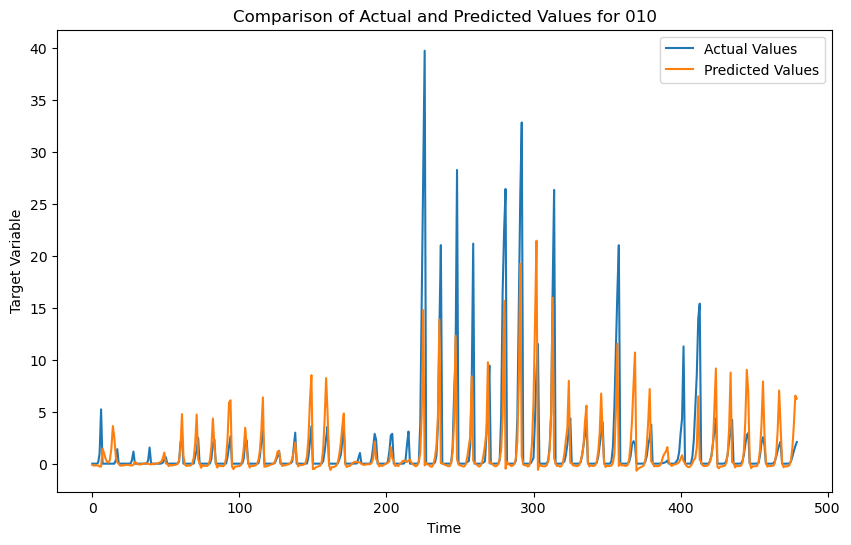

R2 Score: 0.17077201761330607
MSE: 17.872264174408055
RMSE: 4.22756007342392
MAE: 1.4462415061504676



In [59]:
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score


df_test = test_df[cols].astype(float)

# Use the scaler from the training to transform the test data
df_test_scaled1= scaler.fit(df_test)
df_test_scaled = scaler.transform(df_test)

# Initialize the lists for testX and testY
testX = []
testY = []


# Prepare testX and testY
for i in range(n_past, len(df_test_scaled) - n_future + 1):
    testX.append(df_test_scaled[i - n_past:i])
    testY.append(df_test_scaled[i + n_future - 1:i + n_future, -1])  # Assuming the last column is still the target

testX, testY = np.array(testX), np.array(testY)



n_days_for_prediction = 480



target_scaler = StandardScaler()
target_scaler.fit(df_test[['target']])


# Predict on the last n_days_for_prediction
prediction_scaled = model.predict(testX[-n_days_for_prediction:])
prediction = target_scaler.inverse_transform(prediction_scaled)
actual = target_scaler.inverse_transform(testY[-n_days_for_prediction:])


# Calculate the metrics
r2 = r2_score(actual, prediction)
mse = mean_squared_error(actual, prediction)
rmse = np.sqrt(mse)
mae = mean_absolute_error(actual, prediction)

# Plotting
plt.figure(figsize=(10,6))
plt.plot(actual, label='Actual Values')
plt.plot(prediction, label='Predicted Values')
plt.title(f'Comparison of Actual and Predicted Values for 010')
plt.xlabel('Time')
plt.ylabel('Target Variable')
plt.legend()
plt.show()


print(f"R2 Score: {r2}")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}\n")

trainX shape == (4351, 48, 17).
trainY shape == (4351, 1).


C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_3 (LSTM)                        │ (None, 48, 12)              │           1,440 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_4 (LSTM)                        │ (None, 48, 6)               │             456 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_5 (LSTM)                        │ (None, 1)                   │              32 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ repeat_vector (RepeatVector)         │ (None, 12, 1)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_6 (LSTM)                        │ (None, 12, 12)              │             672 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_7 (LSTM)                        │ (None, 12, 6)               │             456 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed (TimeDistributed)   │ (None, 12, 1)               │               7 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,063 (11.96 KB)

 Trainable params: 3,063 (11.96 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
392/392 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - loss: 0.9960 - val_loss: 0.5813
Epoch 2/50
392/392 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - loss: 1.0956 - val_loss: 0.5794
Epoch 3/50
392/392 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step - loss: 1.0812 - val_loss: 0.5765
Epoch 4/50
392/392 ━━━━━━━━━━━━━━━━━━━━ 15s 39ms/step - loss: 0.8365 - val_loss: 0.6008
Epoch 5/50
392/392 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 1.0046 - val_loss: 0.5962
Epoch 6/50
392/392 ━━━━━━━━━━━━━━━━━━━━ 11s 27ms/step - loss: 1.0233 - val_loss: 0.5876
Epoch 7/50
392/392 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.9533 - val_loss: 0.6045
Epoch 8/50
392/392 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.9812 - val_loss: 0.5437
Epoch 9/50
392/392 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - loss: 0.8548 - val_loss: 0.5305
Epoch 10/50
392/392 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.8587 - val_loss: 0.5248
Epoch 11/50
392/392 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.8158 - val_loss: 0.5276
Epoch 12/50
392/392 ━━━━━━━━━━

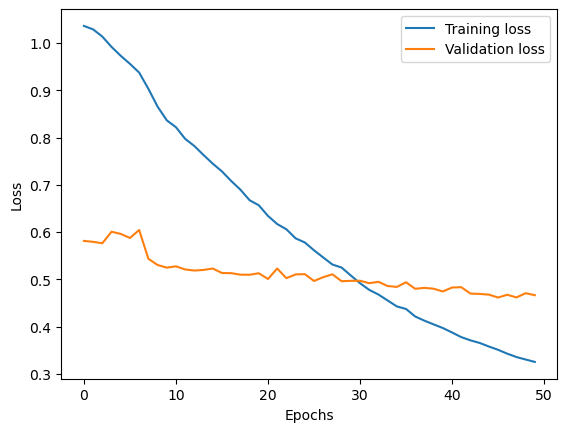

In [8]:
import tensorflow.keras.layers as L

from tensorflow.keras import optimizers
scaled_data = pd.DataFrame()

df_for_training = train_df[cols].astype(float)
scaler = StandardScaler()
df_for_training_scaled = scaler.fit_transform(df_for_training)

trainX = []
trainY = []
n_future = 1  # Number of days we want to look into the future based on the past days.
n_past = 48# Number of past days we want to use to predict the future.

for i in range(n_past, len(df_for_training_scaled) - n_future + 1):
    trainX.append(df_for_training_scaled[i - n_past:i])
    trainY.append(df_for_training_scaled[i + n_future - 1:i + n_future, -1])  # Target column is the last one

x_data, y_data = np.array(trainX), np.array(trainY)

print('trainX shape == {}.'.format(x_data.shape))
print('trainY shape == {}.'.format(y_data.shape))


encoder_decoder = Sequential()
encoder_decoder.add(L.LSTM(12, activation='relu', input_shape=(x_data.shape[1], x_data.shape[2]), return_sequences=True))
encoder_decoder.add(L.LSTM(6, activation='relu', return_sequences=True))
encoder_decoder.add(L.LSTM(1, activation='relu'))
encoder_decoder.add(L.RepeatVector(12))
encoder_decoder.add(L.LSTM(12, activation='relu', return_sequences=True))
encoder_decoder.add(L.LSTM(6, activation='relu', return_sequences=True))
encoder_decoder.add(L.TimeDistributed(L.Dense(1)))
encoder_decoder.summary()

adam = optimizers.Adam(0.0001)
encoder_decoder.compile(loss='mse', optimizer=adam)

history = encoder_decoder.fit(x_data, y_data, validation_split=0.1, epochs=50, batch_size=10)
plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

11/15 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step

C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\Ghada\anaconda3\Lib\site-packages\sklearn\utils\validation.py:767: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  i

15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


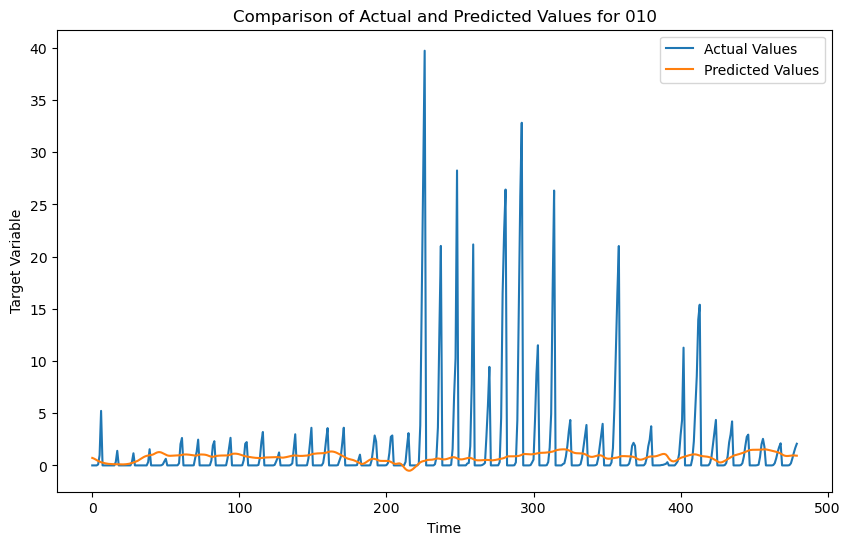

R2 Score: -0.03299554196589538
MSE: 22.264045122865785
RMSE: 4.718479111203713
MAE: 1.87615503876796



In [10]:
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score


df_test = test_df[cols].astype(float)

# Use the scaler from the training to transform the test data
df_test_scaled1= scaler.fit(df_test)
df_test_scaled = scaler.transform(df_test)

# Initialize the lists for testX and testY
testX = []
testY = []


# Prepare testX and testY
for i in range(n_past, len(df_test_scaled) - n_future + 1):
    testX.append(df_test_scaled[i - n_past:i])
    testY.append(df_test_scaled[i + n_future - 1:i + n_future, -1])  # Assuming the last column is still the target

testX, testY = np.array(testX), np.array(testY)



n_days_for_prediction = 480



target_scaler = StandardScaler()
target_scaler.fit(df_test[['target']])


# Predict on the last n_days_for_prediction
prediction_scaled = model.predict(testX[-n_days_for_prediction:])
prediction = target_scaler.inverse_transform(prediction_scaled)
actual = target_scaler.inverse_transform(testY[-n_days_for_prediction:])


# Calculate the metrics
r2 = r2_score(actual, prediction)
mse = mean_squared_error(actual, prediction)
rmse = np.sqrt(mse)
mae = mean_absolute_error(actual, prediction)

# Plotting
plt.figure(figsize=(10,6))
plt.plot(actual, label='Actual Values')
plt.plot(prediction, label='Predicted Values')
plt.title(f'Comparison of Actual and Predicted Values for 010')
plt.xlabel('Time')
plt.ylabel('Target Variable')
plt.legend()
plt.show()


print(f"R2 Score: {r2}")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}\n")